
# Productividad de pozos

Analisis estadístico y simulación de gasto en pozos. 

Información de producción histórica de hidrocarburos de la CNH.

In [1]:
from __future__ import division

import warnings


from datetime import datetime, timedelta,date
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np


#import Keras
import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.optimizers import Adam 
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
from keras.layers import LSTM
from sklearn.model_selection import KFold, cross_val_score, train_test_split

Using TensorFlow backend.


In [2]:
import chart_studio
chart_studio.tools.set_credentials_file(username='ffftelias', api_key='••••••••••')

import chart_studio.plotly as py
import plotly.graph_objects as go

In [3]:
warnings.filterwarnings("ignore")

In [4]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy
import scipy.stats
from scipy.optimize import curve_fit
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

import timeit

import ruptures as rpt

In [5]:
pd.set_option('display.max_rows', 100_000_000)
pd.set_option('display.max_columns', 100_000_000)
pd.set_option('display.width', 1_000)
pd.set_option('precision', 2)
pd.options.display.float_format = '{:,.2f}'.format

# Función Productividad de pozos

In [6]:
def productividad():
    
    global campo
    global unique_well_list
    global input_campo
    global well_data
    global results
    
    tic=timeit.default_timer()
    
###########      DISTRIBUCION DE PROBABILIDAD   ####### 
    
    class Distribution(object):
    
        def __init__(self,dist_names_list = []):
            self.dist_names = ['beta',
                                'expon',
                                'gamma',
                                'lognorm',
                                'norm',
                                'pearson3',
                                'triang',
                                'uniform',
                                'weibull_min', 
                                'weibull_max']
            self.dist_results = []
            self.params = {}

            self.DistributionName = ""
            self.PValue = 0
            self.Param = None

            self.isFitted = False


        def Fit(self, y):
            self.dist_results = []
            self.params = {}
            for dist_name in self.dist_names:
                dist = getattr(scipy.stats, dist_name)
                param = dist.fit(y)

                self.params[dist_name] = param
                #Applying the Kolmogorov-Smirnov test
                D, p = scipy.stats.kstest(y, dist_name, args=param);
                self.dist_results.append((dist_name,p))
            #select the best fitted distribution
            sel_dist,p = (max(self.dist_results,key=lambda item:item[1]))
            #store the name of the best fit and its p value
            self.DistributionName = sel_dist
            self.PValue = p

            self.isFitted = True
            return self.DistributionName,self.PValue

        def Random(self, n = 1):
            if self.isFitted:
                dist_name = self.DistributionName
                param = self.params[dist_name]
                #initiate the scipy distribution
                dist = getattr(scipy.stats, dist_name)
                return dist.rvs(*param[:-2], loc=param[-2], scale=param[-1], size=n)
            else:
                raise ValueError('Must first run the Fit method.')

        def Plot(self,y):
            x = self.Random(n=len(y))
            fig, ax = plt.subplots(figsize=(16,8))
            plt.hist(x, alpha=0.5, label='Fitted',bins=50)
            plt.hist(y, alpha=0.5, label='Actual',bins=50)
            plt.legend(loc='upper right')

    
#############      ESTADISTICA DE POZOS   ####### 
    
    
    #Carga de datos   
    mx_stats=pd.read_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/mexico/mx_benchmark.csv',
                         #index_col=1,
                         low_memory=False)
    
    display('Numero de datos en BD: '+str(len(mx_stats)))
    
    #Input de campo
    input_campo = input("Nombre de Campo: ")
    
    selected_rows=mx_stats.pozo.str.contains(str(input_campo))
    campo=mx_stats.loc[selected_rows]

    display('Numero de datos para '+str(input_campo)+': ' +str(len(campo)))
    
    unique_well_list=pd.unique(campo['pozo'])

    display('Número de pozos en ' +str(input_campo)+': '+str(len(unique_well_list)),
            unique_well_list)
    
    #Estadistica descriptiva
    display('Percentiles y estadistica descriptiva: ')
    display(campo.aceite_Mbd.quantile([.1,.5,.9]),
            campo.describe())  
    
    #Analisis de dispersion
    fig, ax = plt.subplots(figsize=(16,8))
    ax.scatter(campo.pozo,campo.aceite_Mbd)
    ax.set_xlabel('Pozo')
    ax.set_xticklabels(labels=campo.pozo,rotation=90)
    ax.set_ylabel('Gasto de aceite Mbd')
    plt.show()
    
    #Ajuste de distribucion
    dst=Distribution()
    display(dst.Fit(campo.aceite_Mbd))
    dst.Plot(campo.aceite_Mbd)
    
    #Generacion de archivo de resultados
    campo.to_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/'+str(input_campo)+str('.csv'))

########      ANALISIS DE DECLINACION DE POZOS      ####### 
    
    def remove_nan_and_zeroes_from_columns(df, variable):
        """
        This function cleans up a dataframe by removing rows in a specific 
        column that are null/NaN or equal to 0. This basically removes zero 
        production time periods.
        Arguments:
        df: Pandas dataframe.
        variable: String. Name of the column where we want to filter out
        NaN's or 0 values
        Output:
        filtered_df: Pandas dataframe. Dataframe with NaN's and zeroes filtered out of 
        the specified column
        """
        filtered_df = df[(df[variable].notnull()) & (df[variable]>0)]
        return filtered_df

    def generate_time_delta_column(df, time_column, date_first_online_column):
        """
        Create column for the time that a well has been online at each reading, with 
        the first non-null month in the series listed as the start of production
        Arguments:
        df: Pandas dataframe
        time_column: String. Name of the column that includes the specific record date
        that the data was taken at. Column type is pandas datetime
        date_first_online_column: Name of the column that includes the date that the
        well came online. Column type is pandas datetime
        Outputs:
        Pandas series containing the difference in days between the date the well
        came online and the date that the data was recorded (cumulative days online)
        """
        df['days_online']=(df[time_column]-df[date_first_online_column]).dt.days
        return (df[time_column]-df[date_first_online_column]).dt.days

    def get_min_or_max_value_in_column_by_group(dataframe, group_by_column, calc_column, calc_type):
        global value
        """
        This function obtains the min or max value for a column, with a group by applied. For example,
        it could return the earliest (min) RecordDate for each API number in a dataframe 
        Arguments:
        dataframe: Pandas dataframe 
        group_by_column: string. Name of column that we want to apply a group by to
        calc_column: string. Name of the column that we want to get the aggregated max or min for
        calc_type: string; can be either 'min' or 'max'. Defined if we want to pull the min value 
        or the max value for the aggregated column
        Outputs:
        value: Depends on the calc_column type.
        """
        value=dataframe.groupby(group_by_column)[calc_column].transform(calc_type)
        return value

    def get_max_initial_production(df, number_first_months, variable_column, date_column):
        global df_beginning_production
        """
        This function allows you to look at the first X months of production, and selects 
        the highest production month as max initial production
        Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
        """
        #First, sort the data frame from earliest to most recent prod date
        df=df.sort_values(by=date_column)
        #Pull out the first x months of production, where number_first_months is x
        df_beginning_production=df.head(number_first_months)
        #Return the max value in the selected variable column from the newly created 
        #df_beginning_production df
        return df_beginning_production[variable_column].max()

    def hyperbolic_equation(t, qi, b, di):
        """
        Hyperbolic decline curve equation
        Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        b: Float. Hyperbolic decline constant
        di: Float. Nominal decline rate at time t=0
        Output: 
        Returns q, or the expected production rate at time t. Float.
        """
        return qi/((1.0+b*di*t)**(1.0/b))

    def exponential_equation(t, qi, di):
        """
        Exponential decline curve equation
        Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
        Output: 
        Returns q, or the expected production rate at time t. Float.
        """
        return qi*np.exp(-di*t)

    def harmonic_equation (t, qi, di):
        """
        Harmonic decline curve equation
        Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
        Output: 
        Returns q, or the expected production rate at time t. Float.
        """
        return qi/(1+(di*t))

    def plot_actual_vs_predicted_by_equations(df, x_variable, y_variables, plot_title):
        """
        This function is used to map x- and y-variables against each other
        Arguments:
        df: Pandas dataframe.
        x_variable: String. Name of the column that we want to set as the 
        x-variable in the plot
        y_variables: string (single), or list of strings (multiple). Name(s) 
        of the column(s) that we want to set as the y-variable in the plot
        """
        #Plot results
        df.plot(x=x_variable, y=y_variables, title=plot_title,figsize=(10,5),scalex=True, scaley=True)
        plt.show()
    
    results=pd.DataFrame()
    #Read the oil and gas data
    well_data=campo
    #Perform some data cleaning to get the columns as the right data type
    well_data['fecha']=pd.to_datetime(well_data['fecha'])
    #Declare the desired product that we want to curve fit for--it can either by 'Gas' or 'Oil'
    hydrocarbon='aceite_Mbd'
    #Remove all rows with null values in the desired time series column
    well_data=remove_nan_and_zeroes_from_columns(well_data, hydrocarbon)
    #Get a list of unique wells to loop through
    unique_well_list=pd.unique(list(well_data.pozo))
    #Get the earliest RecordDate for each Well
    well_data['first_oil']= get_min_or_max_value_in_column_by_group(well_data, group_by_column='pozo', 
                  calc_column='fecha', calc_type='min')
    #Generate column for time online delta
    well_data['days_online']=generate_time_delta_column(well_data, time_column='fecha', 
                  date_first_online_column='first_oil')
    #Pull data that came online between an specified range
    well_data_range=well_data[(well_data.fecha>='1900-01-01') & (well_data.fecha<='2019-12-01')]
    #Loop through each well, and perform calculations
    for pozo in unique_well_list:
        #Subset the dataframe by Well
        production_time_series=well_data_range[well_data_range.pozo==pozo]
        #Get the highest value of production in the first X months of production, to use as qi value
        qi=get_max_initial_production(production_time_series, 24, hydrocarbon, 'fecha')
        #Exponential curve fit the data to get best fit equation
        popt_exp, pcov_exp=curve_fit(exponential_equation, production_time_series['days_online'], 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,10]))
        print('Exponential Fit Curve-fitted Variables: qi='+str(popt_exp[0])+', di='+str(popt_exp[1]))
        #Hyperbolic curve fit the data to get best fit equation
        popt_hyp, pcov_hyp=curve_fit(hyperbolic_equation, production_time_series['days_online'], 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,2,10]))
        print('Hyperbolic Fit Curve-fitted Variables: qi='+str(popt_hyp[0])+', b='+str(popt_hyp[1])+', di='+str(popt_hyp[2]))
        #Harmonic curve fit the data to get best fit equation
        popt_harm, pcov_harm=curve_fit(harmonic_equation, production_time_series['days_online'], 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,10]))
        print('Harmonic Fit Curve-fitted Variables: qi='+str(popt_harm[0])+', di='+str(popt_harm[1]))
        #Exponential fit results
        production_time_series.loc[:,'Exponential_Predicted']=exponential_equation(production_time_series['days_online'], 
                                  *popt_exp)

        #Hyperbolic fit results
        production_time_series.loc[:,'Hyperbolic_Predicted']=hyperbolic_equation(production_time_series['days_online'], 
                                  *popt_hyp)
        #Harmonic fit results
        production_time_series.loc[:,'Harmonic_Predicted']=harmonic_equation(production_time_series['days_online'], 
                                  *popt_harm)
        
        #Error
        perr = np.sqrt(np.diag(pcov_harm))

        production_time_series.loc[:,'Qi_harmonic']=popt_harm[0]
        production_time_series.loc[:,'di_harmonic']=popt_harm[1]
        production_time_series.loc[:,'Error Qo_harmonic']=perr[0]
        production_time_series.loc[:,'Error di_harmonic']=perr[1]
        production_time_series.loc[:,'month']=(production_time_series['aceite_Mbd'] > 0).cumsum()
        

        #Declare the x- and y- variables that we want to plot against each other
        y_variables=[hydrocarbon,'Hyperbolic_Predicted','Exponential_Predicted','Harmonic_Predicted']
        x_variable='month'
        #Create the plot title
        plot_title=hydrocarbon+' for '+str(pozo)
        #Plot the data to visualize the equation fit
        plot_actual_vs_predicted_by_equations(production_time_series, x_variable, y_variables, plot_title)

        results=results.append(production_time_series,sort=True)
    
    #####################  RESULTADOS DCA   #####################

    results.to_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/'+str(input_campo)+'_dca.csv')
    
    fig2, ax2 = plt.subplots(figsize=(16,8))
    plt.hist(results.aceite_Mbd, alpha=0.5, label='Qo Historico',bins=50)
    plt.hist(results.Hyperbolic_Predicted, alpha=0.5, label='Hyperbolic Predicted',bins=50)
    plt.legend(loc='upper right')
    
    #results=results.groupby(by='pozo')
    fig3, ax3 = plt.subplots(figsize=(16,8))
    ax3.scatter(results.month,results.aceite_Mbd,cmap='viridis')
    ax3.set_xlabel('month')
    ax3.set_ylabel('Qo')
    plt.show()

    toc=timeit.default_timer()
    tac= toc - tic #elapsed time in seconds

    return display('Tiempo de procesamiento: ' +str(tac)+' segundos')

'Numero de datos en BD: 2838332'

Nombre de Campo: SANCHEZ


'Numero de datos para SANCHEZ: 18986'

'Número de pozos en SANCHEZ: 252'

array(['SANCHEZ MAGALLANES-448', 'SANCHEZ MAGALLANES-455',
       'SANCHEZ MAGALLANES-449', 'SANCHEZ MAGALLANES-751',
       'SANCHEZ MAGALLANES-797', 'SANCHEZ MAGALLANES-450',
       'SANCHEZ MAGALLANES-458', 'SANCHEZ MAGALLANES-461',
       'SANCHEZ MAGALLANES-463', 'SANCHEZ MAGALLANES-464',
       'SANCHEZ MAGALLANES-752', 'SANCHEZ MAGALLANES-457',
       'SANCHEZ MAGALLANES-713', 'SANCHEZ MAGALLANES-456A',
       'SANCHEZ MAGALLANES-465', 'SANCHEZ MAGALLANES-601',
       'SANCHEZ MAGALLANES-468', 'SANCHEZ MAGALLANES-467',
       'SANCHEZ MAGALLANES-469', 'SANCHEZ MAGALLANES-466',
       'SANCHEZ MAGALLANES-470', 'SANCHEZ MAGALLANES-933',
       'SANCHEZ MAGALLANES-951D', 'SANCHEZ MAGALLANES-603',
       'SANCHEZ MAGALLANES-703', 'SANCHEZ MAGALLANES-932',
       'SANCHEZ MAGALLANES-476', 'SANCHEZ MAGALLANES-701',
       'SANCHEZ MAGALLANES-954', 'SANCHEZ MAGALLANES-473',
       'SANCHEZ MAGALLANES-711', 'SANCHEZ MAGALLANES-605',
       'SANCHEZ MAGALLANES-731', 'SANCHEZ MAGALLANES-9

'Percentiles y estadistica descriptiva: '

0.10   0.01
0.50   0.05
0.90   0.19
Name: aceite_Mbd, dtype: float64

,Unnamed: 0,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"18,986.00","18,986.00","18,986.00","18,986.00","18,986.00","18,986.00"
mean,"351,678.16",0.08,0.01,0.00,0.11,0.04
std,"210,903.00",0.09,0.03,0.00,0.14,0.32
min,"27,047.00",0.00,-0.00,0.00,0.00,0.00
25%,"132,298.25",0.03,0.00,0.00,0.03,0.00
50%,"377,199.50",0.05,0.00,0.00,0.06,0.00
75%,"535,183.75",0.10,0.01,0.00,0.13,0.00
max,"714,446.00",0.96,0.46,0.00,1.62,13.18


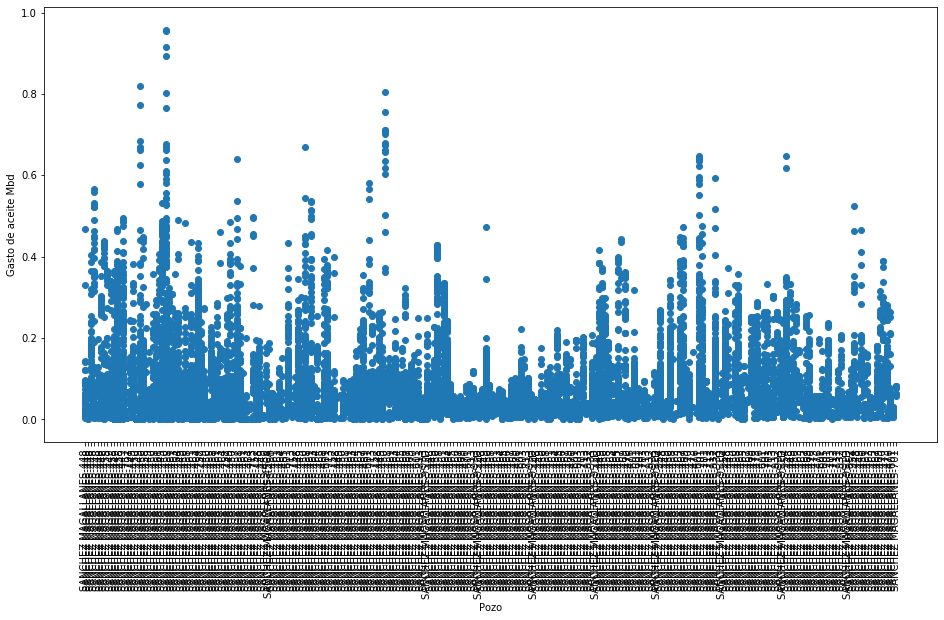

('lognorm', 2.814222326721534e-10)

Exponential Fit Curve-fitted Variables: qi=0.01677300009209696, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2300523766077925, b=0.9172612795555323, di=0.003971291241890256
Harmonic Fit Curve-fitted Variables: qi=0.23085594601358034, di=0.0042274319222905124


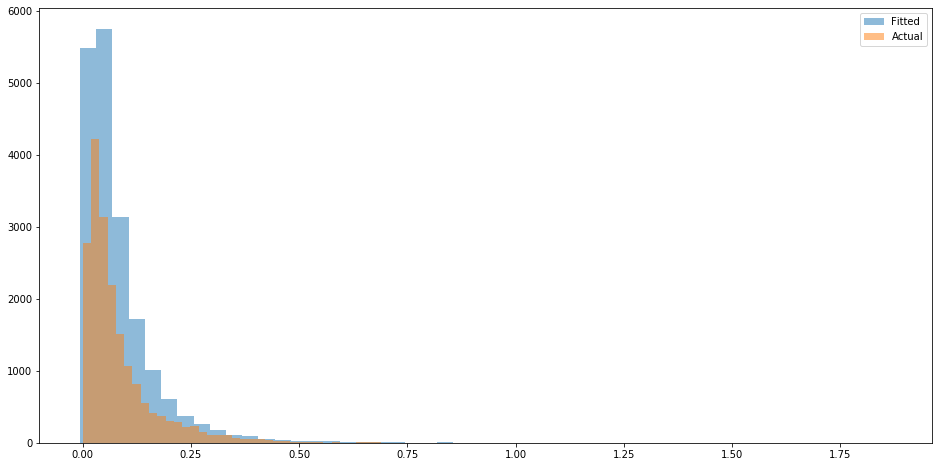

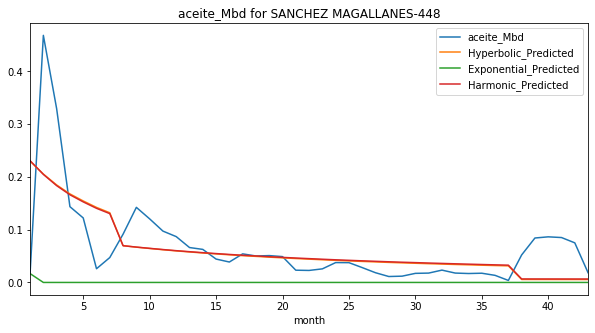

Exponential Fit Curve-fitted Variables: qi=0.0540919996338225, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03979821400763866, b=0.45782922170536566, di=4.1392414592742695e-12
Harmonic Fit Curve-fitted Variables: qi=0.0397982458414498, di=1.2616692907106662e-13


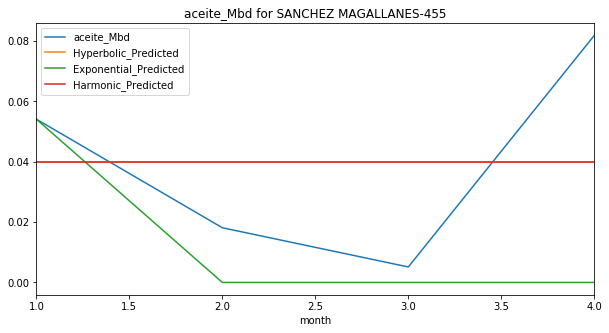

Exponential Fit Curve-fitted Variables: qi=0.36578194278483334, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.4008181574521931, b=1.9999999999999998, di=0.004571418500355677
Harmonic Fit Curve-fitted Variables: qi=0.3290140993611258, di=0.0015319724639606851


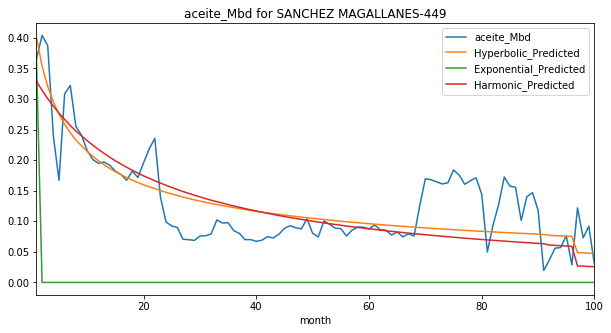

Exponential Fit Curve-fitted Variables: qi=0.020128627890230382, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2687569969801526, b=1.4095519736228317e-11, di=0.00011977951244204498
Harmonic Fit Curve-fitted Variables: qi=0.25163352424951835, di=9.61247496045601e-05


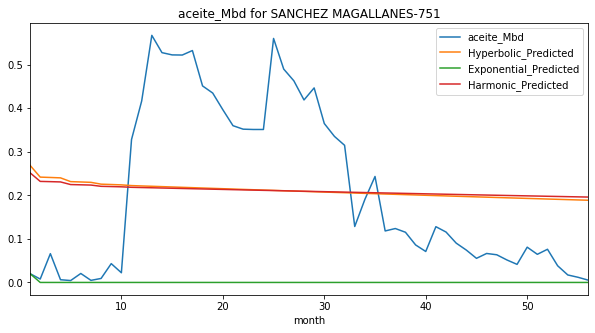

Exponential Fit Curve-fitted Variables: qi=0.0031458188018129475, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05135718548069669, b=0.002821212181385979, di=3.5668962972947983e-16
Harmonic Fit Curve-fitted Variables: qi=0.05135718081177503, di=2.925280281415296e-15


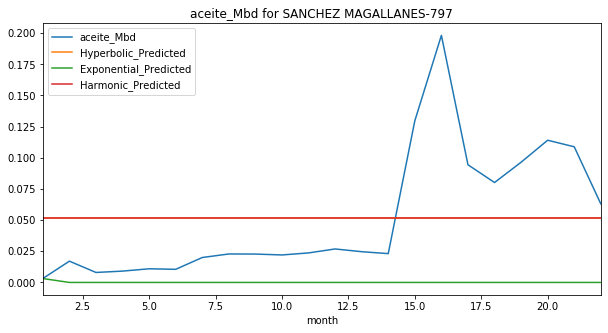

Exponential Fit Curve-fitted Variables: qi=0.17451200194912964, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3676029796969695, b=8.309614578855013e-11, di=0.0015755264212075682
Harmonic Fit Curve-fitted Variables: qi=0.3814588746768404, di=0.0031692348390094157


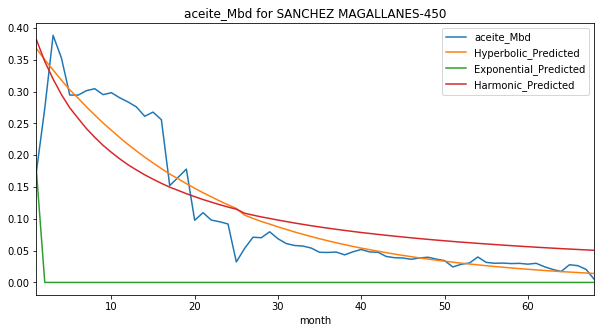

Exponential Fit Curve-fitted Variables: qi=0.05371500084174136, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.4388049999998062, b=4.581885344862259e-12, di=0.0012806300844710695
Harmonic Fit Curve-fitted Variables: qi=0.43880499999734585, di=0.0020254878441309473


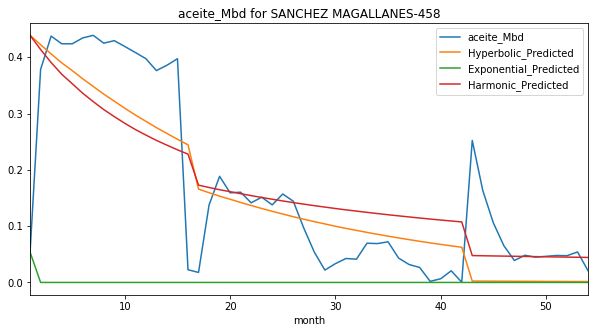

Exponential Fit Curve-fitted Variables: qi=0.1506910000001148, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.36523399999999995, b=0.7410686859591988, di=0.0018706641402147096
Harmonic Fit Curve-fitted Variables: qi=0.36523399999999995, di=0.0023019075746775


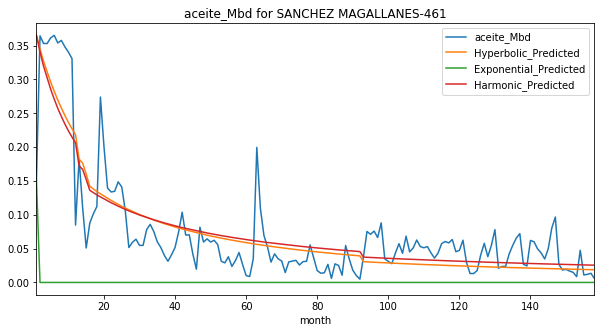

Exponential Fit Curve-fitted Variables: qi=0.0576021071856327, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.32287374745985975, b=8.229099383017505e-09, di=0.001528819399863383
Harmonic Fit Curve-fitted Variables: qi=0.3175273092100422, di=0.0021010791805166165


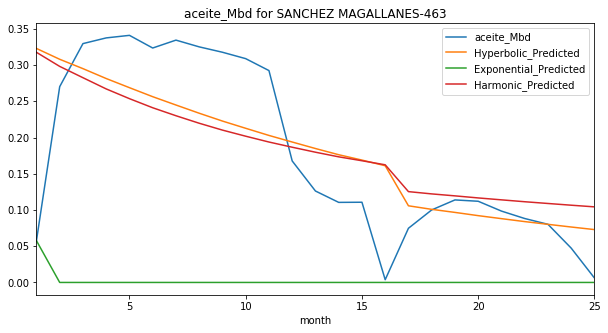

Exponential Fit Curve-fitted Variables: qi=0.07706000191555533, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16570372762366856, b=2.183306448721017e-08, di=0.00011642157354767408
Harmonic Fit Curve-fitted Variables: qi=0.17048852654558386, di=0.0001681131806759835


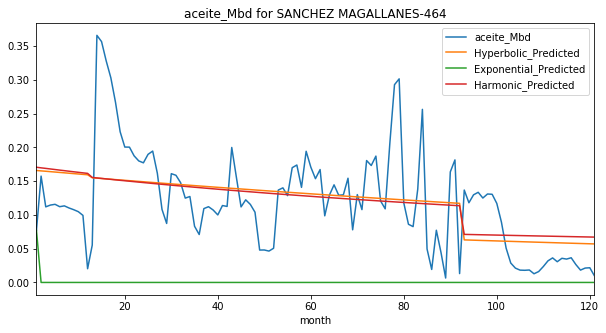

Exponential Fit Curve-fitted Variables: qi=0.06873917222387951, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16180730216163405, b=1.8408153774901944e-13, di=1.654060223789807e-05
Harmonic Fit Curve-fitted Variables: qi=0.16042967094777216, di=1.4810142244891054e-05


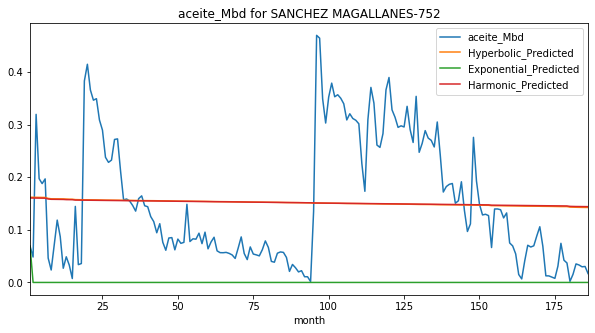

Exponential Fit Curve-fitted Variables: qi=0.0009825, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0009825, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.0009825, di=5.0


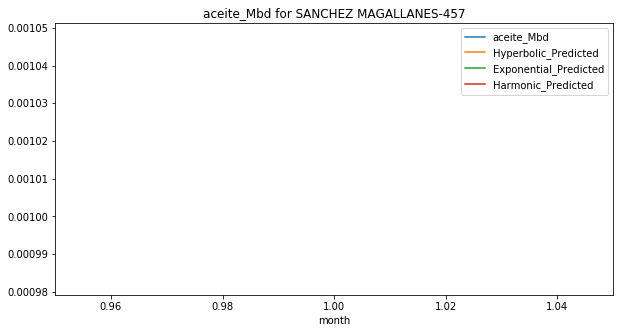

Exponential Fit Curve-fitted Variables: qi=0.15370202814495182, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3785687380414545, b=2.3565757395907518e-09, di=0.0005306844724095341
Harmonic Fit Curve-fitted Variables: qi=0.38468227152830153, di=0.0010318653716158783


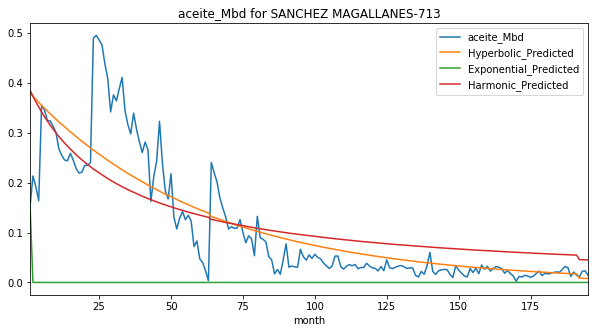

Exponential Fit Curve-fitted Variables: qi=0.0672552568359375, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0673209987027322, b=2.8139772351618833e-11, di=0.0019727287533284257
Harmonic Fit Curve-fitted Variables: qi=0.06728415621488883, di=0.003542535277796198


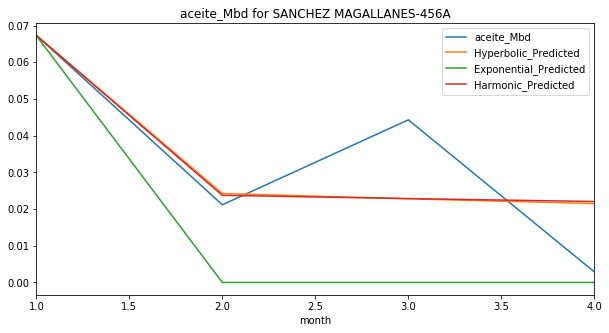

Exponential Fit Curve-fitted Variables: qi=0.0366030000046853, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16424392287522532, b=1.773594892495274, di=0.0020798105886443265
Harmonic Fit Curve-fitted Variables: qi=0.16067373641622773, di=0.0015327777813465915


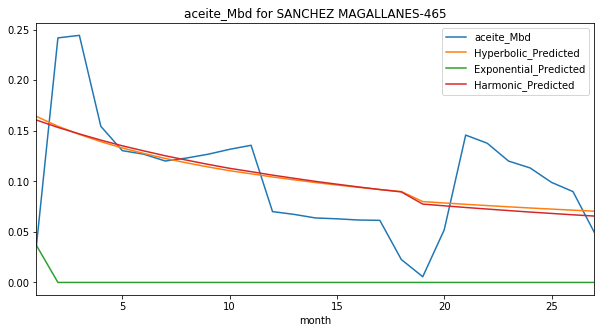

Exponential Fit Curve-fitted Variables: qi=0.08483100062775559, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2859101402963792, b=0.636255729438594, di=0.0014745993632477525
Harmonic Fit Curve-fitted Variables: qi=0.29915485118834967, di=0.0020054313185600683


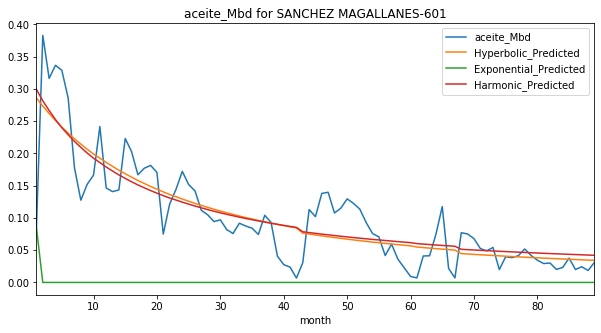

Exponential Fit Curve-fitted Variables: qi=0.0003666250000000001, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0003666250000000001, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.0003666250000000001, di=5.0


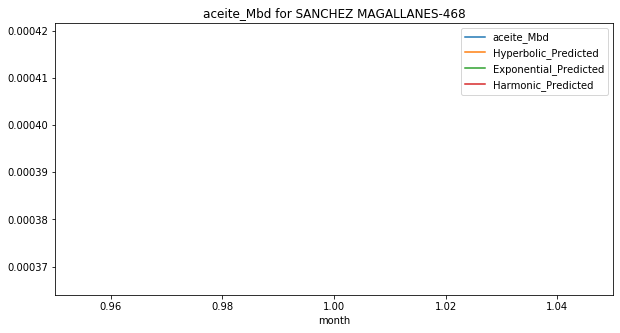

Exponential Fit Curve-fitted Variables: qi=0.0018450698713910962, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3363034003112176, b=7.187828225512163e-08, di=0.0004158635306482979
Harmonic Fit Curve-fitted Variables: qi=0.3079120798321592, di=0.0005574721885612711


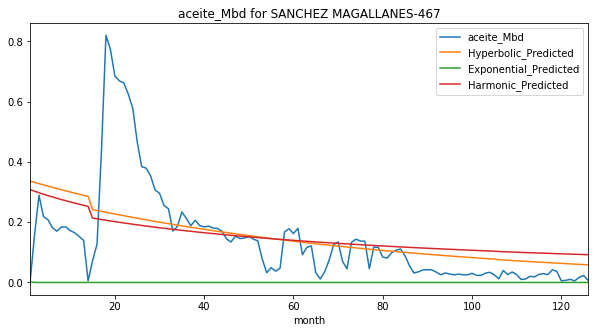

Exponential Fit Curve-fitted Variables: qi=0.002232043983359422, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1077229999999994, b=4.5617649243312035e-14, di=0.00012864380259825398
Harmonic Fit Curve-fitted Variables: qi=0.1077229999999993, di=0.0001646699422065895


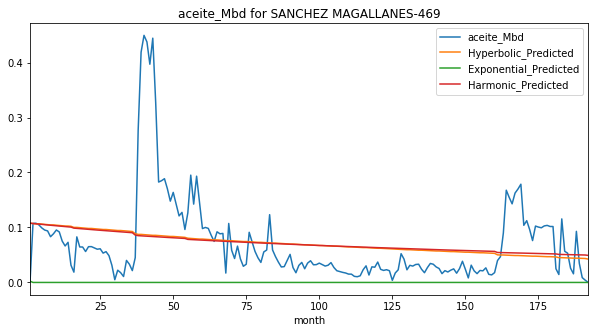

Exponential Fit Curve-fitted Variables: qi=0.11735500000007318, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1908874681593093, b=0.007439256026661942, di=3.3115571501881474e-05
Harmonic Fit Curve-fitted Variables: qi=0.19084001187979452, di=2.773215153604112e-05


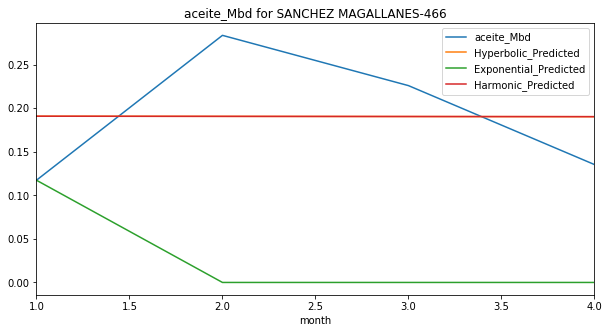

Exponential Fit Curve-fitted Variables: qi=0.16463157421875, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.164711999999986, b=0.7930667811186013, di=0.012100206999096487
Harmonic Fit Curve-fitted Variables: qi=0.16471199999999997, di=0.01385714574895745


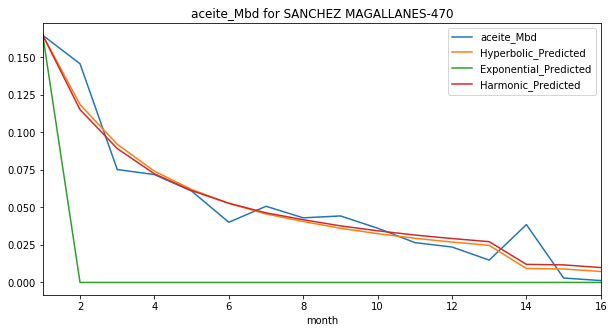

Exponential Fit Curve-fitted Variables: qi=0.2591799999992719, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.32930210727937603, b=1.3621485285363177, di=0.005538610486996597
Harmonic Fit Curve-fitted Variables: qi=0.31371744000287266, di=0.003773732103452678


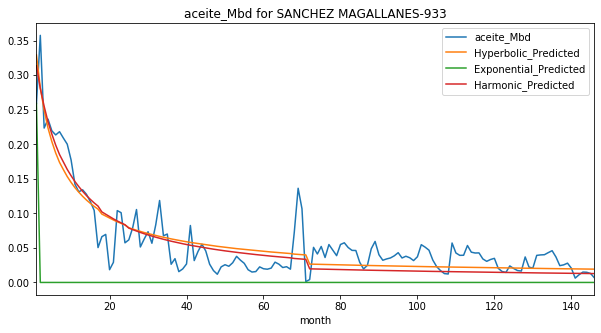

Exponential Fit Curve-fitted Variables: qi=0.20630495717974184, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13457503749930283, b=0.41161892315007487, di=4.248941522947791e-23
Harmonic Fit Curve-fitted Variables: qi=0.13457503697415124, di=1.0819934162216886e-15


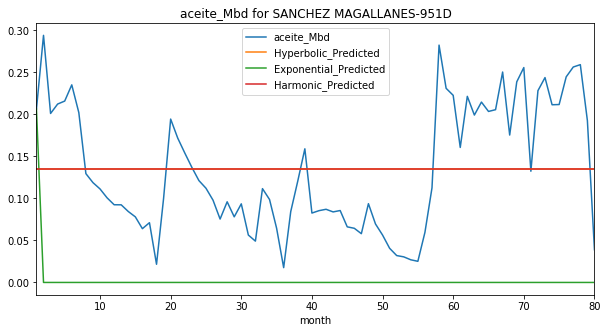

Exponential Fit Curve-fitted Variables: qi=0.0960310001276332, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17467602785990738, b=7.929775736663906e-08, di=0.00019262497390359199
Harmonic Fit Curve-fitted Variables: qi=0.16481082207614076, di=0.00016249438401526076


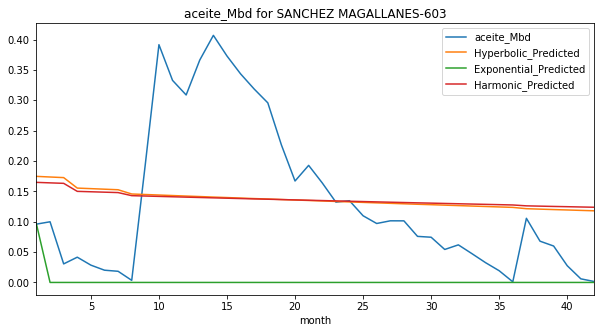

Exponential Fit Curve-fitted Variables: qi=0.2882829986109035, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.37548534011320206, b=8.129740585278254e-15, di=0.0003720797971016856
Harmonic Fit Curve-fitted Variables: qi=0.39779285055608116, di=0.0007810394724558987


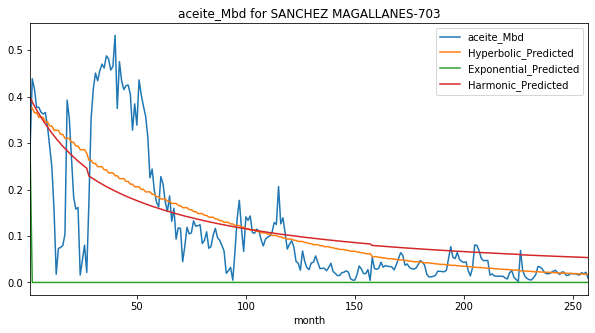

Exponential Fit Curve-fitted Variables: qi=0.6766358043869065, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.8370035383238849, b=0.27893885964352516, di=0.0007835937608027345
Harmonic Fit Curve-fitted Variables: qi=0.9582729999999999, di=0.0017145238192805806


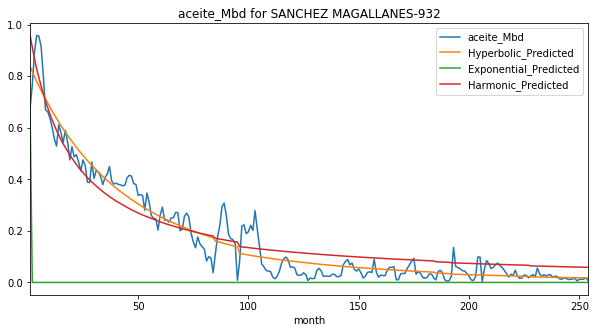

Exponential Fit Curve-fitted Variables: qi=0.11384500001023144, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18307896036608923, b=1.0687140224601414e-07, di=0.0002953327107890769
Harmonic Fit Curve-fitted Variables: qi=0.18479118931384325, di=0.0003968325998013234


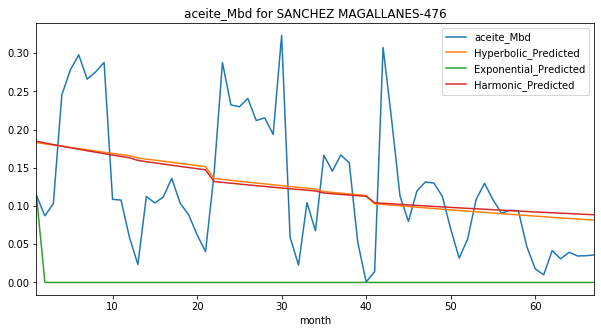

Exponential Fit Curve-fitted Variables: qi=0.10175300310187896, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1549159828420049, b=1.2162803168760338e-12, di=0.00037969553771609343
Harmonic Fit Curve-fitted Variables: qi=0.16146166484467878, di=0.0006732659842903173


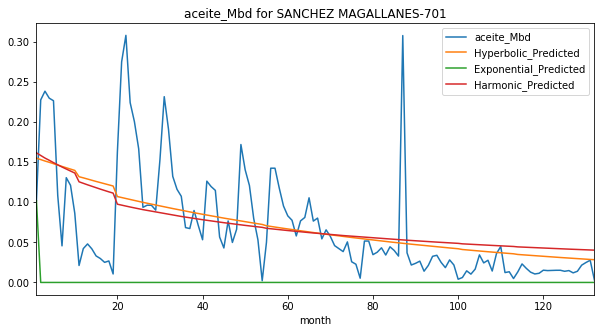

Exponential Fit Curve-fitted Variables: qi=0.1211699868971739, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07178105773322424, b=1.9492530419634724e-11, di=9.752023038586738e-18
Harmonic Fit Curve-fitted Variables: qi=0.07178105760207575, di=1.7872960423488984e-16


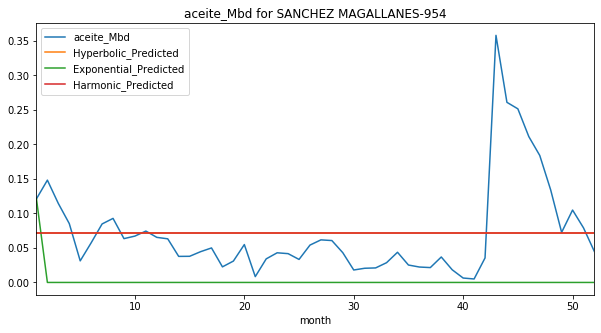

Exponential Fit Curve-fitted Variables: qi=0.1456190817038023, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1370431057715807, b=8.93503671921866e-08, di=0.00011300814617054045
Harmonic Fit Curve-fitted Variables: qi=0.13282566568004783, di=0.0001275682108652361


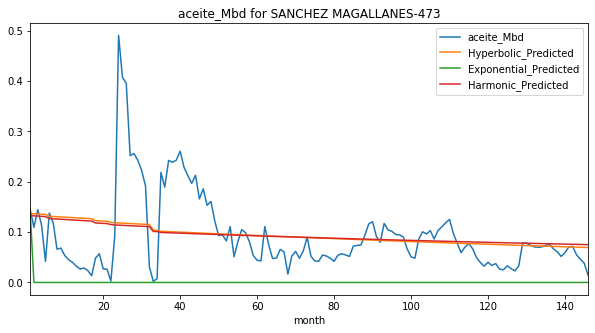

Exponential Fit Curve-fitted Variables: qi=0.00446404365035551, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.041479355106574446, b=2.43987181450563e-06, di=0.00013590349180573916
Harmonic Fit Curve-fitted Variables: qi=0.041300979962701455, di=0.00016274143661689915


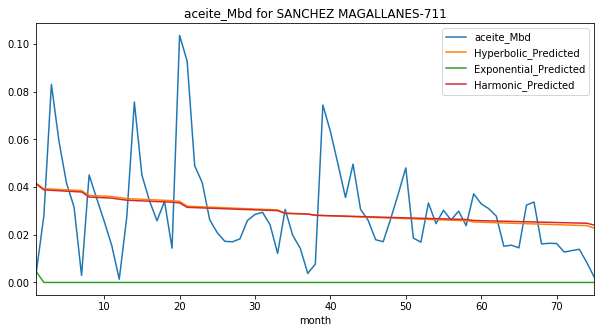

Exponential Fit Curve-fitted Variables: qi=0.013493005281572646, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11860327289976678, b=1.2537212184220434e-08, di=0.0001938887500771673
Harmonic Fit Curve-fitted Variables: qi=0.12208727919990313, di=0.0002918356023381026


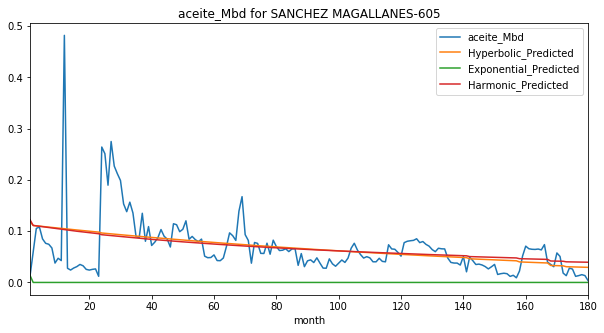

Exponential Fit Curve-fitted Variables: qi=0.036521004069254376, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06835954830091569, b=2.6832783971755096e-07, di=0.00019547316245598607
Harmonic Fit Curve-fitted Variables: qi=0.06707028168070545, di=0.0002160339597835796


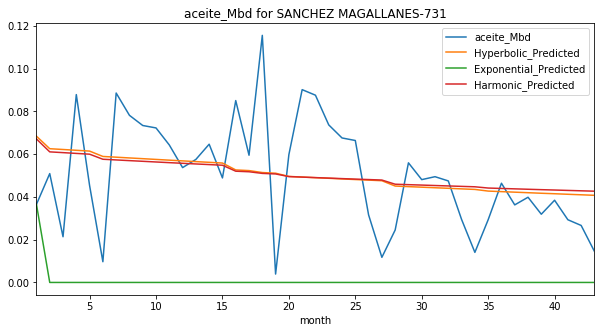

Exponential Fit Curve-fitted Variables: qi=0.01481100144258063, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09734852851200915, b=1.8849276439414364e-06, di=1.7673097484091026e-18
Harmonic Fit Curve-fitted Variables: qi=0.09734852820318006, di=3.556706100846122e-15


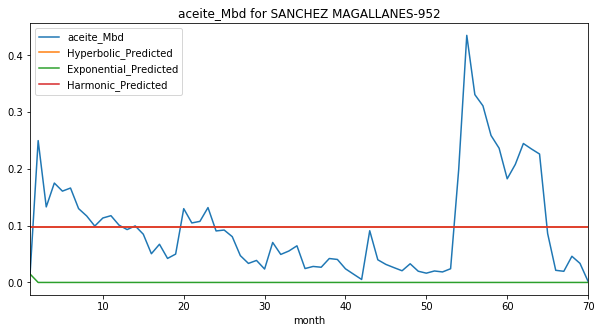

Exponential Fit Curve-fitted Variables: qi=0.0917501049392272, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10680789153689735, b=1.9999999999999998, di=0.00026790168011829867
Harmonic Fit Curve-fitted Variables: qi=0.09629329237441629, di=0.00013496374650533922


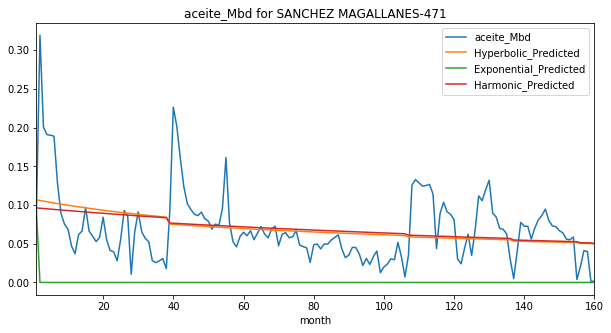

Exponential Fit Curve-fitted Variables: qi=0.07344913140261565, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.30679975263099246, b=1.2755441732780023e-09, di=0.00033381055203319723
Harmonic Fit Curve-fitted Variables: qi=0.32433046480617267, di=0.0006240753219543486


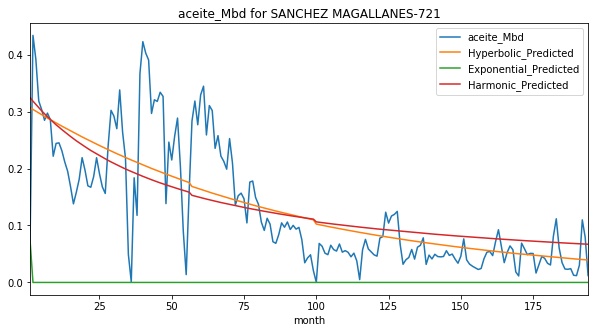

Exponential Fit Curve-fitted Variables: qi=0.146409999996578, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18367936268674817, b=3.7925120253314615e-08, di=0.00043781354639906467
Harmonic Fit Curve-fitted Variables: qi=0.20423828899650656, di=0.0008881127879045764


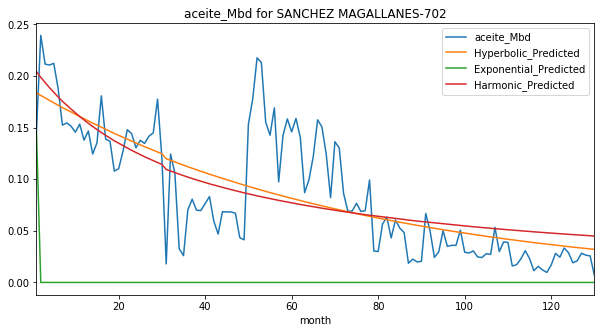

Exponential Fit Curve-fitted Variables: qi=0.27437799682617187, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.274444999997289, b=1.9999999999999998, di=0.016363443602959497
Harmonic Fit Curve-fitted Variables: qi=0.231482742961805, di=0.00521619050342158


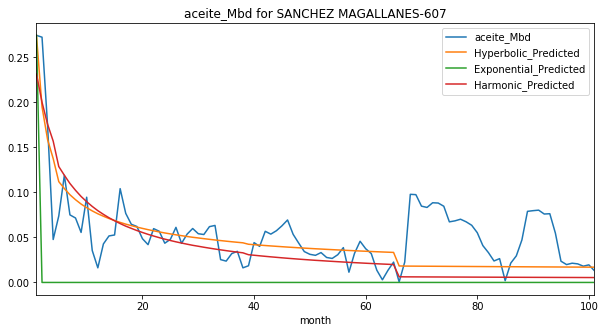

Exponential Fit Curve-fitted Variables: qi=0.0011369739816035737, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.015903374237092555, b=5.251369694994623e-10, di=4.057634747359546e-15
Harmonic Fit Curve-fitted Variables: qi=0.015903347791775338, di=4.3000163342235513e-13


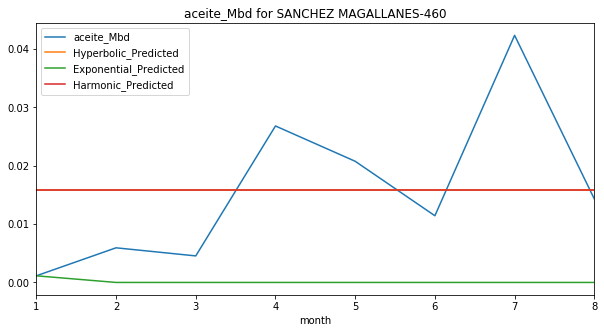

Exponential Fit Curve-fitted Variables: qi=0.1600249693956394, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20147058002682325, b=6.189758245864051e-09, di=0.00046484612045484904
Harmonic Fit Curve-fitted Variables: qi=0.2008208147066118, di=0.0005968348429970042


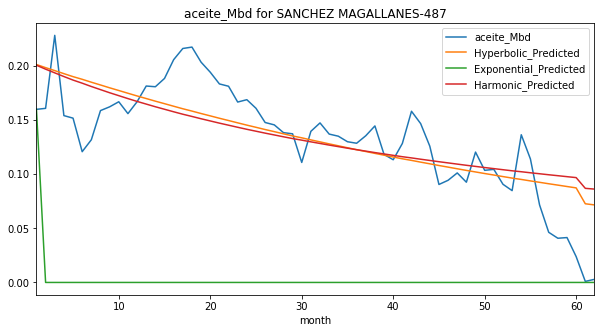

Exponential Fit Curve-fitted Variables: qi=0.00021586092283088878, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05167889998865891, b=1.5028709538037377, di=3.762272229276221e-18
Harmonic Fit Curve-fitted Variables: qi=0.05167889706858032, di=2.229780436577401e-12


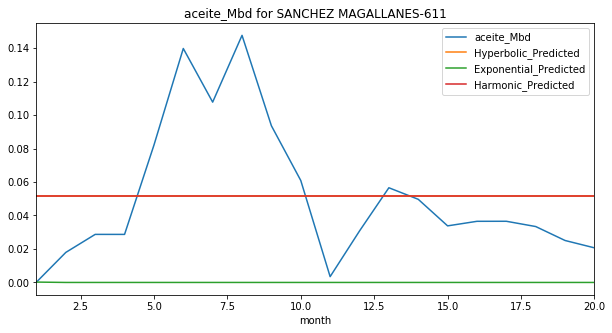

Exponential Fit Curve-fitted Variables: qi=0.09941900053445497, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2496594675281305, b=0.6139548981619071, di=0.002570404984201751
Harmonic Fit Curve-fitted Variables: qi=0.25502535645346047, di=0.003356568687234957


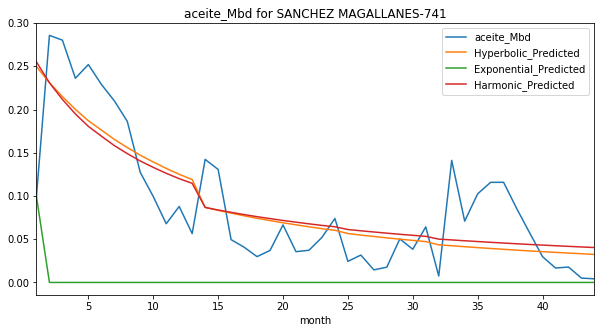

Exponential Fit Curve-fitted Variables: qi=0.130492000000314, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3125635603936837, b=0.964326192730574, di=0.005792187456872451
Harmonic Fit Curve-fitted Variables: qi=0.313064116813394, di=0.005971511761315805


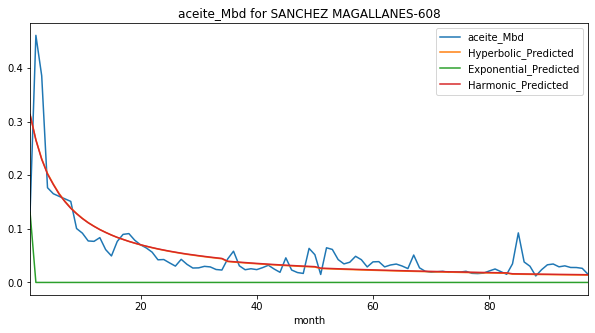

Exponential Fit Curve-fitted Variables: qi=0.10147499999953889, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14675998616355204, b=0.9537188900923042, di=0.007219669476691925
Harmonic Fit Curve-fitted Variables: qi=0.14675925399302728, di=0.007407248633305237


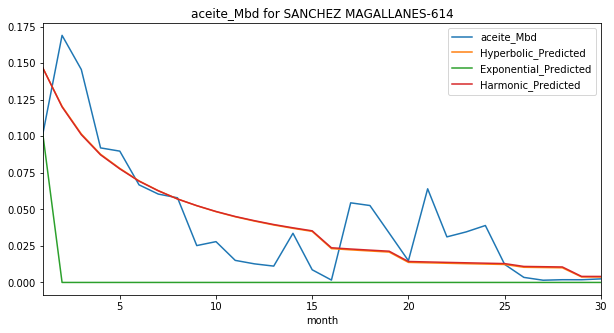

Exponential Fit Curve-fitted Variables: qi=0.24777591021183407, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2911014799493198, b=0.39415324947729335, di=0.0020678087783848886
Harmonic Fit Curve-fitted Variables: qi=0.29831899999999995, di=0.003117878563071325


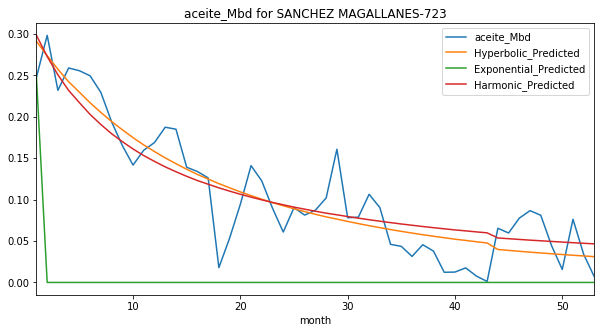

Exponential Fit Curve-fitted Variables: qi=0.10770200078365393, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3979972811159017, b=2.1304750328547137e-08, di=0.0010071078037010071
Harmonic Fit Curve-fitted Variables: qi=0.40133520841787024, di=0.0015209475005975696


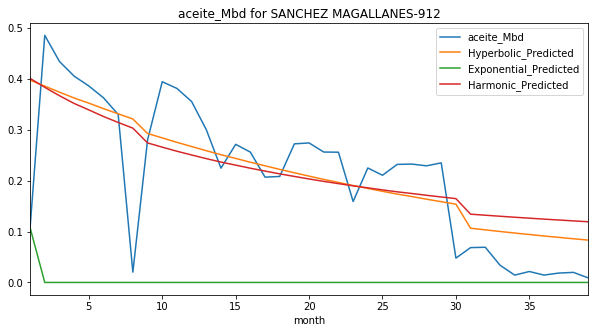

Exponential Fit Curve-fitted Variables: qi=0.01000300451814336, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07032576678249154, b=4.386790248442242e-06, di=0.00017029456381602892
Harmonic Fit Curve-fitted Variables: qi=0.06888500125633763, di=0.00019523227268395513


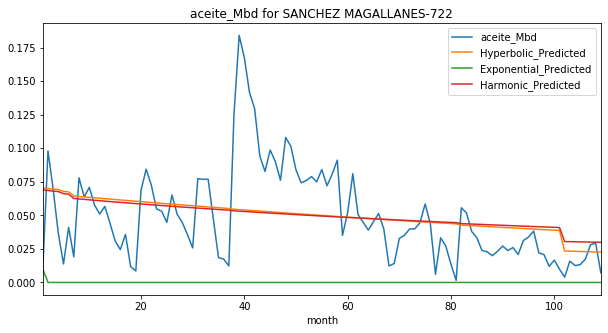

Exponential Fit Curve-fitted Variables: qi=0.4690569999958395, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.563231185782773, b=1.0692998523063246, di=0.0025536202007368555
Harmonic Fit Curve-fitted Variables: qi=0.5554930498937382, di=0.00236644373355694


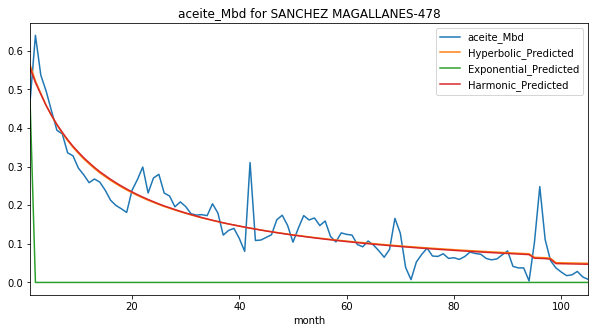

Exponential Fit Curve-fitted Variables: qi=0.20606199913183526, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.30536719217849734, b=1.2475155793638477, di=0.0036634767622510237
Harmonic Fit Curve-fitted Variables: qi=0.29152138225197677, di=0.002778314942582704


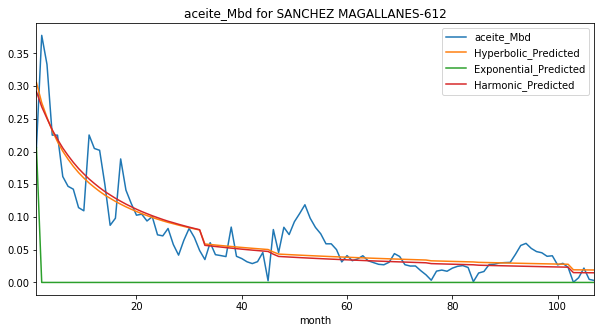

Exponential Fit Curve-fitted Variables: qi=0.04370400000424646, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0415899115920948, b=1.2564716916713217e-09, di=0.0010047977472374052
Harmonic Fit Curve-fitted Variables: qi=0.039804384564263544, di=0.0009219006571464833


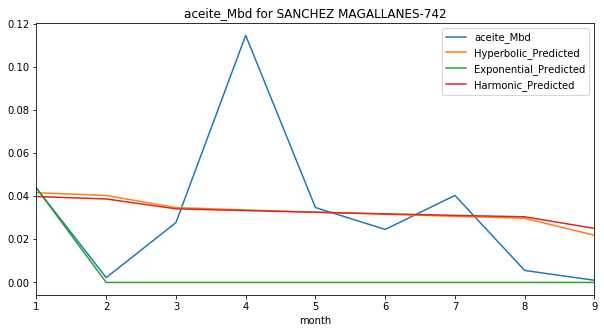

Exponential Fit Curve-fitted Variables: qi=0.056324110191288614, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05112109999972221, b=1.6480639458467639, di=8.063738726243547e-22
Harmonic Fit Curve-fitted Variables: qi=0.05112109927099206, di=2.223552315226022e-15


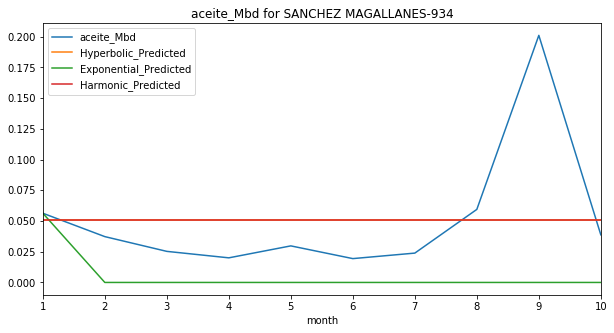

Exponential Fit Curve-fitted Variables: qi=0.025315999481318588, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02597648995956448, b=2.592239308999637e-06, di=0.00048318756547755724
Harmonic Fit Curve-fitted Variables: qi=0.025816082741957524, di=0.0005404359628408013


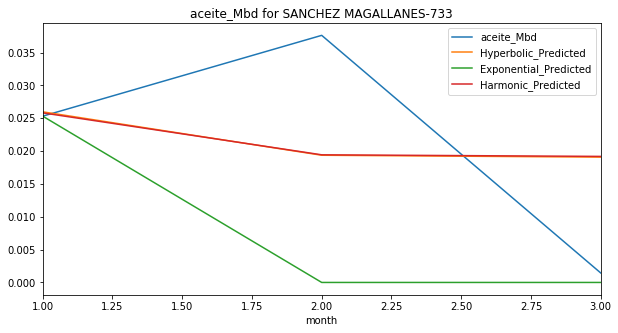

Exponential Fit Curve-fitted Variables: qi=0.49717030285644526, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.4972309999999999, b=0.6542984588149972, di=0.0052567673992076425
Harmonic Fit Curve-fitted Variables: qi=0.4972309999999999, di=0.006631513354057992


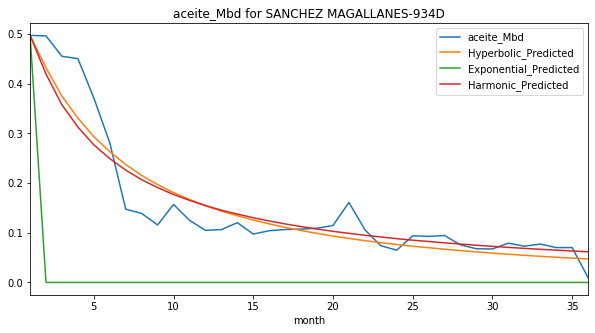

Exponential Fit Curve-fitted Variables: qi=0.08381701191140672, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13881284471276617, b=1.7604618608803724, di=0.004198064650010632
Harmonic Fit Curve-fitted Variables: qi=0.12825148270257358, di=0.002241156183326283


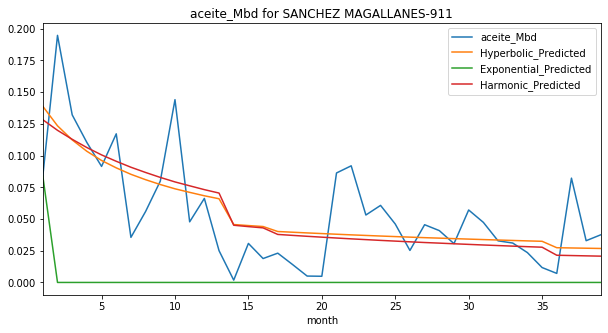

Exponential Fit Curve-fitted Variables: qi=0.18944870326352806, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19291399999999997, b=1.7940092454358074, di=0.003402546399941154
Harmonic Fit Curve-fitted Variables: qi=0.17149440044461664, di=0.0016104004234099197


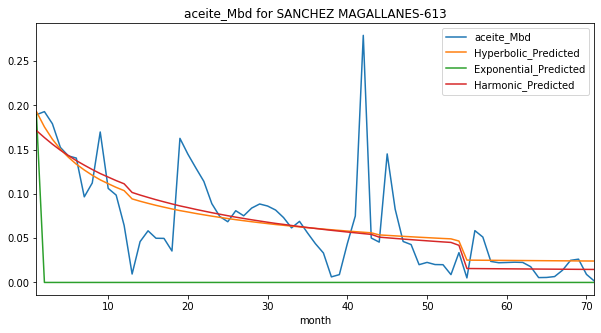

Exponential Fit Curve-fitted Variables: qi=0.003166004736640834, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019283796149770997, b=1.9999999999999998, di=6.735257607453385e-15
Harmonic Fit Curve-fitted Variables: qi=0.019283799991670632, di=6.337384000665185e-19


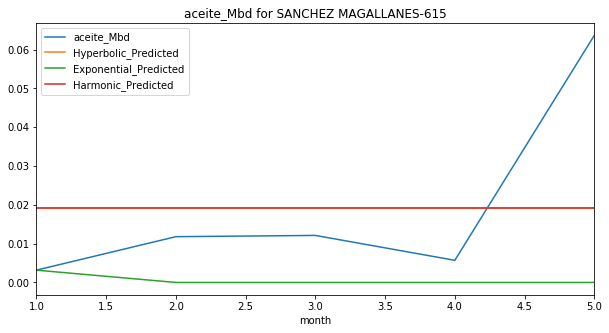

Exponential Fit Curve-fitted Variables: qi=0.03952100025776513, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1307713216795131, b=1.691035090065426e-05, di=0.0012365110783823326
Harmonic Fit Curve-fitted Variables: qi=0.13009953398824464, di=0.001442981876331579


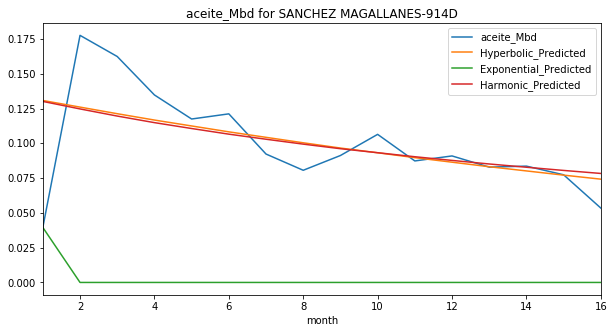

Exponential Fit Curve-fitted Variables: qi=0.08767200006801089, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1397289704973535, b=1.1917853049300597, di=0.007200386771840417
Harmonic Fit Curve-fitted Variables: qi=0.13964258897383228, di=0.006498725395366267


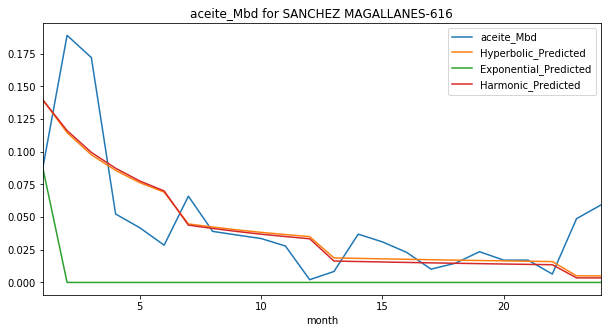

Exponential Fit Curve-fitted Variables: qi=0.018180028959261376, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.032229738886914654, b=9.369833809125261e-05, di=1.2196761942536124e-13
Harmonic Fit Curve-fitted Variables: qi=0.032229741511899175, di=8.719699763984748e-15


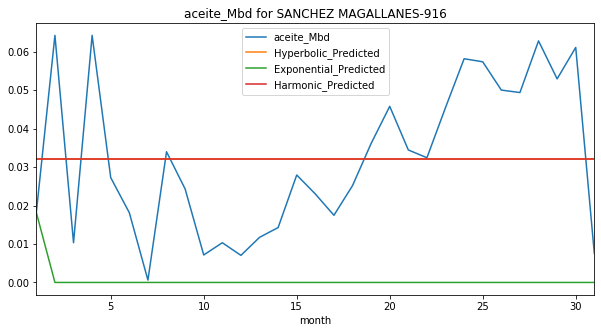

Exponential Fit Curve-fitted Variables: qi=0.03923993924510049, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03869736973886059, b=4.733088683559884e-07, di=0.0019294580174992646
Harmonic Fit Curve-fitted Variables: qi=0.03857367365573277, di=0.0025338435133021977


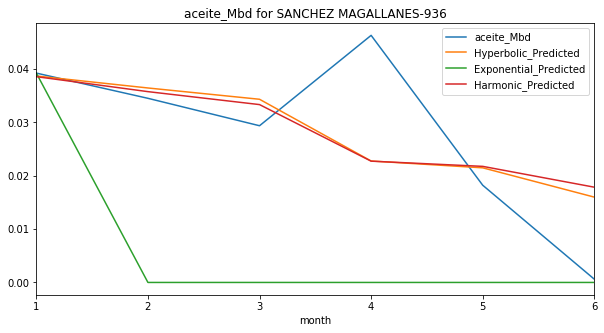

Exponential Fit Curve-fitted Variables: qi=0.05671000092522809, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.060823093228651655, b=1.9999999951405616, di=2.8321538989092067e-15
Harmonic Fit Curve-fitted Variables: qi=0.06082309090384255, di=1.3898389895307097e-17


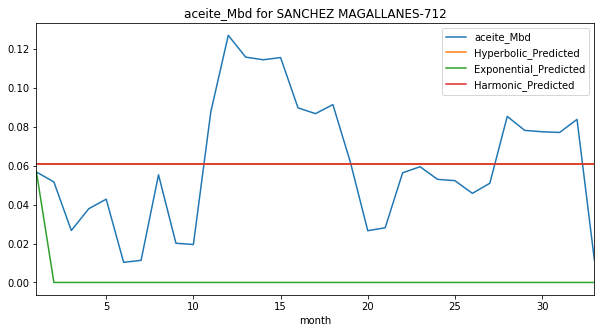

Exponential Fit Curve-fitted Variables: qi=0.15057743994140627, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15065099999999998, b=0.819239541716136, di=0.015321848545421339
Harmonic Fit Curve-fitted Variables: qi=0.15065099999999998, di=0.016968705651994702


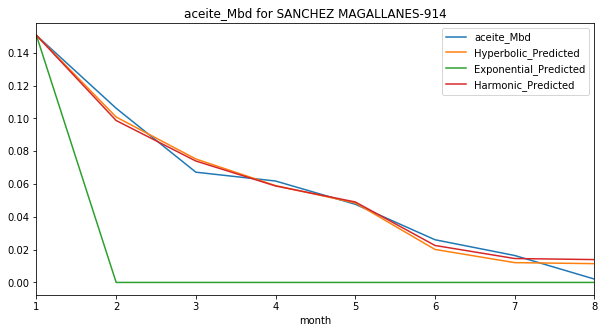

Exponential Fit Curve-fitted Variables: qi=0.0034156226930562934, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0037424167113927864, b=1.9999999746565391, di=1.2287079997384392e-07
Harmonic Fit Curve-fitted Variables: qi=0.003744068494972938, di=2.530814103911838e-07


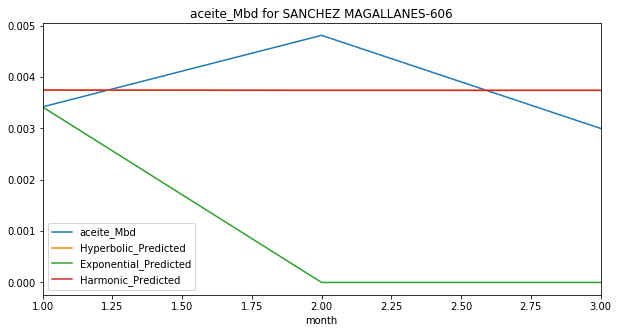

Exponential Fit Curve-fitted Variables: qi=0.15804200015208042, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.30488794412819853, b=1.2911599529730866, di=0.0016086641952549935
Harmonic Fit Curve-fitted Variables: qi=0.2907488960926227, di=0.001225019326259919


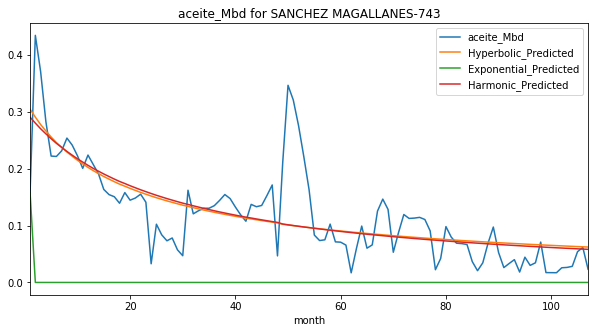

Exponential Fit Curve-fitted Variables: qi=0.03615824023437499, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03616678886635251, b=1.8317119035580847, di=0.011228094921395763
Harmonic Fit Curve-fitted Variables: qi=0.035037637600374934, di=0.006001383242190842


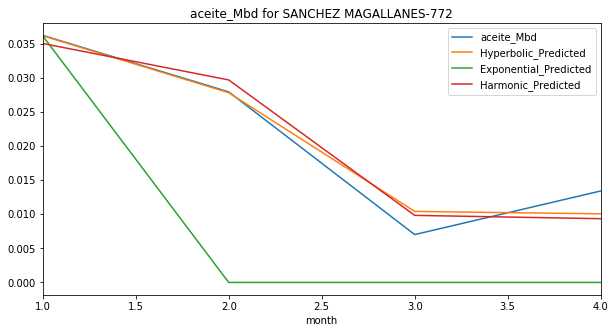

Exponential Fit Curve-fitted Variables: qi=0.03270700520105844, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.058656646826127354, b=5.013793366181393e-06, di=0.0007436314966319045
Harmonic Fit Curve-fitted Variables: qi=0.05864827723884396, di=0.0008252063917918881


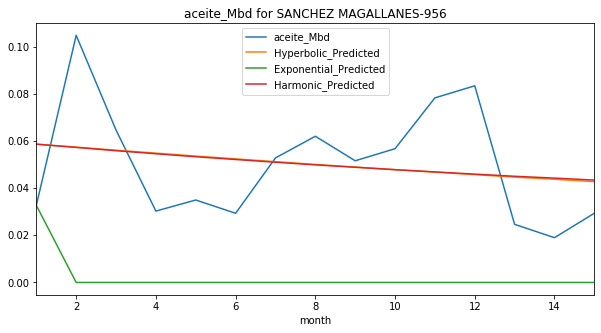

Exponential Fit Curve-fitted Variables: qi=0.03205806524936945, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2271268895698488, b=3.7266185993067424e-07, di=0.00041822797797608647
Harmonic Fit Curve-fitted Variables: qi=0.24267102191587453, di=0.0007839142984708001


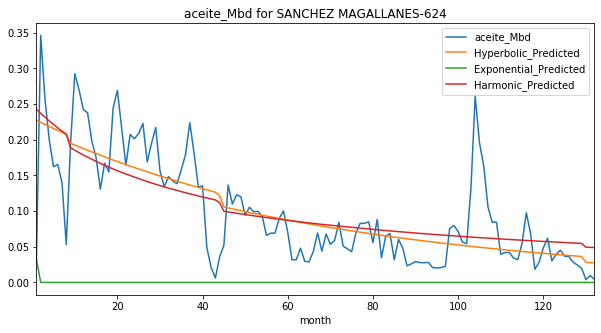

Exponential Fit Curve-fitted Variables: qi=0.30173531616210936, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.30082705423657374, b=1.2202306600225992, di=0.015830285396275703
Harmonic Fit Curve-fitted Variables: qi=0.29201474813207856, di=0.012311514512734987


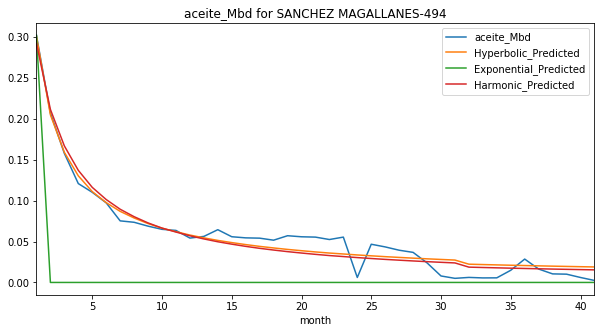

Exponential Fit Curve-fitted Variables: qi=0.23767300061721885, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5152328465557812, b=0.8206105953391274, di=0.0018488655632981847
Harmonic Fit Curve-fitted Variables: qi=0.5274502543280067, di=0.0021992947176079874


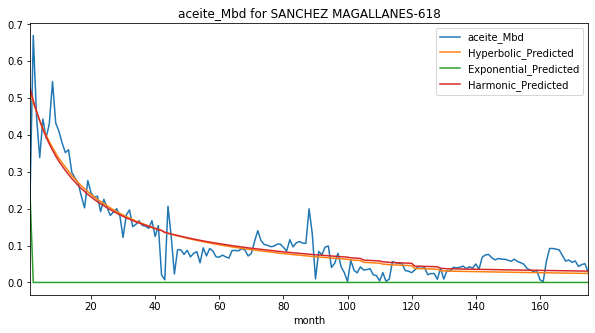

Exponential Fit Curve-fitted Variables: qi=0.013736000087439143, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03708044442611659, b=1.9993334464620178, di=3.469761316903848e-15
Harmonic Fit Curve-fitted Variables: qi=0.03708044396992115, di=9.481816129114535e-14


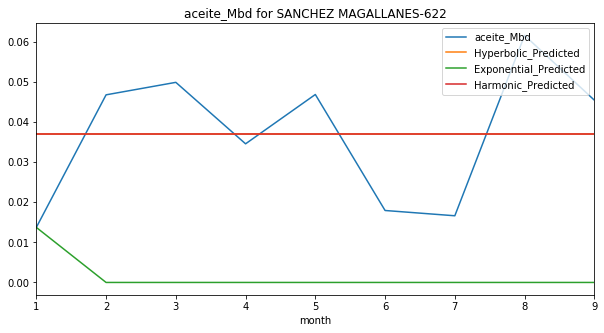

Exponential Fit Curve-fitted Variables: qi=0.010551368918221483, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5050963680839304, b=1.645853393310755e-14, di=0.0011959141909102665
Harmonic Fit Curve-fitted Variables: qi=0.5247246679654016, di=0.00239736690725879


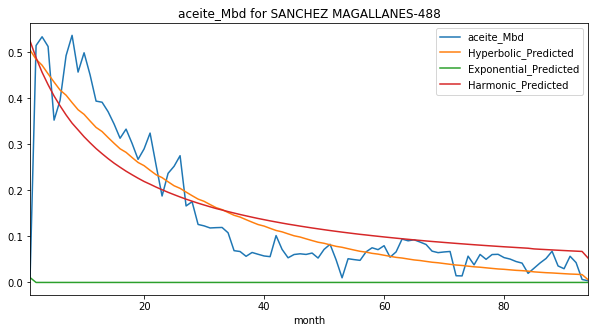

Exponential Fit Curve-fitted Variables: qi=0.058934957789428886, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07045214453603986, b=1.2153272537200874, di=1.3003914123540954e-15
Harmonic Fit Curve-fitted Variables: qi=0.07045241149943322, di=3.504599823972798e-10


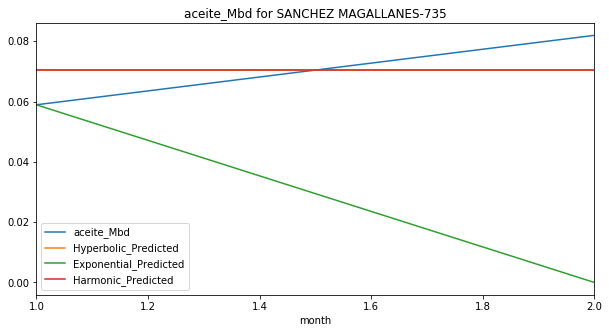

Exponential Fit Curve-fitted Variables: qi=0.057956000210983516, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11793773704462755, b=1.9999999999999998, di=5.345737417379415e-15
Harmonic Fit Curve-fitted Variables: qi=0.11793773913127216, di=3.775076762560927e-18


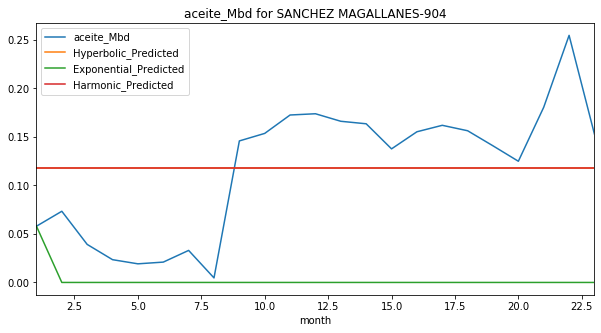

Exponential Fit Curve-fitted Variables: qi=0.0004212273013387406, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.017518209242005093, b=1.999999999708844, di=5.478578614248774e-24
Harmonic Fit Curve-fitted Variables: qi=0.01751882482232021, di=6.032863119130328e-13


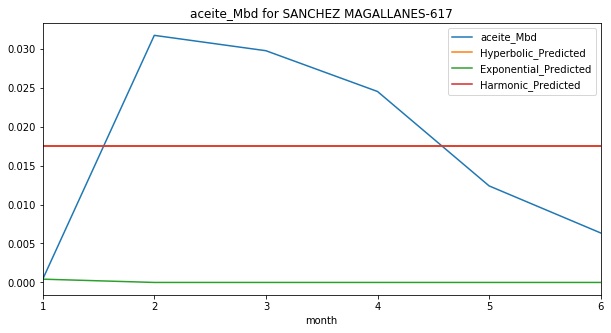

Exponential Fit Curve-fitted Variables: qi=0.3319189999986118, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3654086948111892, b=1.2981675852483887, di=0.003691895149226898
Harmonic Fit Curve-fitted Variables: qi=0.35267910478452985, di=0.0027695337117512736


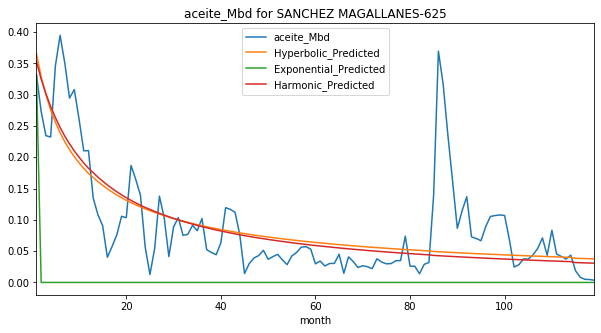

Exponential Fit Curve-fitted Variables: qi=0.0171261199111146, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17258854127408063, b=5.098878719881451e-08, di=0.00010159107582911299
Harmonic Fit Curve-fitted Variables: qi=0.16919246830586843, di=0.00011873733484852803


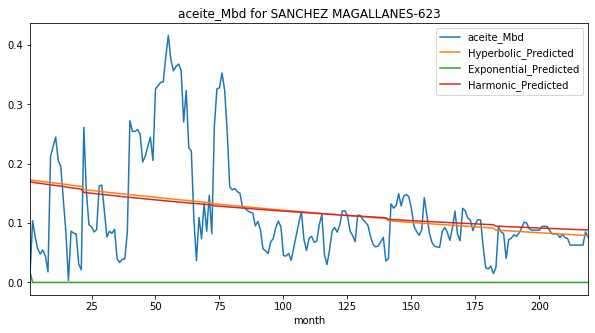

Exponential Fit Curve-fitted Variables: qi=0.07622799980291296, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07836335506675396, b=3.077832119140629e-07, di=0.0040892364497539645
Harmonic Fit Curve-fitted Variables: qi=0.08214380871786955, di=0.007440507219630732


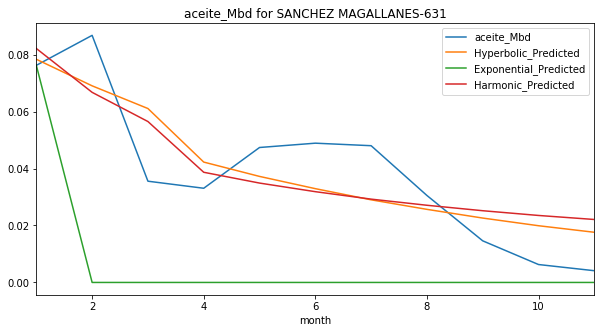

Exponential Fit Curve-fitted Variables: qi=0.02678200026169665, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2402305232936719, b=0.836971791517519, di=0.004579714660336811
Harmonic Fit Curve-fitted Variables: qi=0.23931642358492766, di=0.004995470589922098


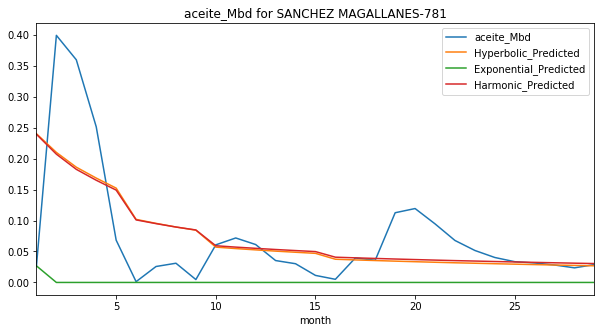

Exponential Fit Curve-fitted Variables: qi=0.052715469726562506, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0527154697265625, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.052715469726562506, di=5.0


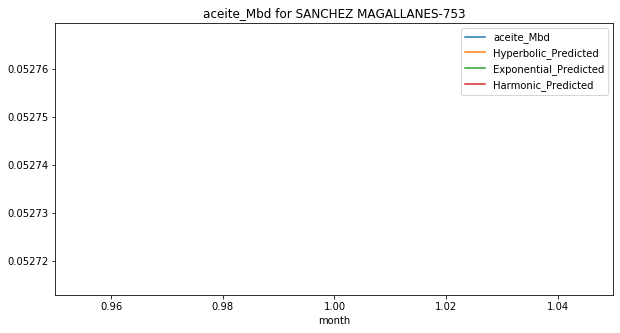

Exponential Fit Curve-fitted Variables: qi=0.0048010584783113935, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.022811496486153954, b=1.005621044719918e-06, di=0.0004767658432804661
Harmonic Fit Curve-fitted Variables: qi=0.022615966820948415, di=0.00033654575896919776


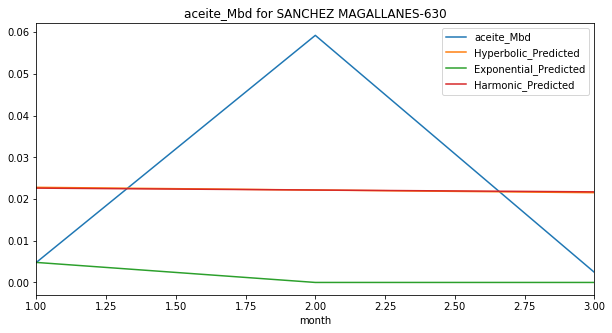

Exponential Fit Curve-fitted Variables: qi=0.03276800057383458, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04945735597000708, b=3.2639928255566214e-07, di=0.0004488507318995616
Harmonic Fit Curve-fitted Variables: qi=0.047497249769698824, di=0.0004646628046750135


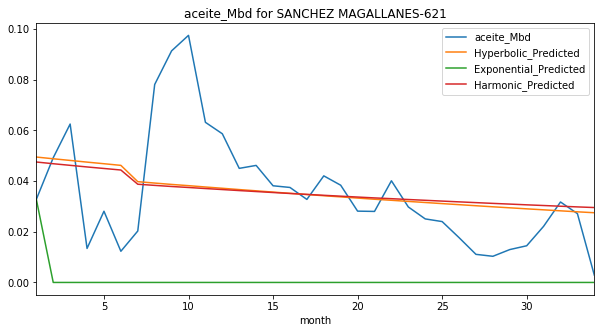

Exponential Fit Curve-fitted Variables: qi=0.056222999238235115, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0814542671060934, b=1.0747035028712365e-07, di=0.0033842429758290256
Harmonic Fit Curve-fitted Variables: qi=0.0806117436573895, di=0.00456294375922759


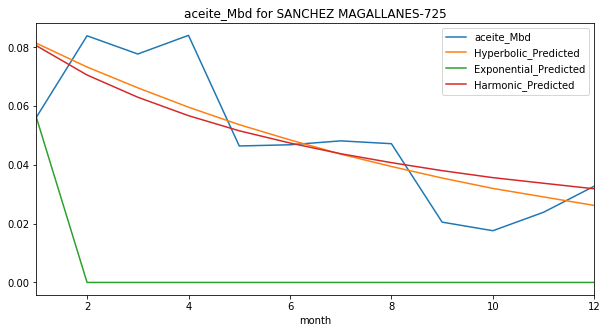

Exponential Fit Curve-fitted Variables: qi=0.09071998485644404, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08103422552967714, b=1.1681094891168443e-08, di=0.0009967096256468656
Harmonic Fit Curve-fitted Variables: qi=0.08195287465405955, di=0.0013600587609413552


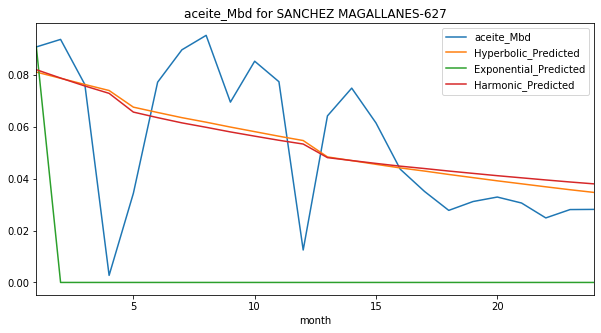

Exponential Fit Curve-fitted Variables: qi=0.010368146948789259, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.037048408005260484, b=1.4155454519659827e-07, di=1.4623145608851612e-12
Harmonic Fit Curve-fitted Variables: qi=0.037048408869726504, di=4.498075630457977e-13


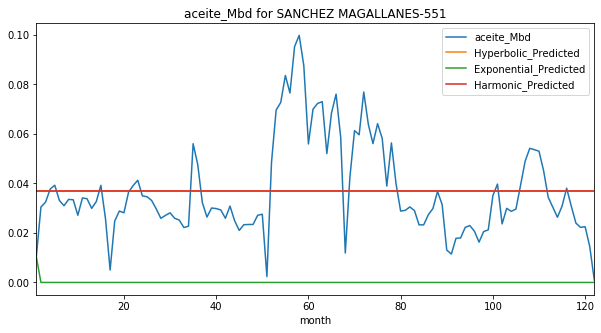

Exponential Fit Curve-fitted Variables: qi=0.08604896520846293, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07536501487774748, b=1.582692379376539e-07, di=0.00027751503856792467
Harmonic Fit Curve-fitted Variables: qi=0.07973894885820232, di=0.00044915567569463064


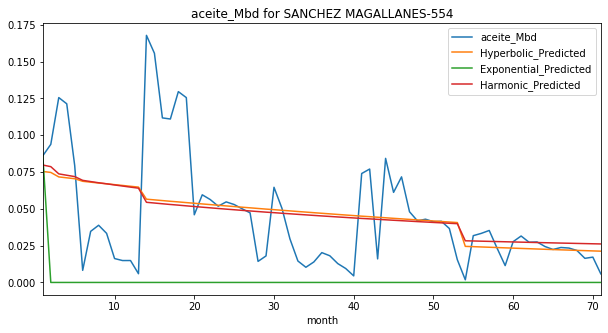

Exponential Fit Curve-fitted Variables: qi=0.026133001043877897, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13689510248003708, b=1.8370631009547422, di=0.0011853335265448056
Harmonic Fit Curve-fitted Variables: qi=0.12881712902998152, di=0.0007041035153288331


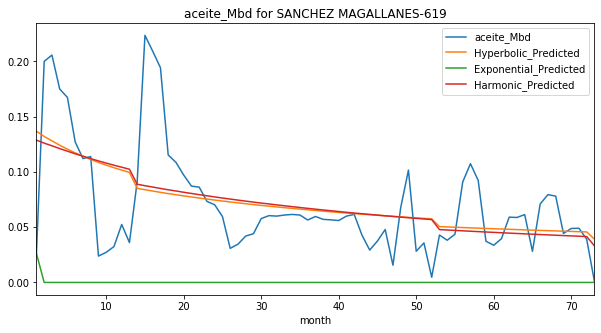

Exponential Fit Curve-fitted Variables: qi=0.06442003487076833, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14434839421425932, b=1.9203782882729647e-09, di=9.537564939530599e-05
Harmonic Fit Curve-fitted Variables: qi=0.1411715281107133, di=8.672384914135127e-05


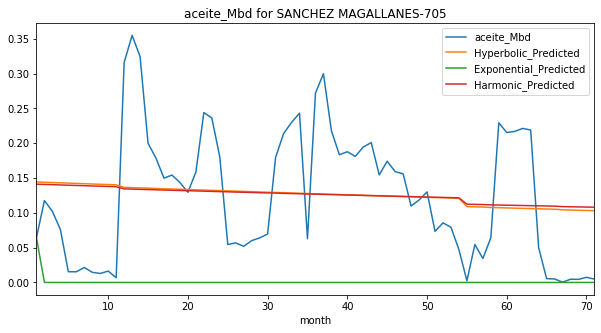

Exponential Fit Curve-fitted Variables: qi=0.0851759999170718, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06680411695413789, b=1.8352122791727553e-07, di=0.0007018433213265813
Harmonic Fit Curve-fitted Variables: qi=0.06726687510746407, di=0.0008785548843590327


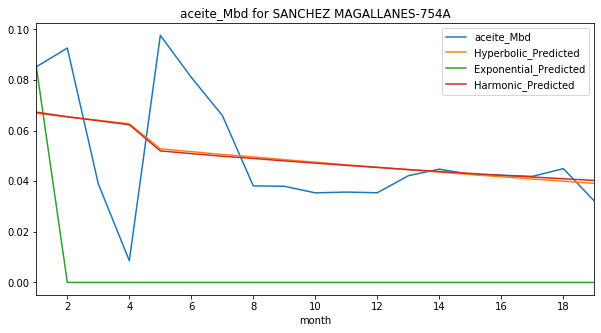

Exponential Fit Curve-fitted Variables: qi=0.00889000107566575, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.4718572333196323, b=0.49429739794311944, di=0.0023352215627126167
Harmonic Fit Curve-fitted Variables: qi=0.48231090797902343, di=0.003548655560983625


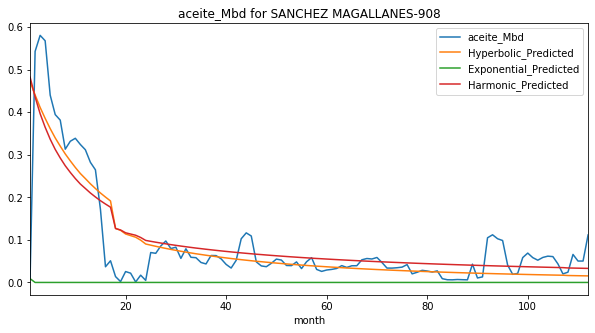

Exponential Fit Curve-fitted Variables: qi=0.005275131550909582, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14508071275880563, b=1.0881204431592923e-06, di=0.00036509801045252774
Harmonic Fit Curve-fitted Variables: qi=0.13745897682427394, di=0.0003331719903908747


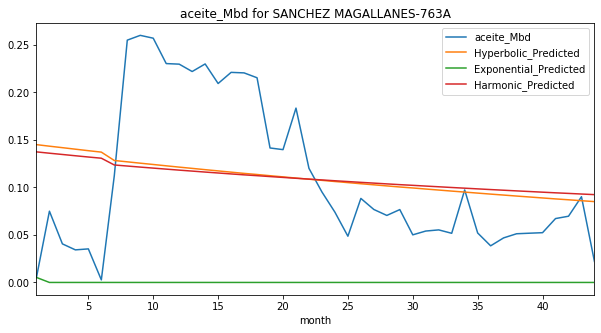

Exponential Fit Curve-fitted Variables: qi=0.11725399997698159, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13458811426047382, b=1.0484656556662184, di=0.005302848356112995
Harmonic Fit Curve-fitted Variables: qi=0.13397368285130215, di=0.0050965229055037874


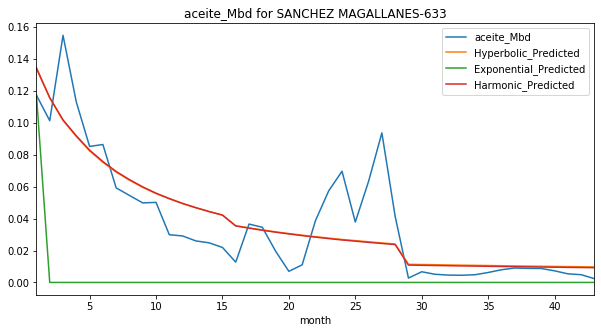

Exponential Fit Curve-fitted Variables: qi=0.061558981706000354, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08713499999999663, b=1.9999999999999998, di=1.7944217842427402e-16
Harmonic Fit Curve-fitted Variables: qi=0.08713499999999982, di=9.075907688134736e-19


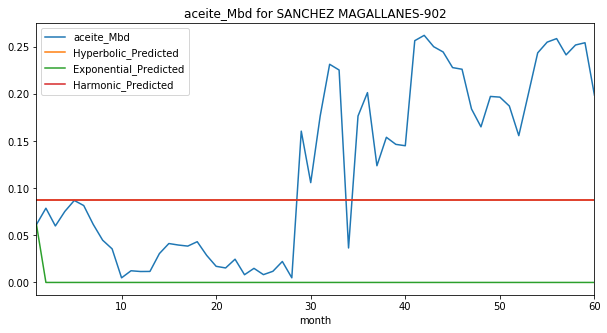

Exponential Fit Curve-fitted Variables: qi=0.04755900162580877, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07483423578473812, b=1.6186842402479e-08, di=5.792332188915478e-20
Harmonic Fit Curve-fitted Variables: qi=0.07483423571590611, di=1.415872058885671e-17


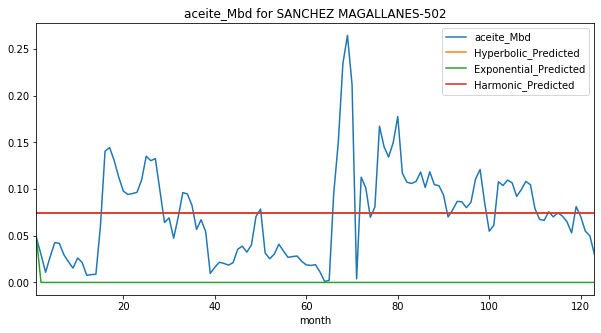

Exponential Fit Curve-fitted Variables: qi=0.6027729999606012, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.793434409660134, b=4.51635675246019e-12, di=0.001022179760585105
Harmonic Fit Curve-fitted Variables: qi=0.8051959999978824, di=0.0014920504826455828


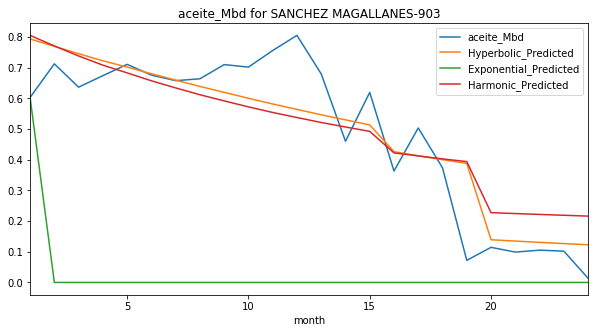

Exponential Fit Curve-fitted Variables: qi=0.054302000065454666, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11847796172332024, b=3.096342128442621e-13, di=0.0009279081402331981
Harmonic Fit Curve-fitted Variables: qi=0.12075927599808779, di=0.001350290128058241


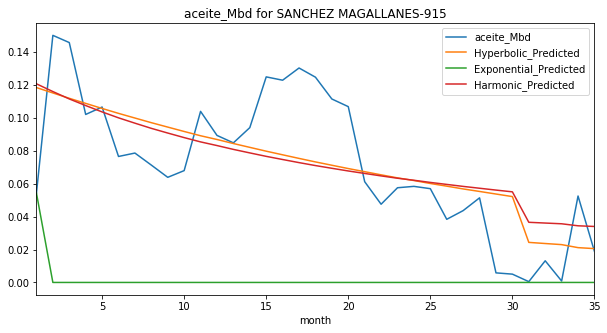

Exponential Fit Curve-fitted Variables: qi=0.0024356625736310215, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0050126536715494555, b=1.9999997224048591, di=5.506509540534408e-08
Harmonic Fit Curve-fitted Variables: qi=0.005012467685411832, di=7.33933611551548e-10


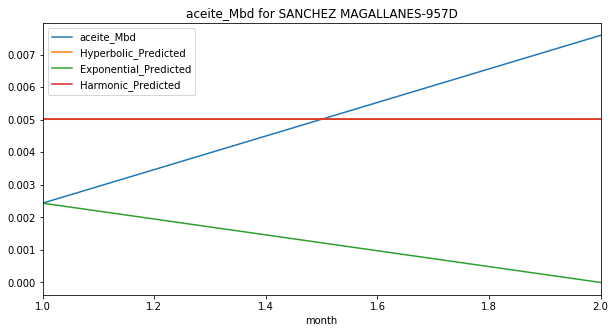

Exponential Fit Curve-fitted Variables: qi=0.020316003396648134, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14481745673386842, b=2.42093460194002e-09, di=0.0003385296023223726
Harmonic Fit Curve-fitted Variables: qi=0.14083922886079966, di=0.0003963344889045172


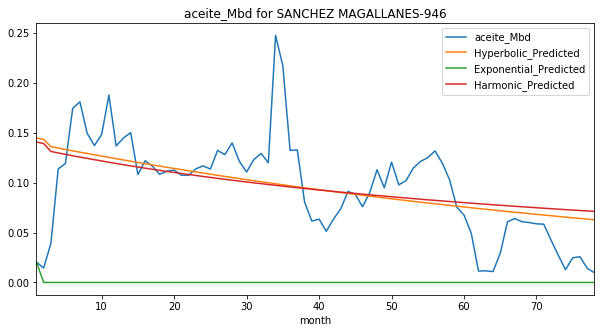

Exponential Fit Curve-fitted Variables: qi=0.027493000008174256, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07742698538677383, b=0.9448003236940169, di=0.0008498376109865827
Harmonic Fit Curve-fitted Variables: qi=0.07769540989357034, di=0.0008761327324664374


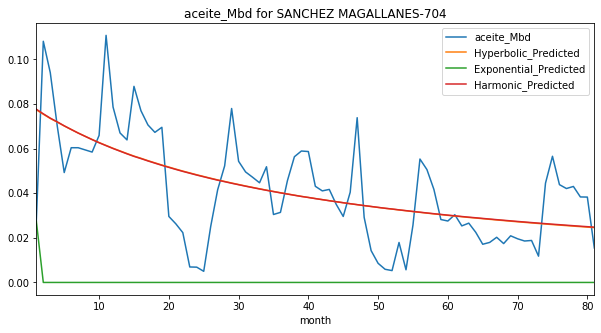

Exponential Fit Curve-fitted Variables: qi=0.037414000684242485, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07628617344880705, b=1.2593183549930835e-10, di=0.0004686464600191104
Harmonic Fit Curve-fitted Variables: qi=0.07339765987458799, di=0.0004998590642116823


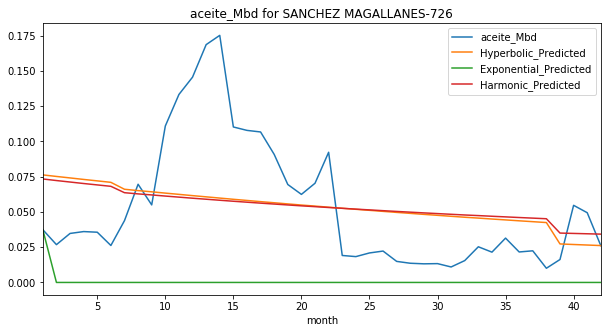

Exponential Fit Curve-fitted Variables: qi=0.2584899953353716, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.323505, b=0.42472614201741404, di=0.0023438526435063944
Harmonic Fit Curve-fitted Variables: qi=0.323505, di=0.003347791682614166


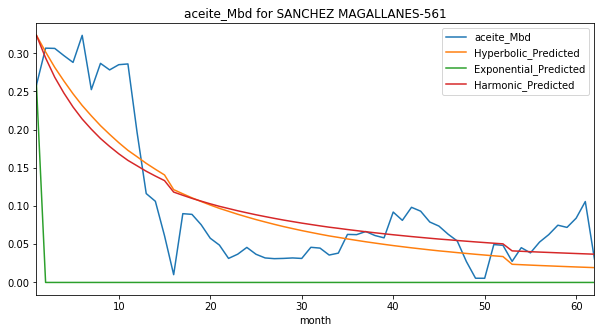

Exponential Fit Curve-fitted Variables: qi=0.06891499987299224, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.055459811015379896, b=1.9999999999999998, di=7.186592590821024e-06
Harmonic Fit Curve-fitted Variables: qi=0.055432431935843345, di=6.200499531712702e-06


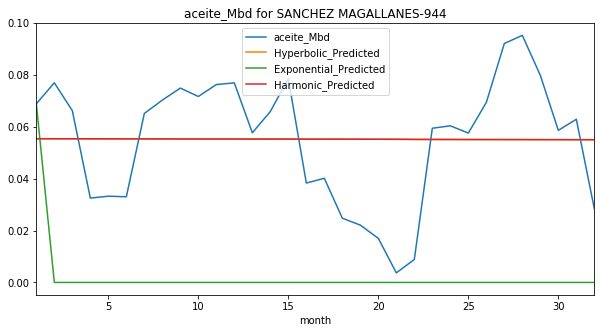

Exponential Fit Curve-fitted Variables: qi=0.12143399518445074, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13546242390416902, b=0.24756485952828622, di=0.0015295754462044404
Harmonic Fit Curve-fitted Variables: qi=0.13549399999999998, di=0.002494141890938565


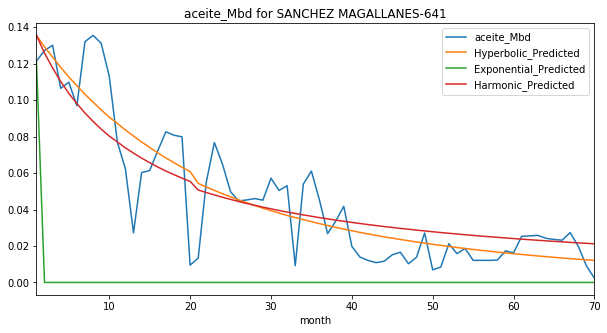

Exponential Fit Curve-fitted Variables: qi=0.038221000028901435, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05857898403930718, b=5.7875463246980856e-06, di=9.880354552964194e-05
Harmonic Fit Curve-fitted Variables: qi=0.05719901557711005, di=8.42865340778578e-05


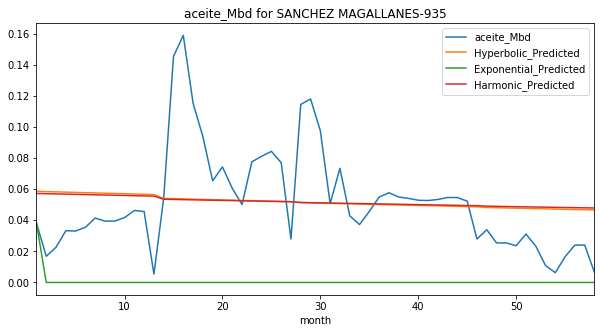

Exponential Fit Curve-fitted Variables: qi=0.006513006955645053, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06932695970744913, b=3.087526178205226e-07, di=0.00031915825052356776
Harmonic Fit Curve-fitted Variables: qi=0.06705408527360318, di=0.00033520554062796003


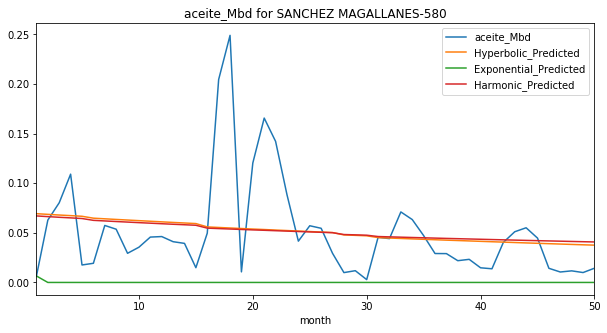

Exponential Fit Curve-fitted Variables: qi=0.01633301271262426, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03834664833210777, b=4.3878452700699895e-09, di=0.0008117411145103845
Harmonic Fit Curve-fitted Variables: qi=0.03764966142344654, di=0.0008610844781282141


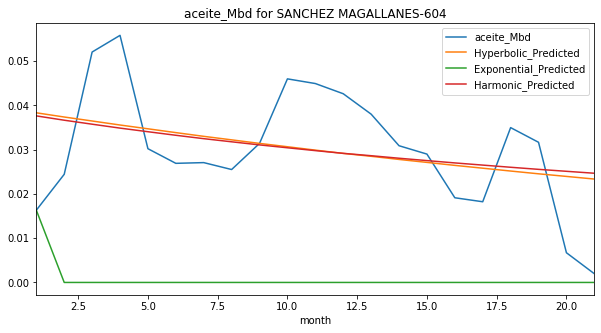

Exponential Fit Curve-fitted Variables: qi=0.03966696993524826, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04136099999999068, b=1.9999999999999996, di=1.7556167643326234e-14
Harmonic Fit Curve-fitted Variables: qi=0.041360999999998295, di=5.80924301748201e-16


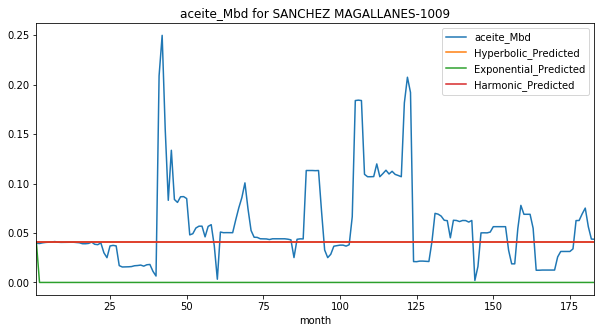

Exponential Fit Curve-fitted Variables: qi=0.0146485546875, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0146485546875, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.0146485546875, di=5.0


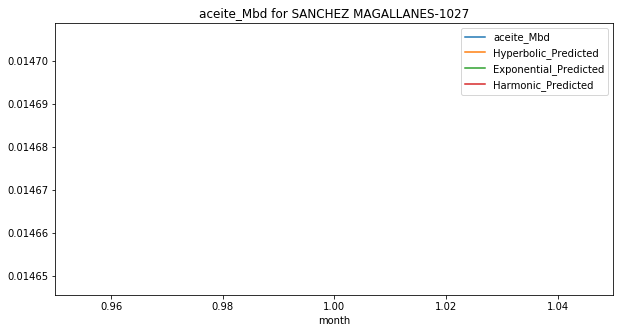

Exponential Fit Curve-fitted Variables: qi=0.1422769953232207, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10159776607273213, b=1.9999999999999998, di=0.00024179524428993306
Harmonic Fit Curve-fitted Variables: qi=0.09416080184273071, di=0.00013873022895471475


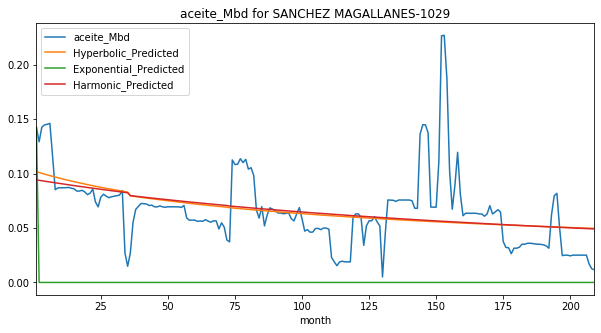

Exponential Fit Curve-fitted Variables: qi=0.42900945905909754, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.42937799999999987, b=0.19807864997430377, di=0.000345271631077708
Harmonic Fit Curve-fitted Variables: qi=0.4293779999999988, di=0.0005486496255483373


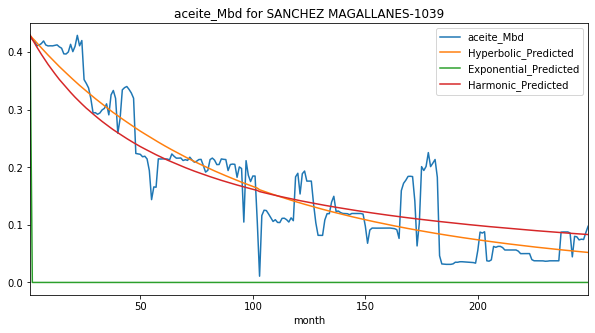

Exponential Fit Curve-fitted Variables: qi=0.028907339586231137, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025771383512821162, b=3.890201845528198e-09, di=9.175795053204792e-05
Harmonic Fit Curve-fitted Variables: qi=0.025811477846682637, di=0.00010138365117178751


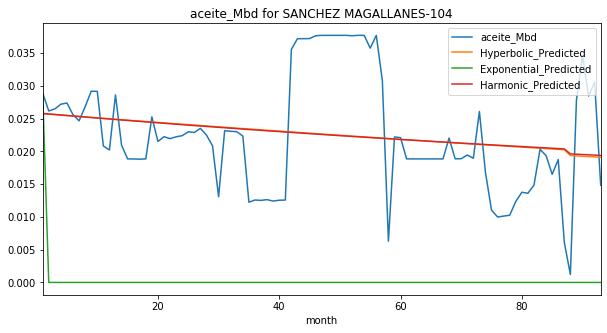

Exponential Fit Curve-fitted Variables: qi=0.28434599978753794, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3264749999835879, b=5.992911702039058e-09, di=0.000190068674913587
Harmonic Fit Curve-fitted Variables: qi=0.3264749999999999, di=0.00026769277162715235


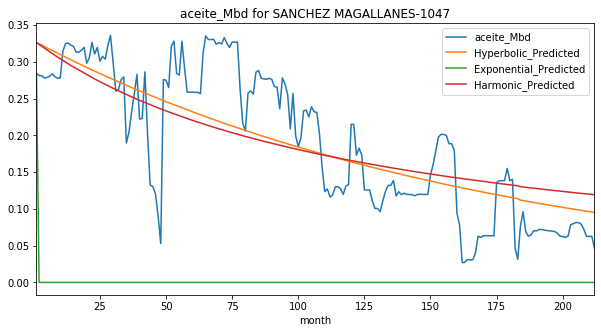

Exponential Fit Curve-fitted Variables: qi=0.18133688826286723, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19619218105361985, b=1.9416720313443254e-07, di=0.00016494464235108106
Harmonic Fit Curve-fitted Variables: qi=0.19817999999999994, di=0.00023184919321647037


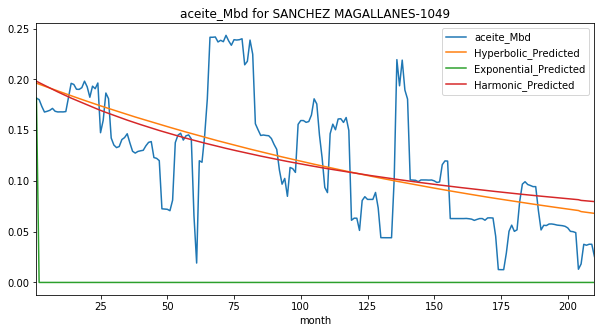

Exponential Fit Curve-fitted Variables: qi=0.08669004479619123, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.086811999999997, b=0.945226009360745, di=0.0011867983235584712
Harmonic Fit Curve-fitted Variables: qi=0.08681199999999999, di=0.0012233119427732904


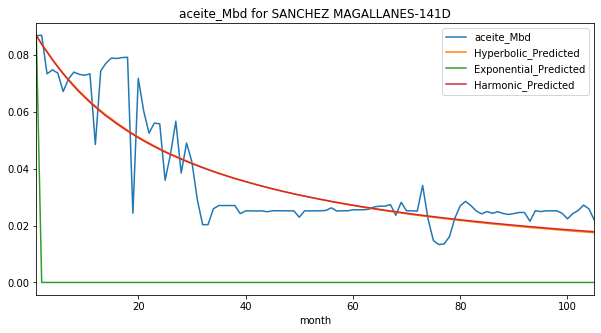

Exponential Fit Curve-fitted Variables: qi=0.015915241735328864, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020426634357557562, b=1.9999999999999998, di=2.5925507207382095e-16
Harmonic Fit Curve-fitted Variables: qi=0.020426614593739203, di=6.599192519678864e-13


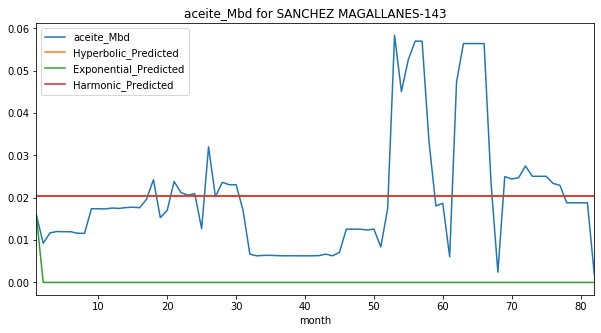

Exponential Fit Curve-fitted Variables: qi=0.035285406234440084, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03962599992539745, b=1.8125193760908434e-06, di=0.0004273736623888868
Harmonic Fit Curve-fitted Variables: qi=0.039625999999999995, di=0.00046624265684837095


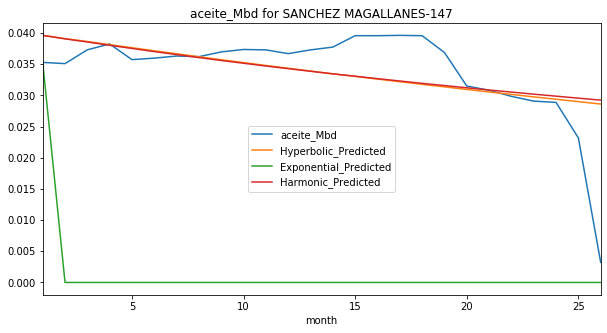

Exponential Fit Curve-fitted Variables: qi=0.0405059992333671, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04442099022068638, b=2.3128534975885504e-11, di=0.0004571580319201363
Harmonic Fit Curve-fitted Variables: qi=0.04381669629213317, di=0.000549412473761756


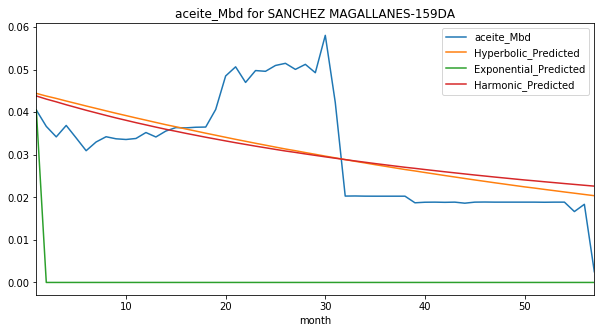

Exponential Fit Curve-fitted Variables: qi=0.017335999069433995, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019492716242707642, b=1.9999999470800869, di=4.147974114635394e-13
Harmonic Fit Curve-fitted Variables: qi=0.019492707712560065, di=5.702818702219215e-12


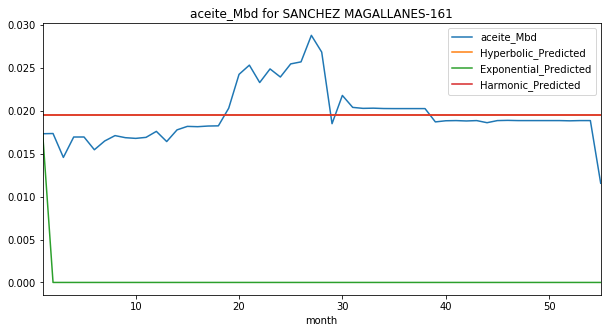

Exponential Fit Curve-fitted Variables: qi=0.03638773328508352, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04007715146141021, b=1.9999999999999998, di=2.548265195866062e-16
Harmonic Fit Curve-fitted Variables: qi=0.040077150206835235, di=4.3302557658221364e-14


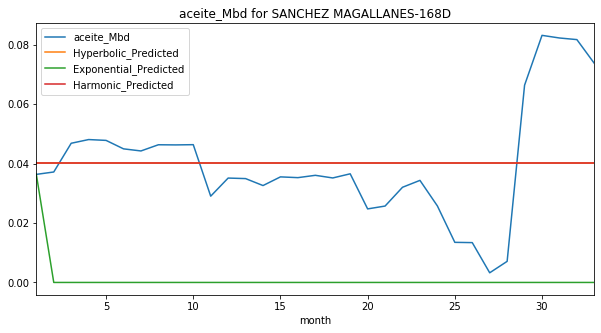

Exponential Fit Curve-fitted Variables: qi=0.05200398709010337, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.035884305268990814, b=1.9999978646802814, di=2.572135980855421e-22
Harmonic Fit Curve-fitted Variables: qi=0.03588430587570536, di=2.167826263660695e-18


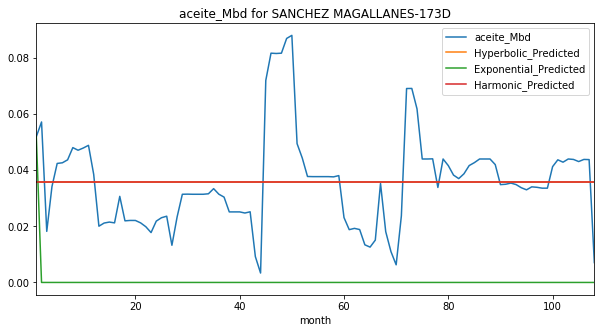

Exponential Fit Curve-fitted Variables: qi=0.01825411111634685, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03614729746243968, b=0.0019315255960642703, di=2.3899277224337535e-06
Harmonic Fit Curve-fitted Variables: qi=0.0361027101320485, di=1.9722891207601745e-06


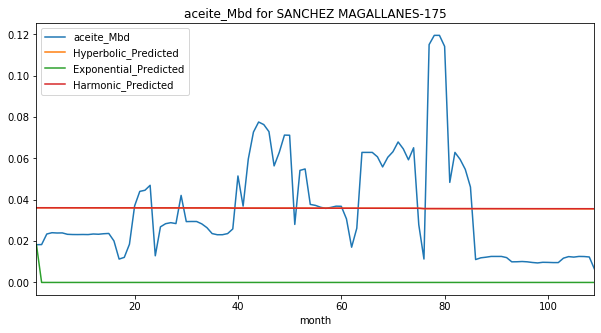

Exponential Fit Curve-fitted Variables: qi=0.00896387363288102, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.009064040057242859, b=0.43021397945451056, di=2.170677858052774e-05
Harmonic Fit Curve-fitted Variables: qi=0.009077290057717152, di=0.00013872688681204737


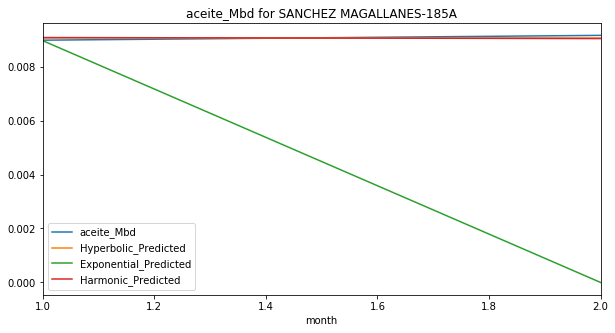

Exponential Fit Curve-fitted Variables: qi=0.02302470703125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.022426718920383396, b=3.845139073810344e-08, di=9.589458988096723e-16
Harmonic Fit Curve-fitted Variables: qi=0.022426542952828275, di=2.9721414288725975e-11


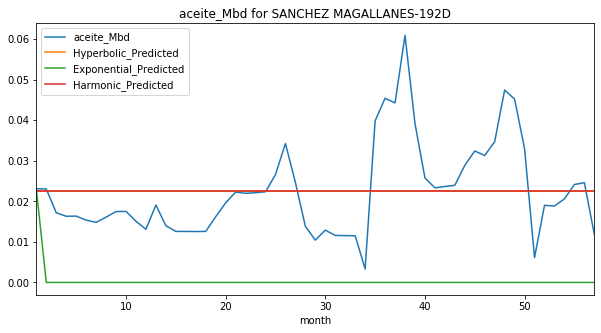

Exponential Fit Curve-fitted Variables: qi=0.017343000031930466, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02728611305589937, b=5.874678378937965e-10, di=0.0002929612998683925
Harmonic Fit Curve-fitted Variables: qi=0.026342677193413044, di=0.00028576203636101376


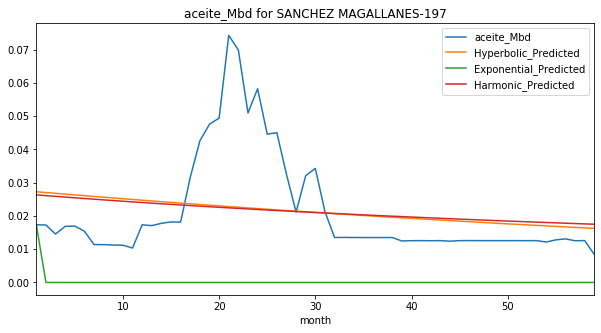

Exponential Fit Curve-fitted Variables: qi=0.0756139941019365, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06998527282319354, b=6.569816874968382e-07, di=7.895707403984952e-18
Harmonic Fit Curve-fitted Variables: qi=0.06998527257764202, di=1.1957328765632254e-18


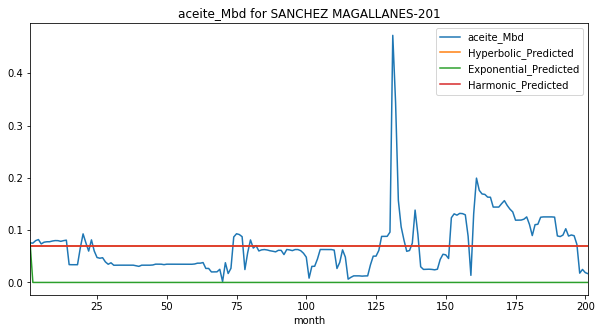

Exponential Fit Curve-fitted Variables: qi=0.02987800012048666, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.051865658149855554, b=1.6776069454059221e-13, di=7.245587847381889e-05
Harmonic Fit Curve-fitted Variables: qi=0.05163266961851277, di=7.140012240284303e-05


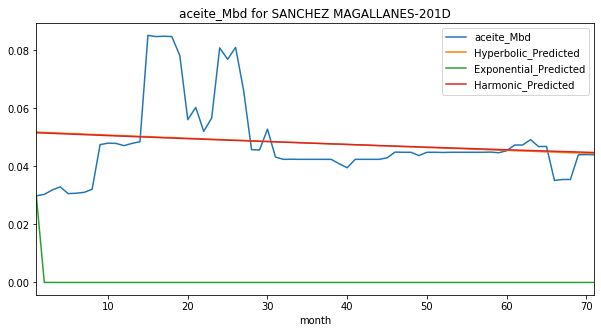

Exponential Fit Curve-fitted Variables: qi=0.04562199989113014, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.053098986421075564, b=2.0002793792856642e-13, di=0.0001387295760039842
Harmonic Fit Curve-fitted Variables: qi=0.05304507068011942, di=0.00015537826208629872


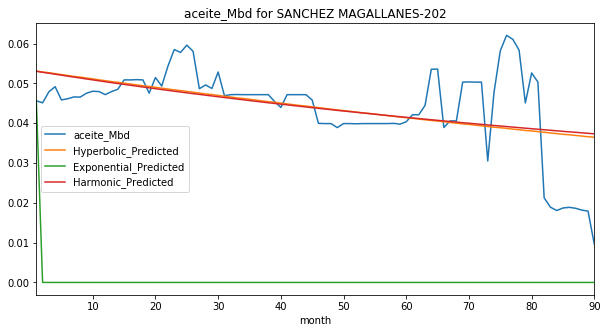

Exponential Fit Curve-fitted Variables: qi=0.0133987701134413, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.01852192209256508, b=1.4361994852413185e-07, di=1.1548069488566543e-11
Harmonic Fit Curve-fitted Variables: qi=0.0185219250174882, di=4.86517672760833e-09


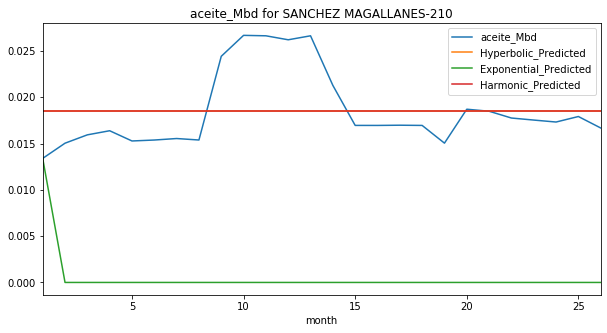

Exponential Fit Curve-fitted Variables: qi=0.055360888197128054, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05963600913831959, b=3.703991005579165e-13, di=0.000123227814016247
Harmonic Fit Curve-fitted Variables: qi=0.05910523671171556, di=0.0001304377430499809


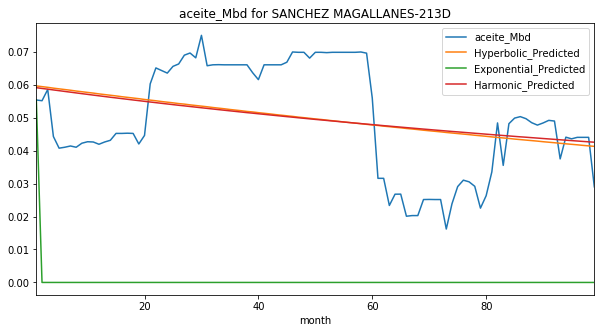

Exponential Fit Curve-fitted Variables: qi=0.04046582043340349, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03543967527703773, b=3.922980308835974e-09, di=7.203223686941043e-05
Harmonic Fit Curve-fitted Variables: qi=0.03509217172319572, di=6.948356270544997e-05


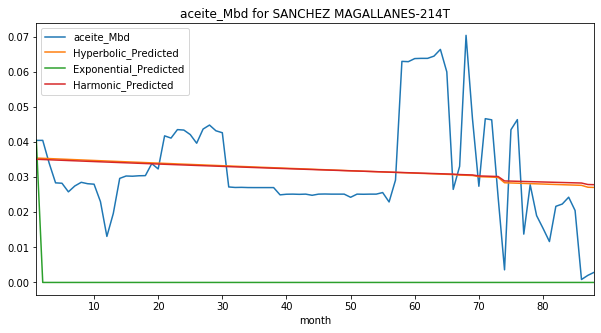

Exponential Fit Curve-fitted Variables: qi=0.014937029794700261, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02471080491843819, b=4.767278803321614e-08, di=1.1206185670819698e-05
Harmonic Fit Curve-fitted Variables: qi=0.024661938572271724, di=9.709806340795352e-06


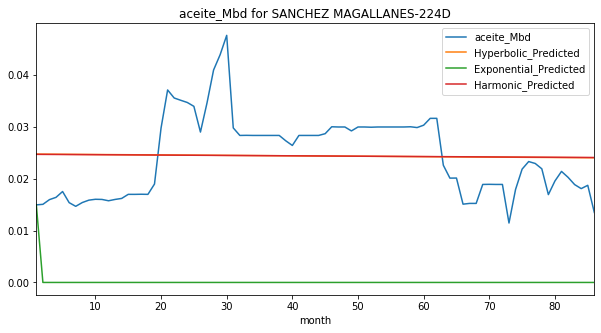

Exponential Fit Curve-fitted Variables: qi=0.029853999827495845, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03500525949150254, b=1.8848585309419184e-14, di=5.855625200266521e-05
Harmonic Fit Curve-fitted Variables: qi=0.03488525500626005, di=5.834376370183156e-05


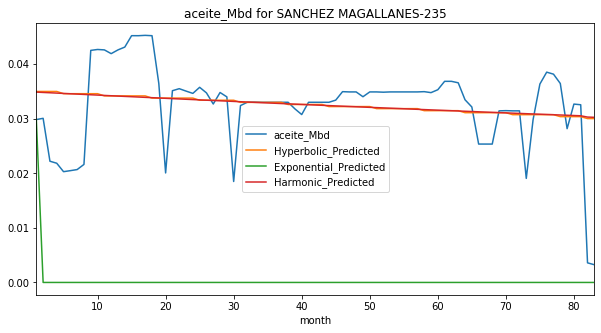

Exponential Fit Curve-fitted Variables: qi=0.04040599966536458, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.044609058474281496, b=1.9999999999999998, di=5.8733358715800175e-15
Harmonic Fit Curve-fitted Variables: qi=0.044609057911872814, di=2.7782557014582034e-14


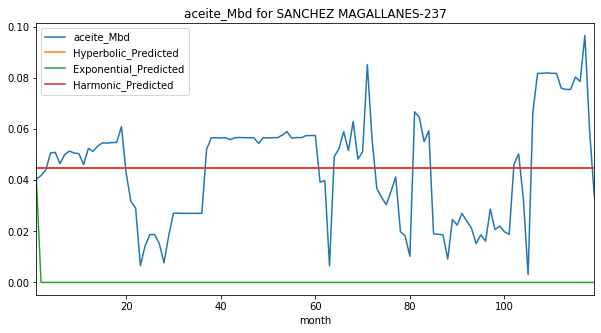

Exponential Fit Curve-fitted Variables: qi=0.04629499504798097, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03813884001595464, b=5.3980431041238315e-12, di=2.1707304728799683e-18
Harmonic Fit Curve-fitted Variables: qi=0.038138839668926096, di=2.2806943599544847e-15


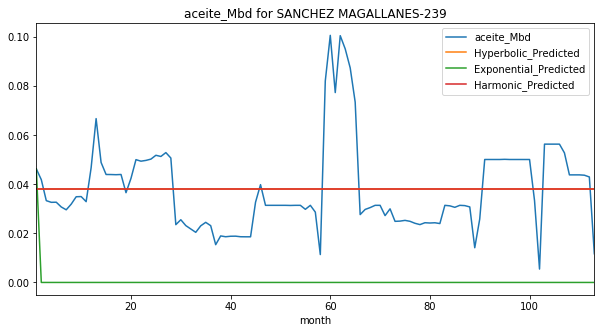

Exponential Fit Curve-fitted Variables: qi=0.014833995138312836, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.015946432397413432, b=1.9999999999999998, di=1.2590593800809195e-15
Harmonic Fit Curve-fitted Variables: qi=0.015946414406422152, di=1.2951521006553684e-11


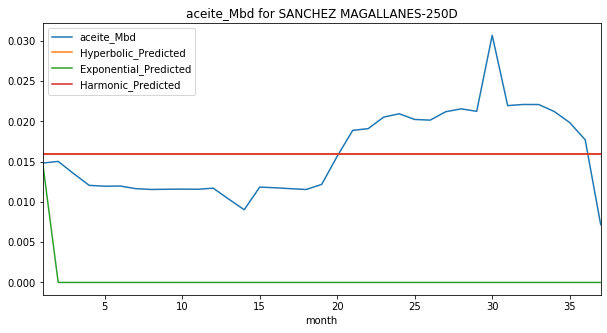

Exponential Fit Curve-fitted Variables: qi=0.11497197610676715, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11965524142869391, b=1.8186962039086272, di=0.0005445274852380192
Harmonic Fit Curve-fitted Variables: qi=0.1124533236958513, di=0.0003347816317533201


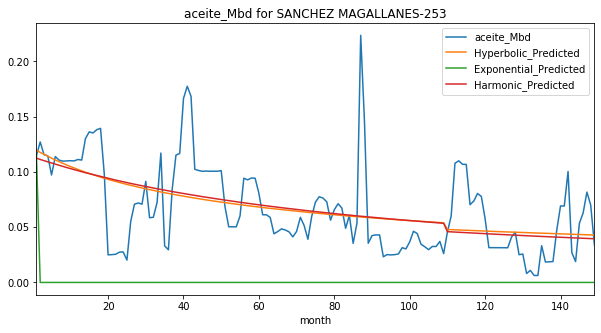

Exponential Fit Curve-fitted Variables: qi=0.0773209969643915, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09582999999999924, b=1.9999999999999998, di=0.0007198416151590262
Harmonic Fit Curve-fitted Variables: qi=0.09017395811717582, di=0.0004125843244844901


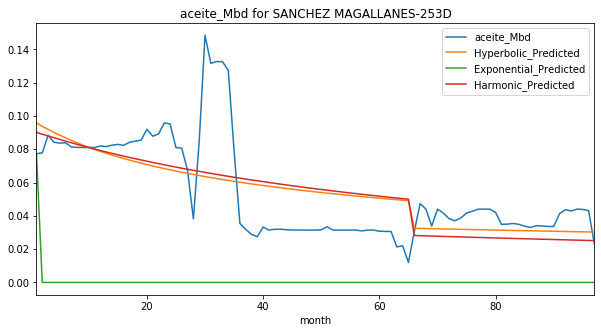

Exponential Fit Curve-fitted Variables: qi=0.0015612656831430008, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04410589712003466, b=1.999999999999763, di=1.2222106562494867e-19
Harmonic Fit Curve-fitted Variables: qi=0.044105896467768455, di=5.266346738755647e-14


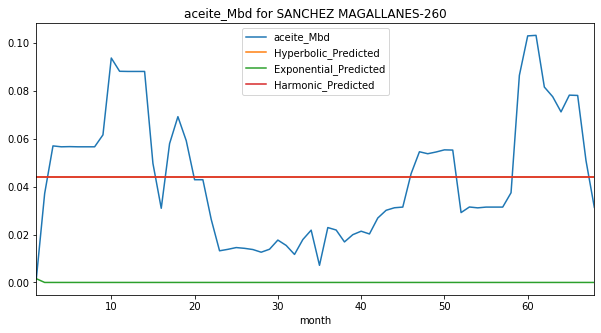

Exponential Fit Curve-fitted Variables: qi=0.014925630517462901, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.018527999905524915, b=1.9999999999978144, di=7.291033088198043e-11
Harmonic Fit Curve-fitted Variables: qi=0.018527999989232317, di=1.1288040137375907e-12


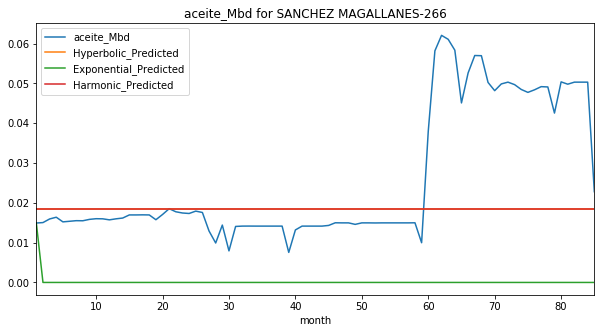

Exponential Fit Curve-fitted Variables: qi=0.04624098162500758, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.043582760194573376, b=1.999999999995605, di=0.00023703881684203674
Harmonic Fit Curve-fitted Variables: qi=0.04289176810813717, di=0.00018546999325585664


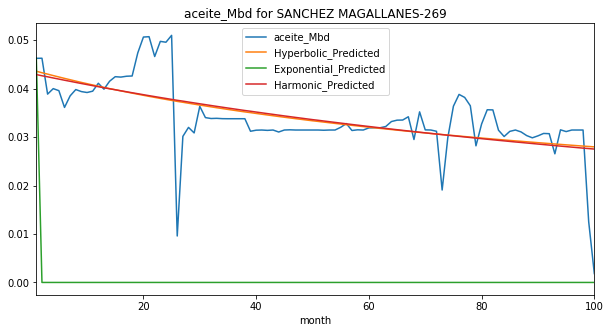

Exponential Fit Curve-fitted Variables: qi=0.03456592777147729, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03742133448261783, b=8.490289233884457e-07, di=0.000425049732064128
Harmonic Fit Curve-fitted Variables: qi=0.03803238818916199, di=0.0005674485236651623


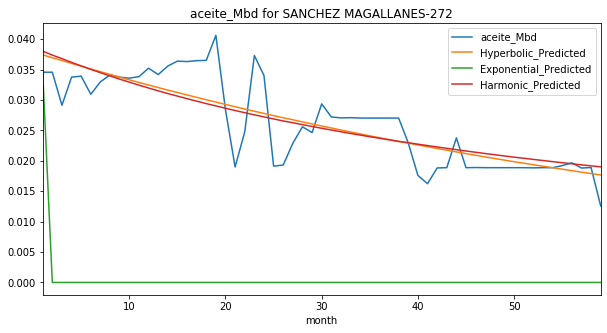

Exponential Fit Curve-fitted Variables: qi=0.017283095855426023, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03812387154270132, b=5.768653976723215e-08, di=7.74158643768586e-17
Harmonic Fit Curve-fitted Variables: qi=0.03812387154562549, di=2.41161662973062e-17


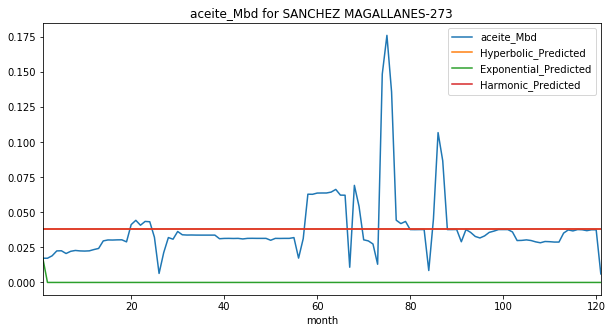

Exponential Fit Curve-fitted Variables: qi=0.046087988341595845, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04492986914459038, b=1.1409325728547201e-07, di=9.339332360522003e-05
Harmonic Fit Curve-fitted Variables: qi=0.04505930084641083, di=0.0001052956696369468


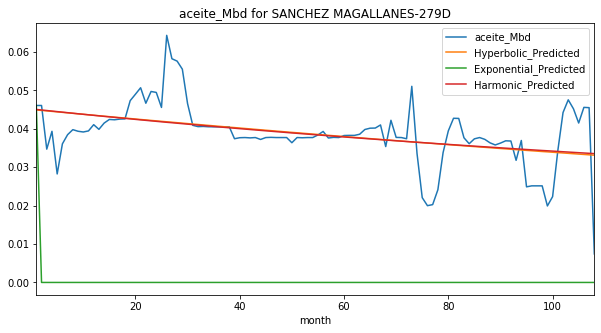

Exponential Fit Curve-fitted Variables: qi=0.035915987572382006, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04167382412047358, b=9.35432246313983e-05, di=1.490577384619368e-14
Harmonic Fit Curve-fitted Variables: qi=0.041673825509948734, di=1.0248968549013178e-16


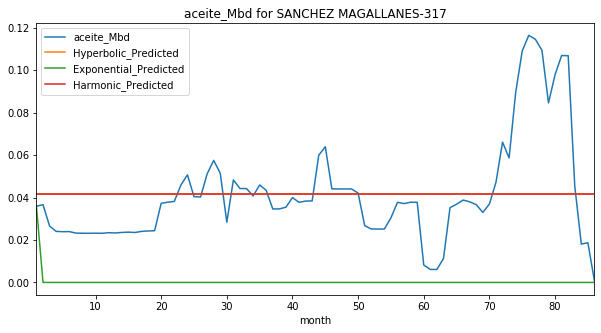

Exponential Fit Curve-fitted Variables: qi=0.08967499970862478, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09756558942251196, b=1.9999999999999998, di=0.0011447945611510215
Harmonic Fit Curve-fitted Variables: qi=0.06540007573299057, di=0.00020645922298451042


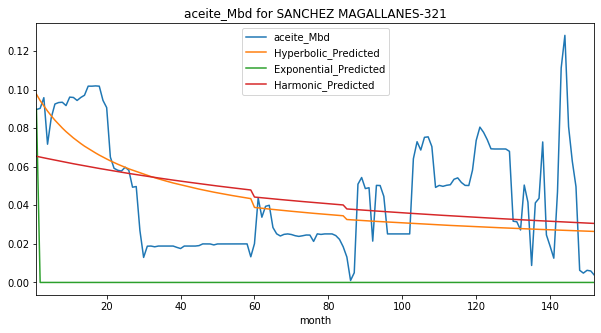

Exponential Fit Curve-fitted Variables: qi=0.022954483449293205, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023044999996511818, b=1.9999999999886389, di=2.7302452294286815e-11
Harmonic Fit Curve-fitted Variables: qi=0.02304499999973723, di=5.105104903266404e-13


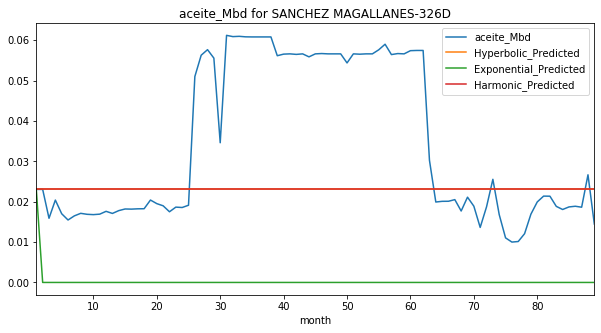

Exponential Fit Curve-fitted Variables: qi=0.17917798513944805, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21995599999999998, b=0.09653670154475565, di=0.0007492247405001779
Harmonic Fit Curve-fitted Variables: qi=0.21995599999999998, di=0.0011957223221222629


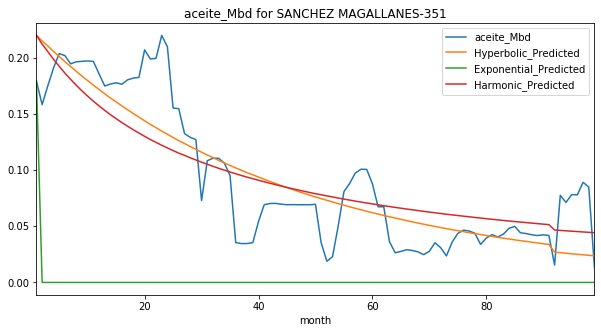

Exponential Fit Curve-fitted Variables: qi=0.08564577106006237, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07246781658229332, b=1.9995628816845918, di=5.868903446562754e-17
Harmonic Fit Curve-fitted Variables: qi=0.07246781632558617, di=7.4873361326939535e-19


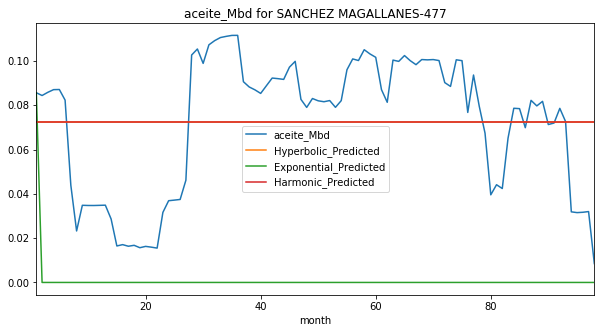

Exponential Fit Curve-fitted Variables: qi=0.029026998952924096, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.035334393188313155, b=4.824672393099593e-14, di=0.0006633050776475874
Harmonic Fit Curve-fitted Variables: qi=0.03601398896314145, di=0.001055593045122476


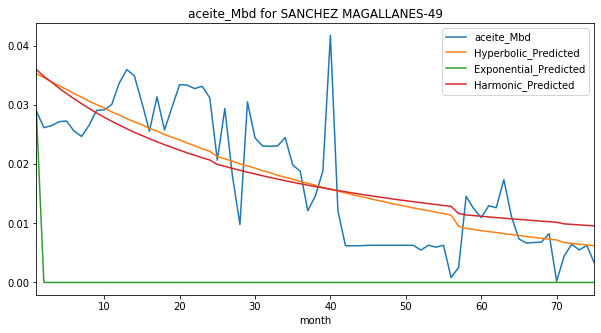

Exponential Fit Curve-fitted Variables: qi=0.03482284227765937, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03929299999638506, b=1.9999999999988896, di=8.21229393138181e-12
Harmonic Fit Curve-fitted Variables: qi=0.039292999999449, di=2.4327263124858246e-13


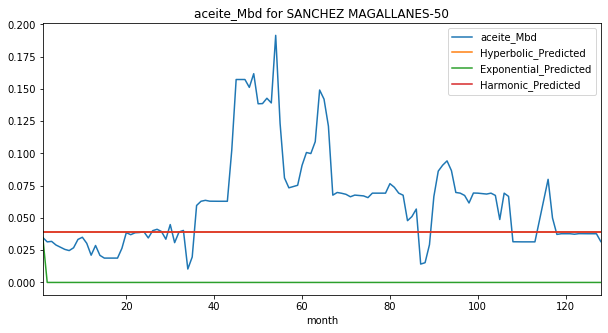

Exponential Fit Curve-fitted Variables: qi=0.08102199897819956, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07950301712992633, b=1.99999999999605, di=0.00223436779091382
Harmonic Fit Curve-fitted Variables: qi=0.06819667097061727, di=0.00083701542070322


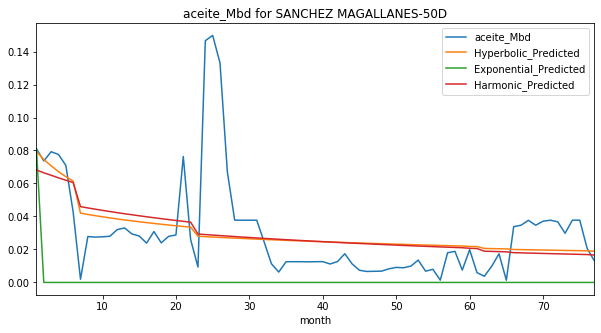

Exponential Fit Curve-fitted Variables: qi=0.028837999955596397, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.021760782261023258, b=1.9999999999999998, di=1.3829452575162525e-13
Harmonic Fit Curve-fitted Variables: qi=0.02176078256653601, di=4.57890928324459e-15


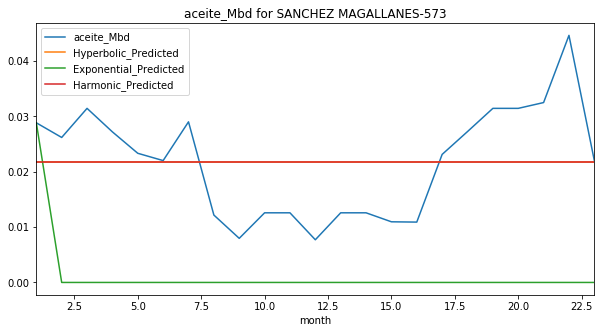

Exponential Fit Curve-fitted Variables: qi=0.040632484375, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04071199999999604, b=1.9999999999999998, di=2.360024277717457e-15
Harmonic Fit Curve-fitted Variables: qi=0.04071199960715713, di=5.3384765314487973e-11


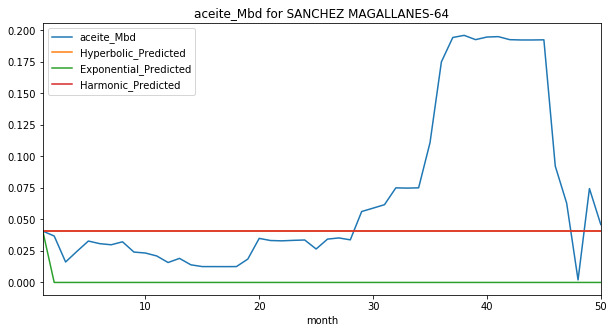

Exponential Fit Curve-fitted Variables: qi=0.017201000020761366, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04708337837631134, b=1.9999999999983074, di=0.0015665950009760815
Harmonic Fit Curve-fitted Variables: qi=0.04481355823121146, di=0.0010349024974535155


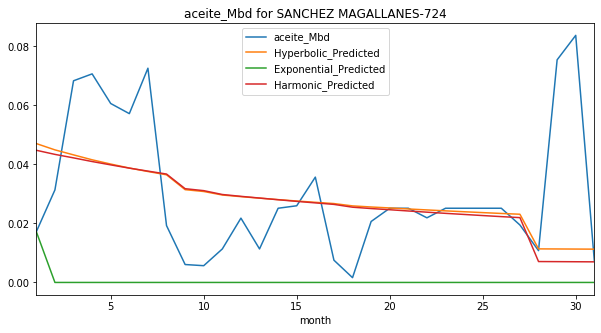

Exponential Fit Curve-fitted Variables: qi=0.20281592041015625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1993131395967819, b=1.0138187791754587, di=0.000848440678298908
Harmonic Fit Curve-fitted Variables: qi=0.19919408474880998, di=0.0008433367815609277


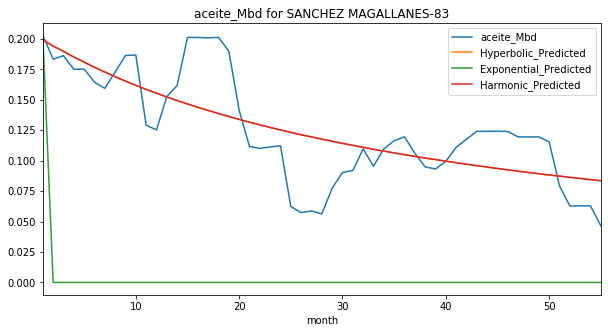

Exponential Fit Curve-fitted Variables: qi=0.02999554633368871, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.030562313921598, b=1.4696166794614385e-07, di=4.751109934271806e-14
Harmonic Fit Curve-fitted Variables: qi=0.030562314240263476, di=3.8543990739926544e-16


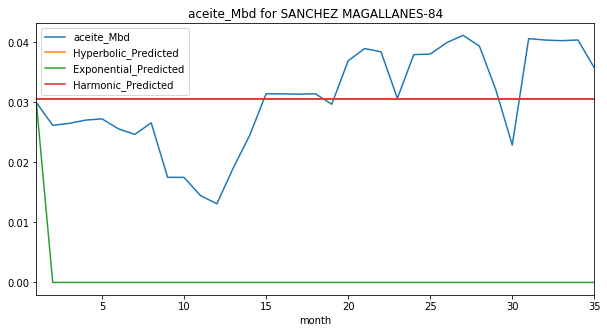

Exponential Fit Curve-fitted Variables: qi=0.028422328237041813, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.029206999999862763, b=7.213057443514897e-07, di=0.0011480207222879393
Harmonic Fit Curve-fitted Variables: qi=0.029206884554301402, di=0.0012041590365693621


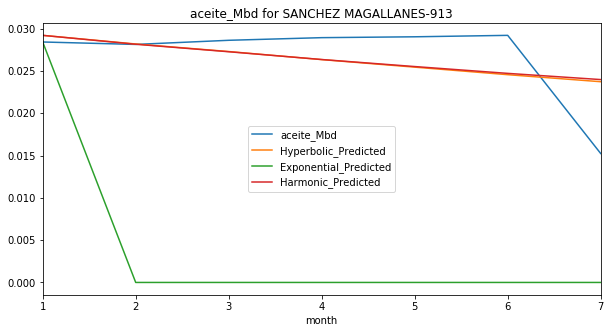

Exponential Fit Curve-fitted Variables: qi=0.03423487305289803, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03990999999999898, b=2.675998984180694e-06, di=2.3865777975688512e-15
Harmonic Fit Curve-fitted Variables: qi=0.03990999999999989, di=4.6810899953968685e-17


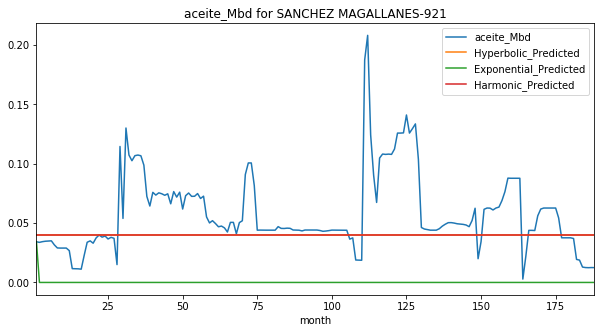

Exponential Fit Curve-fitted Variables: qi=0.0957099999876555, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12165912781100204, b=4.420141021293006e-08, di=0.0005642403019181875
Harmonic Fit Curve-fitted Variables: qi=0.12283347875140614, di=0.0008151680727482706


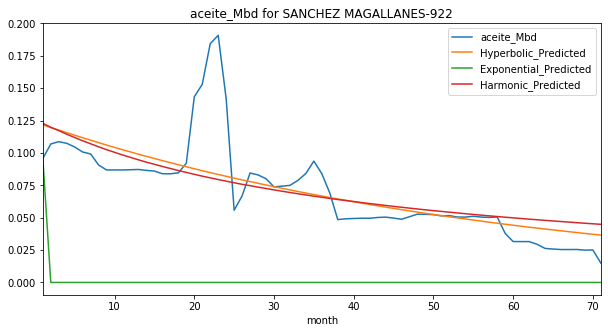

Exponential Fit Curve-fitted Variables: qi=0.199058755859375, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12302048468039357, b=1.9999999999999973, di=7.656449332818267e-05
Harmonic Fit Curve-fitted Variables: qi=0.12008245071608509, di=5.740660124418303e-05


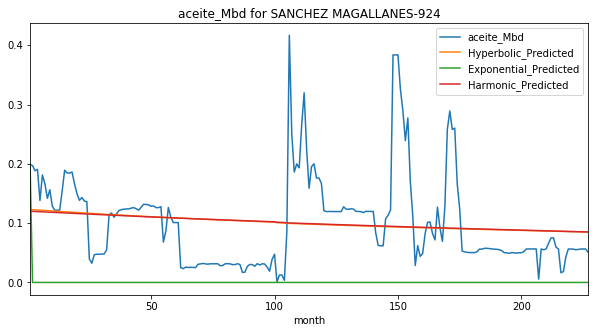

Exponential Fit Curve-fitted Variables: qi=0.022756001345042087, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2754294291257683, b=6.079637995305285e-08, di=0.0001835893529658897
Harmonic Fit Curve-fitted Variables: qi=0.26755897825658304, di=0.00025713057814241626


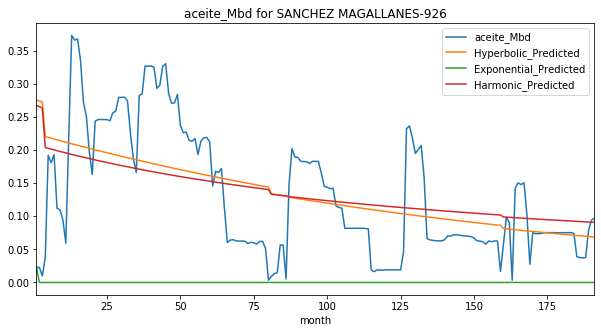

Exponential Fit Curve-fitted Variables: qi=0.010365217098754875, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2047904030451587, b=1.6906103832670074, di=0.0008147121091766618
Harmonic Fit Curve-fitted Variables: qi=0.19437820150610433, di=0.0005091091885579426


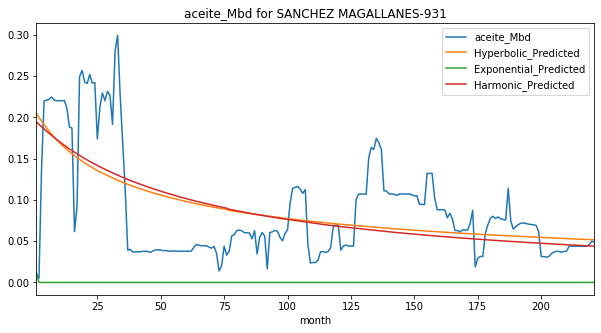

Exponential Fit Curve-fitted Variables: qi=0.10254999877849277, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10872599993535402, b=2.774634310067308e-09, di=0.00016427937646826631
Harmonic Fit Curve-fitted Variables: qi=0.10872599999999996, di=0.00018604231738077813


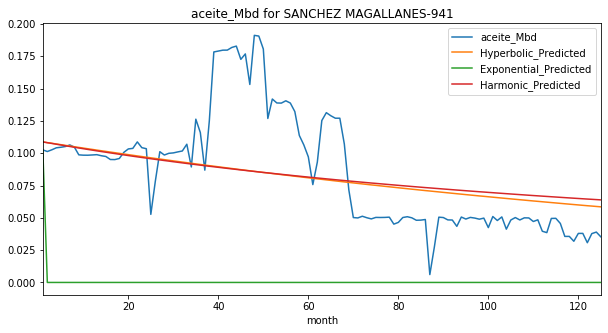

Exponential Fit Curve-fitted Variables: qi=0.11350255175781251, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04155189291733039, b=1.9999999999366207, di=2.0287406044720696e-17
Harmonic Fit Curve-fitted Variables: qi=0.04155189282995539, di=1.4911114673579648e-16


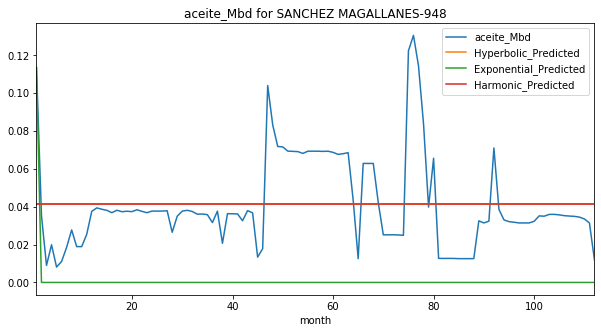

Exponential Fit Curve-fitted Variables: qi=0.023145971359028805, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025158999982744592, b=1.9999999999991585, di=1.3462796043221385e-11
Harmonic Fit Curve-fitted Variables: qi=0.025158999999361654, di=8.089942933734038e-14


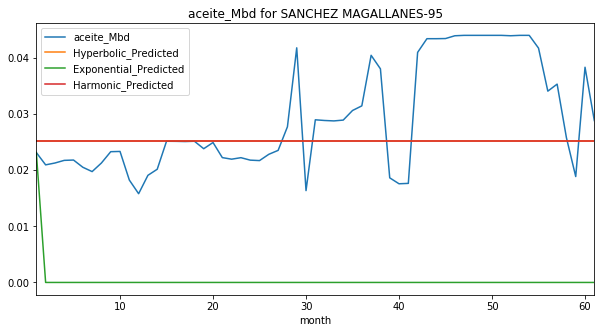

Exponential Fit Curve-fitted Variables: qi=0.034001000275398756, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09885299998402822, b=1.2745418411108802e-11, di=7.648691645268522e-05
Harmonic Fit Curve-fitted Variables: qi=0.09885299999999807, di=7.819784583588013e-05


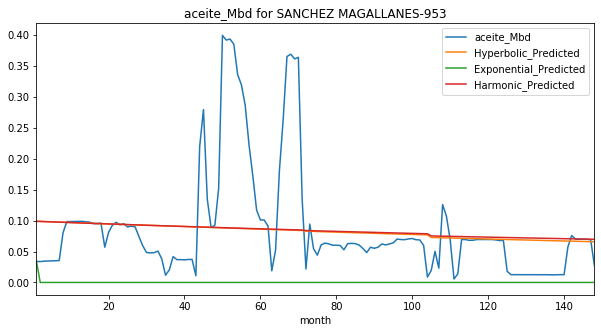

Exponential Fit Curve-fitted Variables: qi=0.03966685913196347, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0650089999995579, b=1.9999999999999998, di=4.8353368710938755e-15
Harmonic Fit Curve-fitted Variables: qi=0.06500899014735294, di=2.3374132731961758e-11


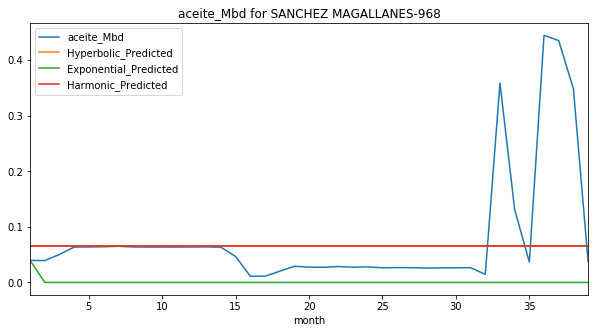

Exponential Fit Curve-fitted Variables: qi=0.03400102945081534, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08239299999999997, b=4.58311824846902e-06, di=6.711307559610103e-17
Harmonic Fit Curve-fitted Variables: qi=0.08239299999742399, di=6.246830167402121e-13


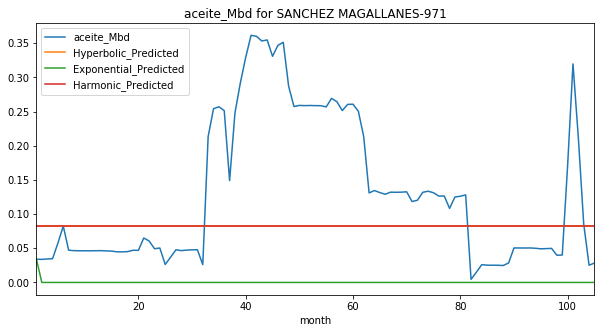

Exponential Fit Curve-fitted Variables: qi=0.04026699987206974, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.043303694764648105, b=7.721424994944215e-07, di=8.44989708076658e-14
Harmonic Fit Curve-fitted Variables: qi=0.043303695937929806, di=1.8668460324612208e-14


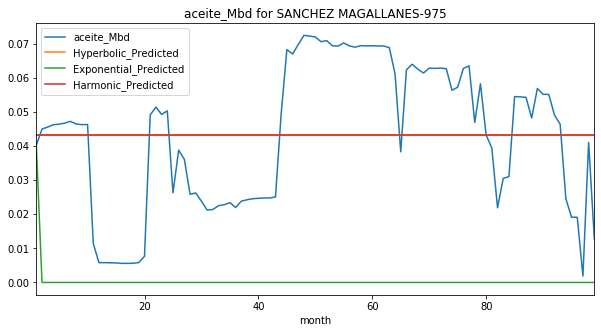

Exponential Fit Curve-fitted Variables: qi=0.021434986628478713, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.029304861359614326, b=4.3784404895083346e-08, di=0.00027964119833393675
Harmonic Fit Curve-fitted Variables: qi=0.029379515945277154, di=0.0003072004076407178


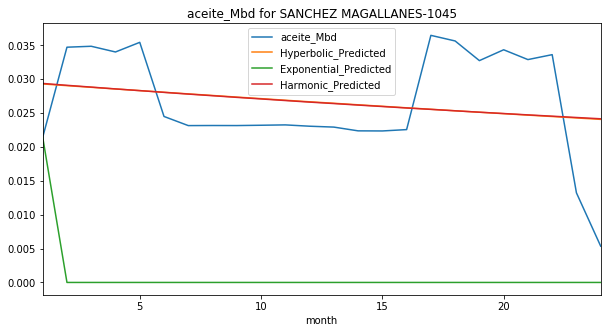

Exponential Fit Curve-fitted Variables: qi=0.08859008079367843, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10643070605200967, b=3.8423984608208547e-16, di=8.574384115098263e-05
Harmonic Fit Curve-fitted Variables: qi=0.1008247837982056, di=8.317201458687565e-05


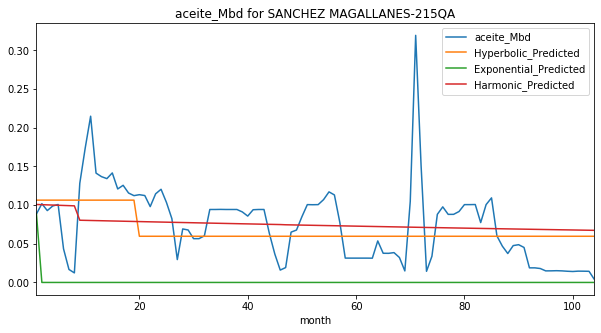

Exponential Fit Curve-fitted Variables: qi=0.008371001095017695, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06412452946255574, b=9.015037475701609e-10, di=0.0009304493346866212
Harmonic Fit Curve-fitted Variables: qi=0.06179983488201898, di=0.0009408864784906693


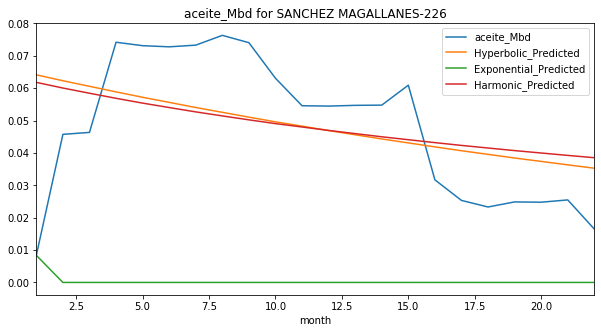

Exponential Fit Curve-fitted Variables: qi=0.012112536081208698, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.013747145140853026, b=1.973423624152365, di=6.014816144099545e-07
Harmonic Fit Curve-fitted Variables: qi=0.013746324971046536, di=2.447298317782341e-06


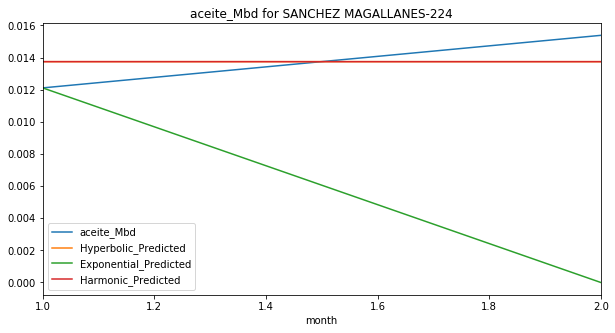

Exponential Fit Curve-fitted Variables: qi=0.02406800015617234, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.030885475362236316, b=1.9999999999999998, di=7.451418626257861e-08
Harmonic Fit Curve-fitted Variables: qi=0.030884802540787376, di=6.561697442898241e-08


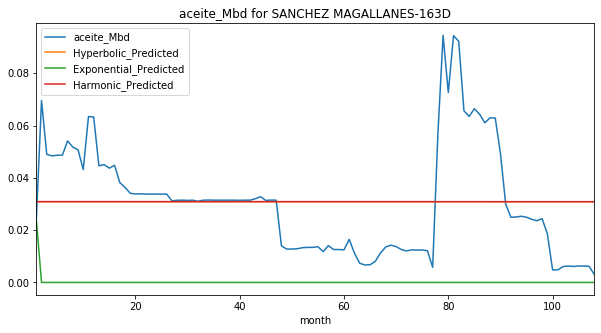

Exponential Fit Curve-fitted Variables: qi=0.012369000056805813, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03363980085647304, b=1.9997334733918264, di=1.6159894057486978e-13
Harmonic Fit Curve-fitted Variables: qi=0.03363979590924601, di=1.277885799934474e-10


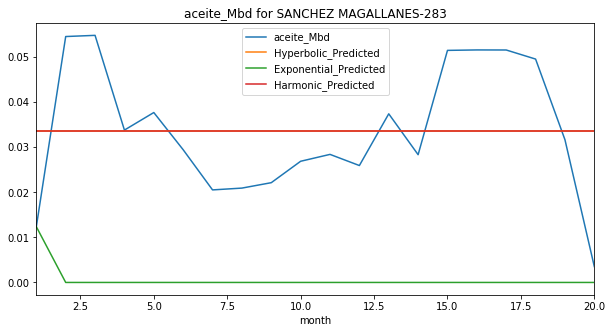

Exponential Fit Curve-fitted Variables: qi=0.022457996230663135, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025944613060079825, b=7.152663355888512e-08, di=0.0013181708885206397
Harmonic Fit Curve-fitted Variables: qi=0.02578270854917668, di=0.0012256205169810794


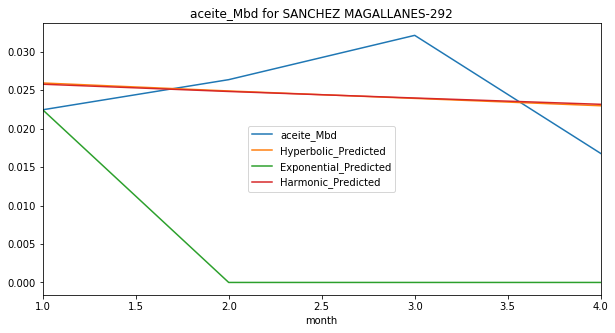

Exponential Fit Curve-fitted Variables: qi=0.027357999921796404, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03939380313987782, b=3.391414209463761e-07, di=2.908274508001462e-15
Harmonic Fit Curve-fitted Variables: qi=0.03939380351898463, di=6.48267402662947e-17


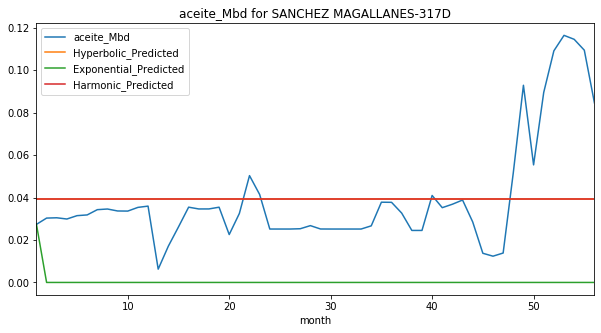

Exponential Fit Curve-fitted Variables: qi=0.02096632236971502, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.060953709085167944, b=1.9999999999999996, di=0.00016021993217919716
Harmonic Fit Curve-fitted Variables: qi=0.057843903823225476, di=0.00010285900665079337


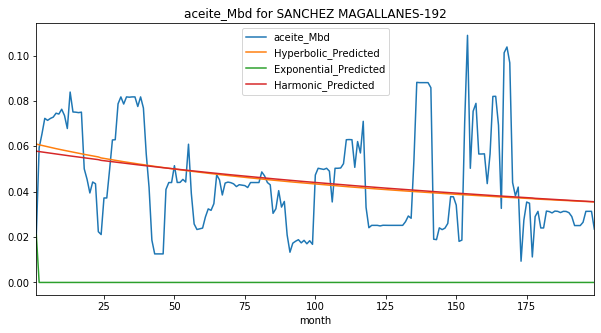

Exponential Fit Curve-fitted Variables: qi=0.008986314276376002, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.22804293048936222, b=0.753576157658307, di=0.0004708681551229927
Harmonic Fit Curve-fitted Variables: qi=0.2347262569483733, di=0.000568776448922613


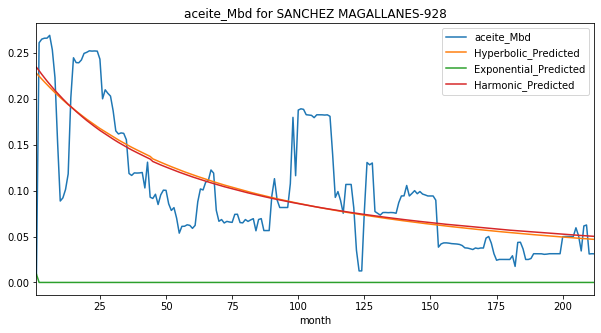

Exponential Fit Curve-fitted Variables: qi=0.020929735896709118, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03319599987639097, b=1.4127482333864969e-06, di=0.0003871769909478944
Harmonic Fit Curve-fitted Variables: qi=0.03319599999999995, di=0.0004705236355621325


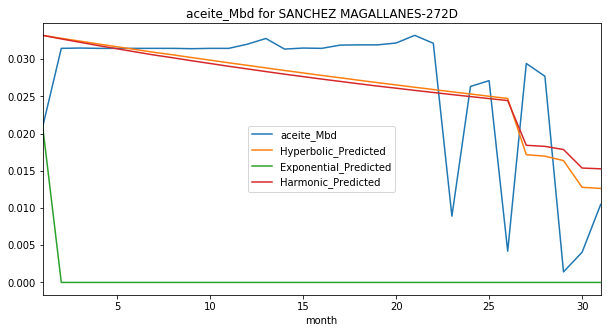

Exponential Fit Curve-fitted Variables: qi=0.03669099929541716, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.045883999999999994, b=0.4139990445836084, di=0.0008632216016102291
Harmonic Fit Curve-fitted Variables: qi=0.045883999999999994, di=0.0010803523343669722


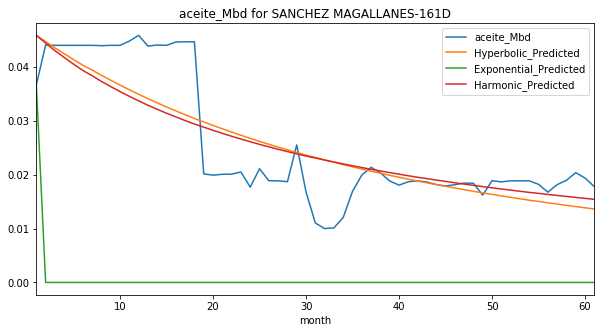

Exponential Fit Curve-fitted Variables: qi=0.21998799981337858, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3104726181506102, b=1.9999999999999998, di=0.001990762288148334
Harmonic Fit Curve-fitted Variables: qi=0.24304362106367958, di=0.0006118347335932141


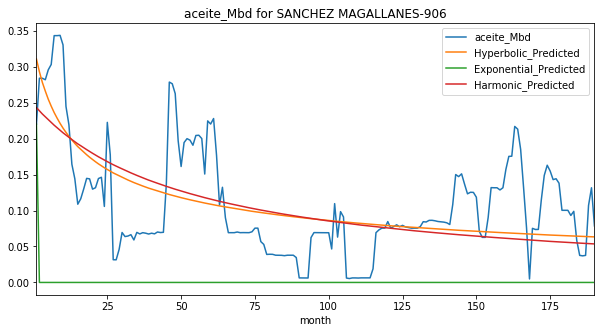

Exponential Fit Curve-fitted Variables: qi=0.14987899940460622, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18552694596013397, b=5.605528385729629e-07, di=0.013762911646832925
Harmonic Fit Curve-fitted Variables: qi=0.17588703443792064, di=0.01490400114370829


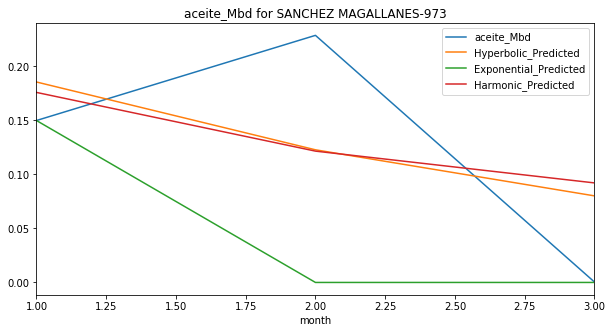

Exponential Fit Curve-fitted Variables: qi=0.01587200014131111, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02113274960236266, b=1.999999996090356, di=3.62367760544632e-13
Harmonic Fit Curve-fitted Variables: qi=0.02113299971168489, di=2.0940913542834264e-14


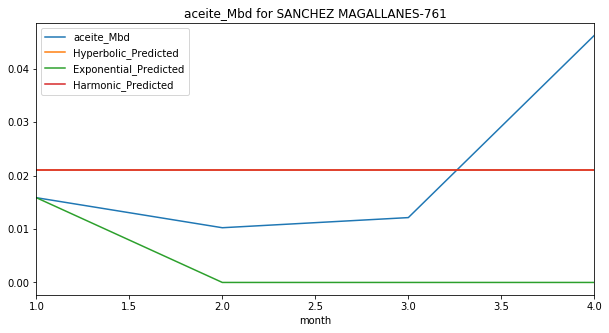

Exponential Fit Curve-fitted Variables: qi=0.2774499999817641, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.33223370167712046, b=1.0769206245934282, di=0.0010662936519378794
Harmonic Fit Curve-fitted Variables: qi=0.3277638219207671, di=0.0009882072151585982


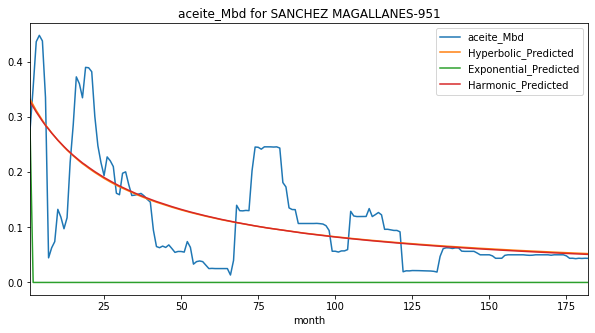

Exponential Fit Curve-fitted Variables: qi=0.015845249274290547, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.39525589651056725, b=0.7381422111784848, di=0.001036848339393918
Harmonic Fit Curve-fitted Variables: qi=0.40797365772711214, di=0.0013051640041841794


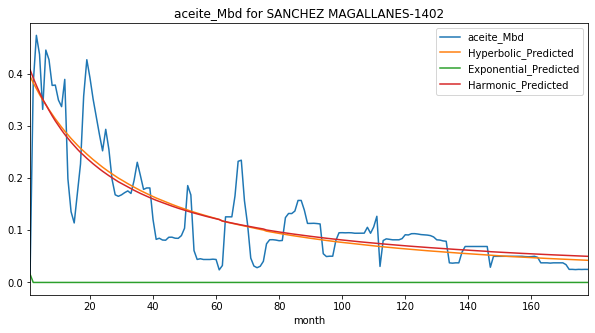

Exponential Fit Curve-fitted Variables: qi=0.034621074132735276, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07757696323085314, b=1.1018120743970622e-12, di=0.0003045559706575988
Harmonic Fit Curve-fitted Variables: qi=0.07706896723081468, di=0.0003245362657067198


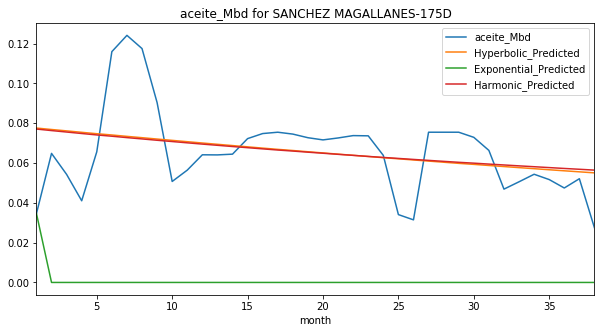

Exponential Fit Curve-fitted Variables: qi=0.010754000393293071, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07947694898380883, b=2.0061213875159562e-09, di=0.0003688902769052118
Harmonic Fit Curve-fitted Variables: qi=0.0800642800576408, di=0.0005756749032169356


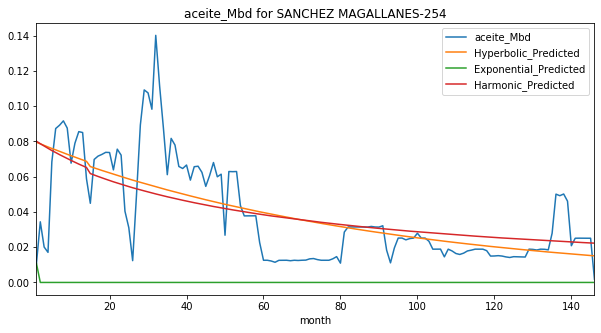

Exponential Fit Curve-fitted Variables: qi=0.16475751269531252, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16481860481600946, b=1.922037679462232, di=0.38693559219898654
Harmonic Fit Curve-fitted Variables: qi=0.1647565239159188, di=0.136431282851713


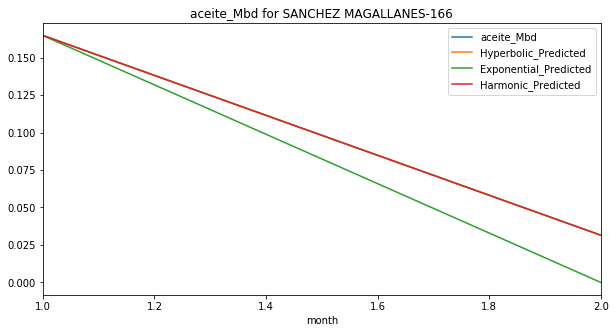

Exponential Fit Curve-fitted Variables: qi=0.01600025390625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.01600025390625, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.01600025390625, di=5.0


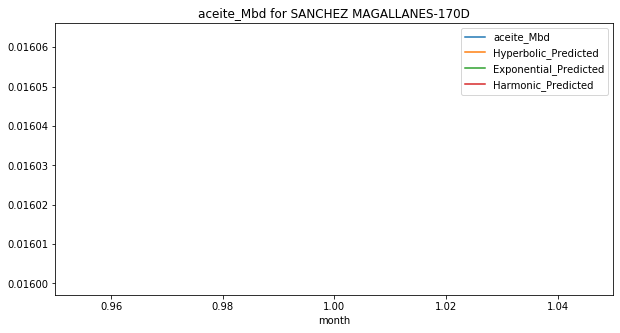

Exponential Fit Curve-fitted Variables: qi=0.10043468029527654, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.4877351321193534, b=0.08383177024199844, di=0.0006051203526594771
Harmonic Fit Curve-fitted Variables: qi=0.5254712236678915, di=0.0012129847999004784


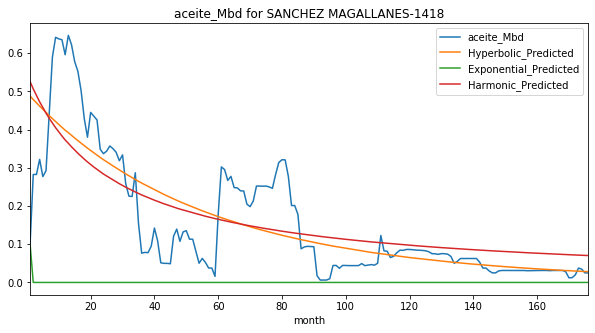

Exponential Fit Curve-fitted Variables: qi=0.07967116663363107, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.24024141807228638, b=0.19082988622322059, di=0.000341775258586742
Harmonic Fit Curve-fitted Variables: qi=0.2611827161015765, di=0.0005931319165259619


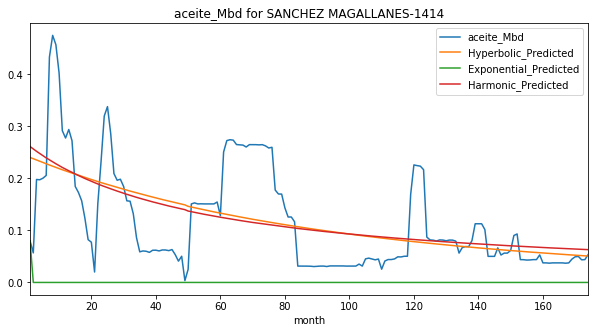

Exponential Fit Curve-fitted Variables: qi=0.01373223132105696, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.044735881652376866, b=2.5834576872159823e-11, di=6.49188240524587e-05
Harmonic Fit Curve-fitted Variables: qi=0.043969354259363054, di=6.439630345674478e-05


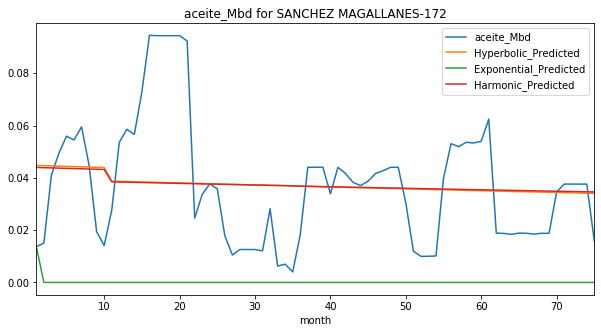

Exponential Fit Curve-fitted Variables: qi=0.011739005433051399, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03278068886840266, b=1.98574003479324e-12, di=2.654715162454162e-17
Harmonic Fit Curve-fitted Variables: qi=0.03278068881872543, di=6.055184109084277e-16


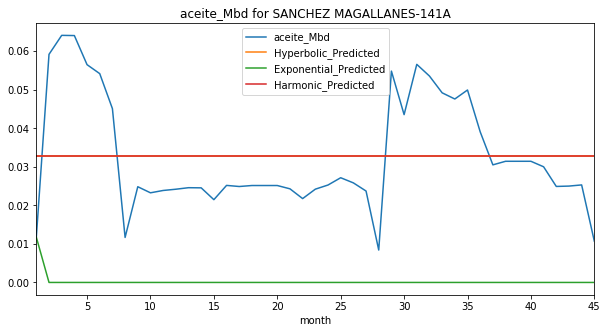

Exponential Fit Curve-fitted Variables: qi=0.007596373721559688, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.01710161379195399, b=1.1318694097998261e-06, di=0.0010158127169765637
Harmonic Fit Curve-fitted Variables: qi=0.016843744390479053, di=0.0008888036551506596


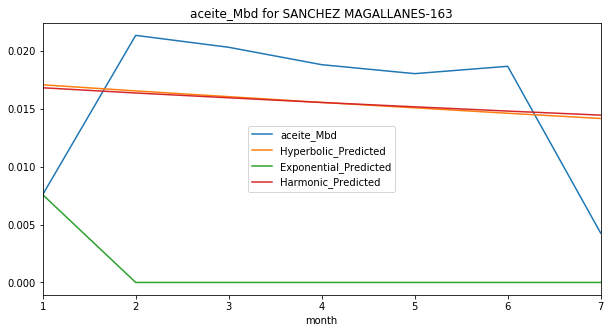

Exponential Fit Curve-fitted Variables: qi=0.18728402254843168, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25839715416043363, b=0.9929025059324624, di=0.000411247785212978
Harmonic Fit Curve-fitted Variables: qi=0.2584856997204565, di=0.0004126988720910573


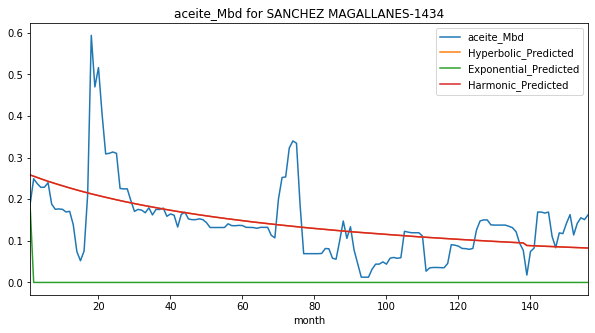

Exponential Fit Curve-fitted Variables: qi=0.0016245937500000002, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0016245937500000002, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.0016245937500000002, di=5.0


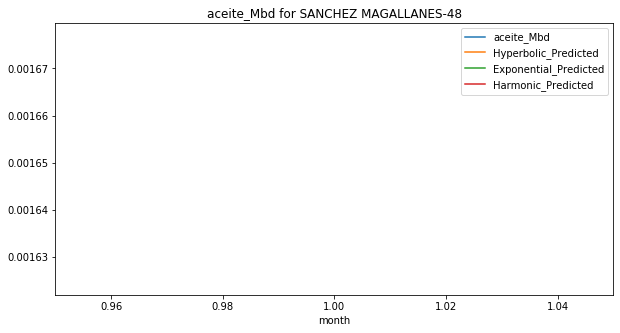

Exponential Fit Curve-fitted Variables: qi=0.04231900001801374, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05915085714298631, b=1.523967074062993e-08, di=4.8174081634959395e-23
Harmonic Fit Curve-fitted Variables: qi=0.059150857135085624, di=6.061325040493514e-18


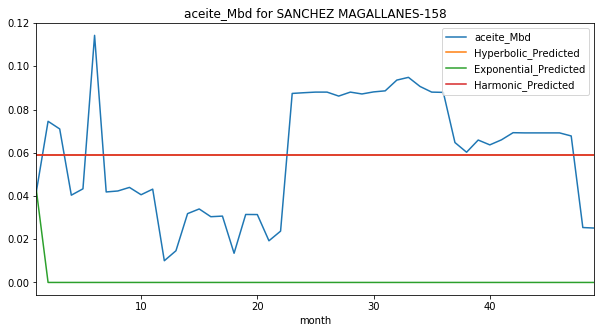

Exponential Fit Curve-fitted Variables: qi=0.20859788221894235, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13729622895532367, b=1.9999999999999314, di=1.628951997958415e-05
Harmonic Fit Curve-fitted Variables: qi=0.13692237002687616, di=1.472350026037247e-05


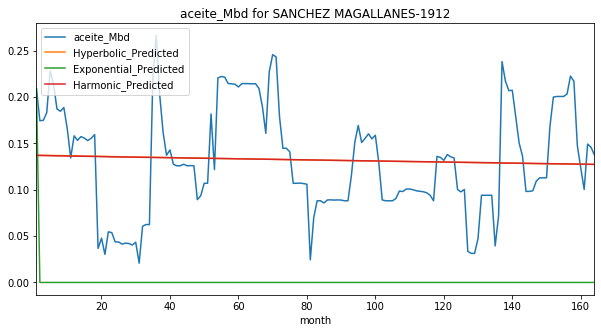

Exponential Fit Curve-fitted Variables: qi=0.12447900253828786, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2906091942454929, b=2.6355579367695754e-11, di=0.0033095527745165823
Harmonic Fit Curve-fitted Variables: qi=0.289775041740009, di=0.0054856062967263705


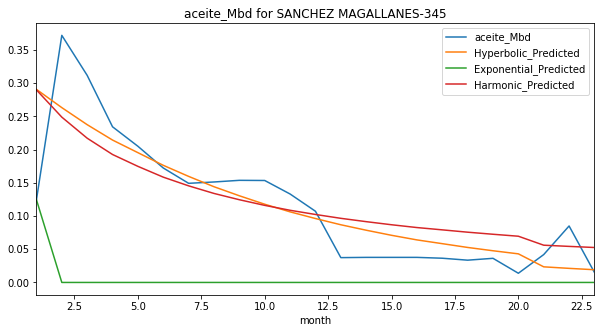

Exponential Fit Curve-fitted Variables: qi=0.05177596664958758, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07559853989628318, b=2.3354868504671978e-08, di=0.0015100411425364808
Harmonic Fit Curve-fitted Variables: qi=0.07462944784704337, di=0.0013549360854696474


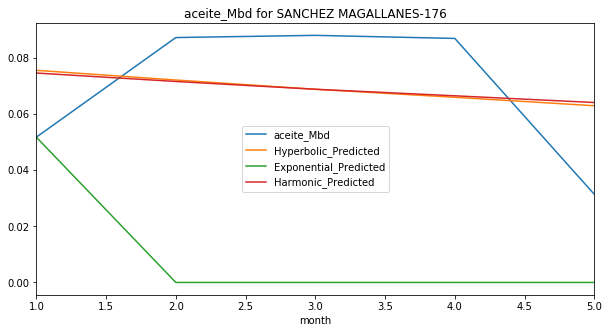

Exponential Fit Curve-fitted Variables: qi=0.0398510009150692, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20485380120196903, b=5.271579310262377e-08, di=0.0004458837159991248
Harmonic Fit Curve-fitted Variables: qi=0.21272546066915504, di=0.0006701031231692536


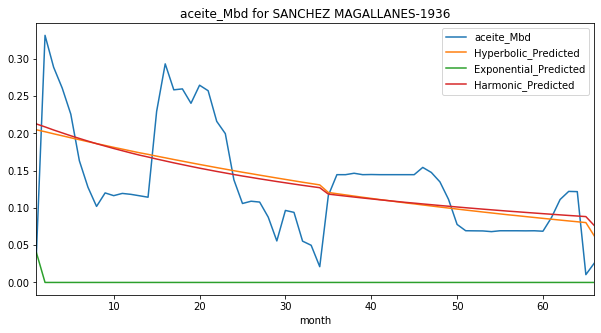

Exponential Fit Curve-fitted Variables: qi=0.1710769950806018, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3061689999766091, b=1.0790047750309584e-09, di=0.0005077306723495031
Harmonic Fit Curve-fitted Variables: qi=0.30616899999999936, di=0.000780918594479958


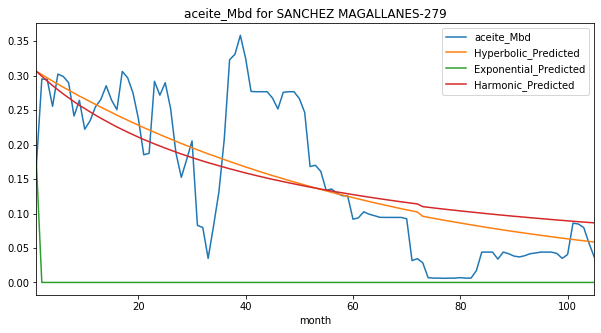

Exponential Fit Curve-fitted Variables: qi=0.024116000061771784, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07996345202477684, b=1.0239447571773368, di=0.0018407370162211525
Harmonic Fit Curve-fitted Variables: qi=0.07991267833671432, di=0.00182135634885146


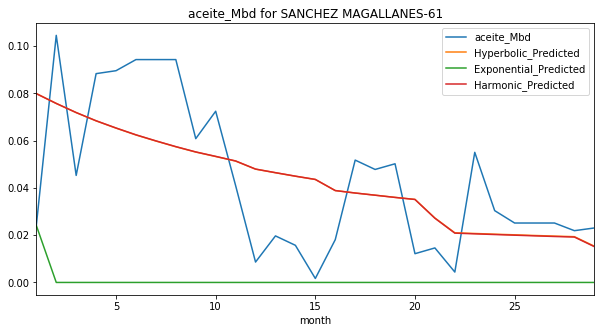

Exponential Fit Curve-fitted Variables: qi=0.04888300002109627, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04958698037060837, b=2.307809029875753e-10, di=7.717391212764112e-05
Harmonic Fit Curve-fitted Variables: qi=0.04849498080558568, di=6.868910533692696e-05


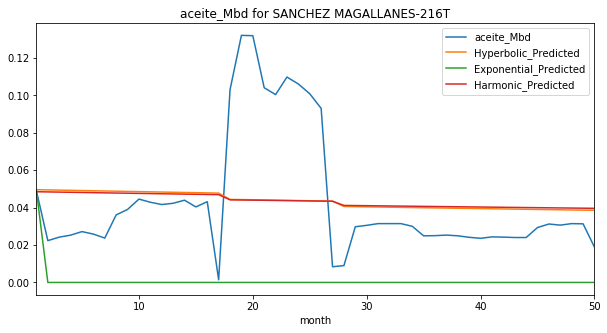

Exponential Fit Curve-fitted Variables: qi=0.043861000194784235, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06506922055042928, b=3.85605585480407e-08, di=6.939514017092773e-09
Harmonic Fit Curve-fitted Variables: qi=0.06506923324668705, di=1.3371703623642305e-09


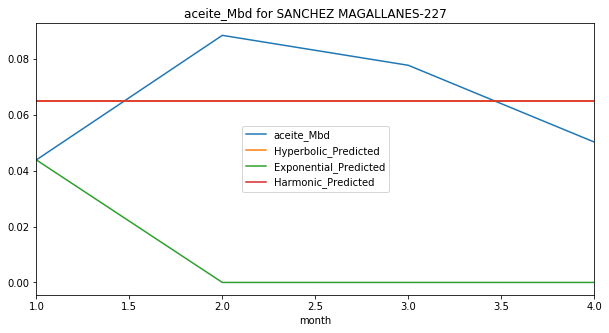

Exponential Fit Curve-fitted Variables: qi=0.13007899967934594, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1378004052688387, b=7.440755688935576e-08, di=0.00016240241176974387
Harmonic Fit Curve-fitted Variables: qi=0.13927832236649415, di=0.00021006237151930982


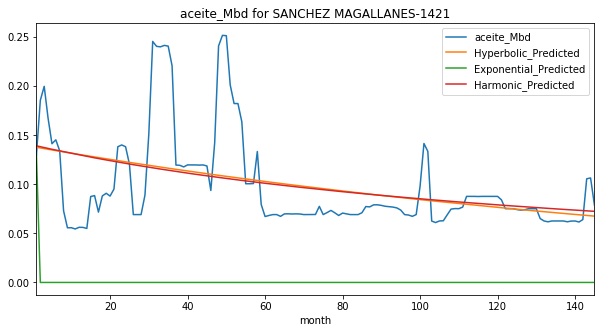

Exponential Fit Curve-fitted Variables: qi=0.04586300003788597, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13978219609365958, b=4.749774274225754e-16, di=0.0001442536976120749
Harmonic Fit Curve-fitted Variables: qi=0.14050098760860888, di=0.0001783096145874497


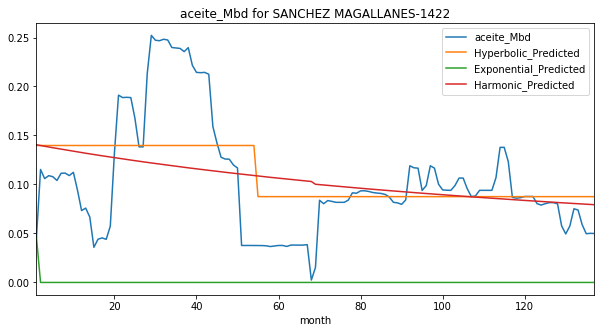

Exponential Fit Curve-fitted Variables: qi=0.06332000001803828, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18947311557243227, b=8.841714366361898e-08, di=0.0002481024500719023
Harmonic Fit Curve-fitted Variables: qi=0.1929511480095506, di=0.00034662411210382126


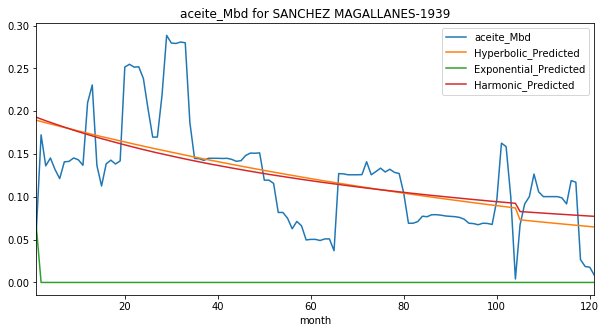

Exponential Fit Curve-fitted Variables: qi=0.042877999949065417, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05124950187470052, b=1.9999999999999927, di=0.0011083080361380545
Harmonic Fit Curve-fitted Variables: qi=0.049828474475811686, di=0.0007553747447047147


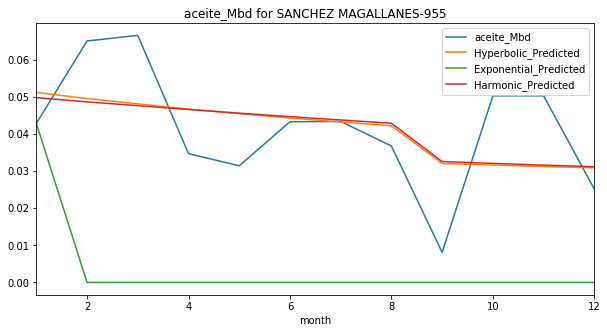

Exponential Fit Curve-fitted Variables: qi=0.0051051931406466975, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15136711718126014, b=3.4526312959059733e-12, di=0.0002794694322297221
Harmonic Fit Curve-fitted Variables: qi=0.14762446689960956, di=0.00036631751077850777


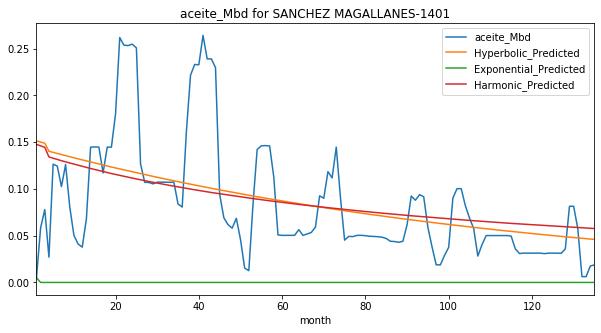

Exponential Fit Curve-fitted Variables: qi=0.26533199711485905, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.23209424478329843, b=1.0179480800615177, di=0.0016272458193987123
Harmonic Fit Curve-fitted Variables: qi=0.23139580222038095, di=0.0015992588494120686


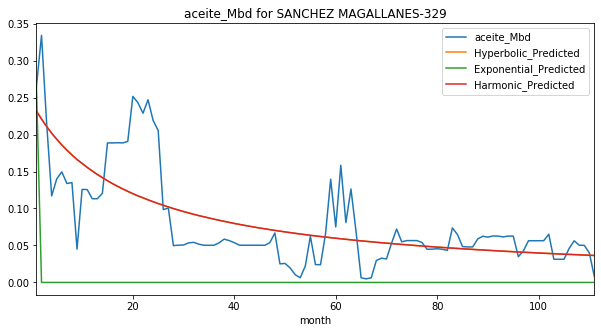

Exponential Fit Curve-fitted Variables: qi=0.0057920625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0057920625, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.0057920625, di=5.0


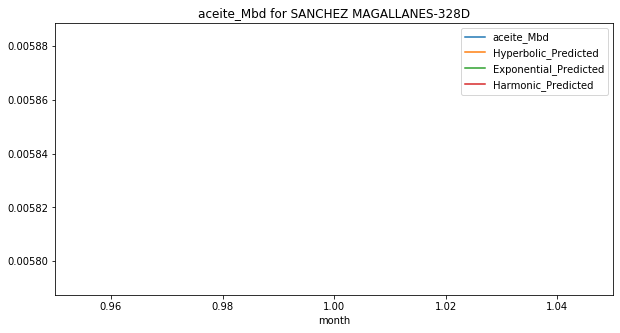

Exponential Fit Curve-fitted Variables: qi=0.005032877349287101, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2791090971851625, b=0.8720519607903305, di=0.002068935471797096
Harmonic Fit Curve-fitted Variables: qi=0.28126561255402177, di=0.002271036599887106


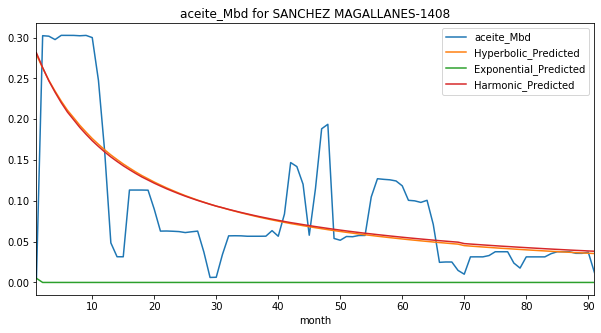

Exponential Fit Curve-fitted Variables: qi=0.24640799991963114, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.26490599999863473, b=3.4721434057291406e-10, di=0.0016541194319145522
Harmonic Fit Curve-fitted Variables: qi=0.26490599999998055, di=0.0025565400340711317


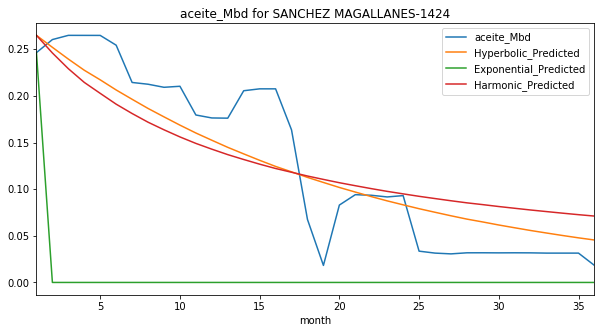

Exponential Fit Curve-fitted Variables: qi=0.10009600000030826, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20979722232342685, b=1.700400386884095, di=0.0024638789173690562
Harmonic Fit Curve-fitted Variables: qi=0.20196179055998878, di=0.0016038034816855964


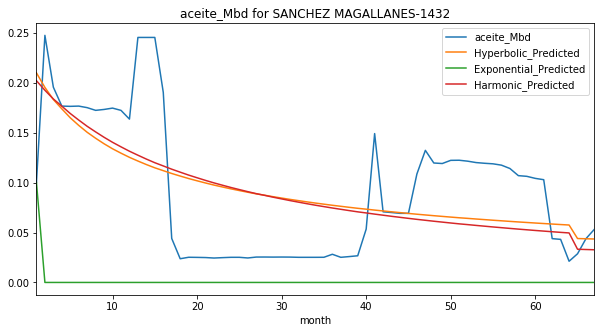

Exponential Fit Curve-fitted Variables: qi=0.0162550000984709, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14489763944463116, b=1.5706554094209986, di=0.001967405670102167
Harmonic Fit Curve-fitted Variables: qi=0.1364935227770797, di=0.0012654433010072736


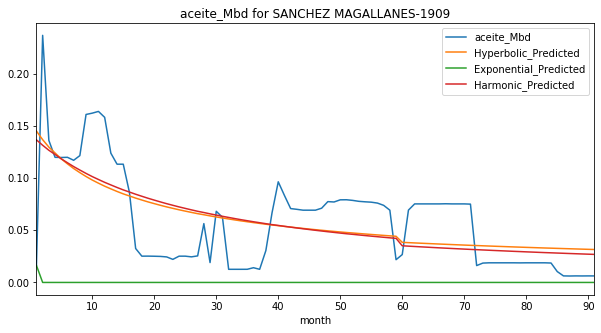

Exponential Fit Curve-fitted Variables: qi=0.22787097445925072, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1996043243043925, b=1.9950181314005881, di=3.541868788234045e-17
Harmonic Fit Curve-fitted Variables: qi=0.1996043243028138, di=1.4860304664872514e-20


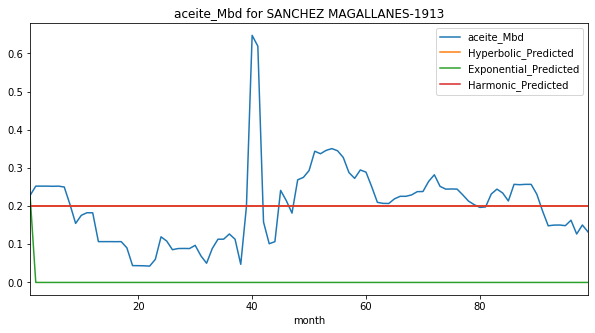

Exponential Fit Curve-fitted Variables: qi=0.009346000200245966, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10385818726844538, b=1.2321550146877745e-09, di=0.00023500043755191996
Harmonic Fit Curve-fitted Variables: qi=0.10300833124948962, di=0.0002644259065011992


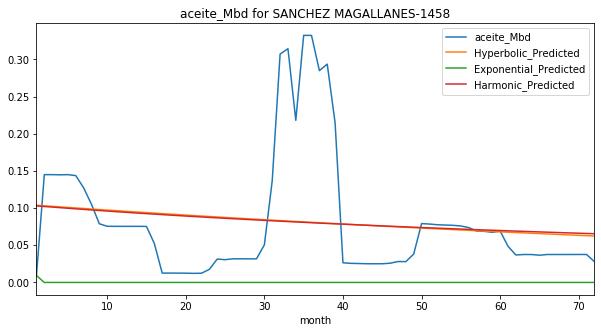

Exponential Fit Curve-fitted Variables: qi=0.1851029999981748, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25226299999999996, b=1.5612209591553816, di=0.0027826155321623363
Harmonic Fit Curve-fitted Variables: qi=0.2474052469126695, di=0.0018706133657014083


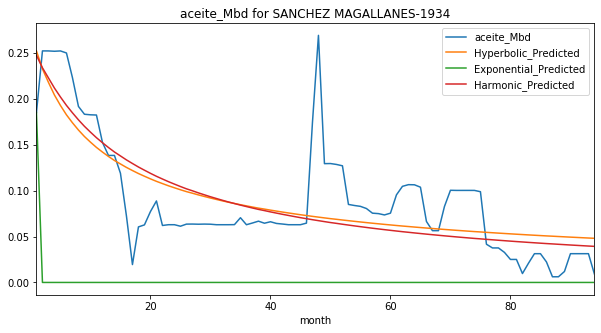

Exponential Fit Curve-fitted Variables: qi=0.12248201407405775, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.27473739580290785, b=5.173367224590561e-11, di=0.0015022952852848971
Harmonic Fit Curve-fitted Variables: qi=0.2735054169848898, di=0.0021798644874551753


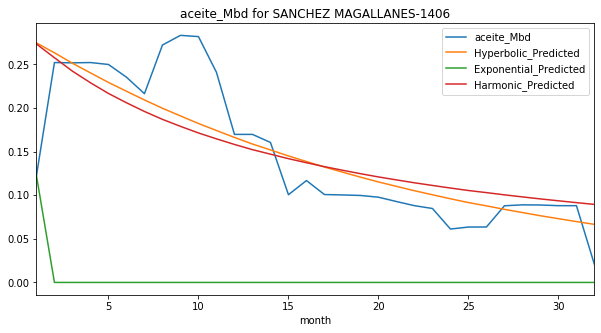

Exponential Fit Curve-fitted Variables: qi=0.08701398003098978, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06647312512355151, b=0.43223142008245113, di=3.106146303445256e-17
Harmonic Fit Curve-fitted Variables: qi=0.06647312475526937, di=1.1271192900296057e-13


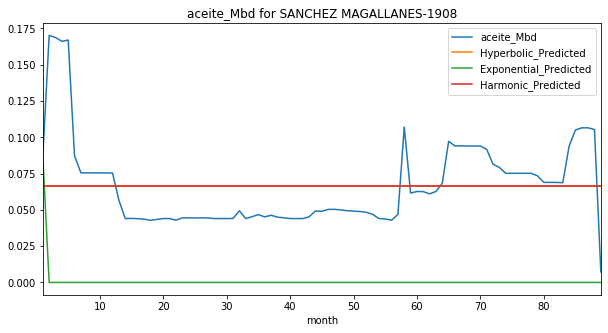

Exponential Fit Curve-fitted Variables: qi=0.03460300430942435, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0553694879712802, b=2.6339808845400467e-07, di=0.003265936332787156
Harmonic Fit Curve-fitted Variables: qi=0.05581582294496896, di=0.004472485807940541


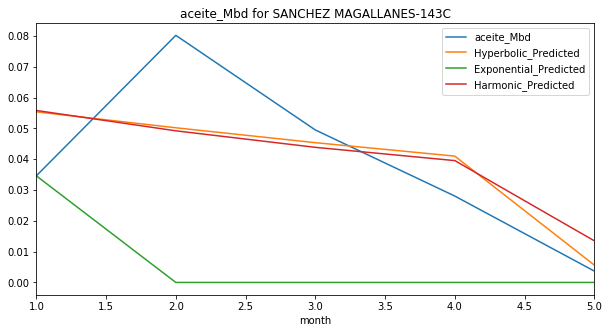

Exponential Fit Curve-fitted Variables: qi=0.22653884962856793, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.24743793210815773, b=1.9999999999999998, di=0.01281846105826669
Harmonic Fit Curve-fitted Variables: qi=0.19486373447390687, di=0.003423744563840471


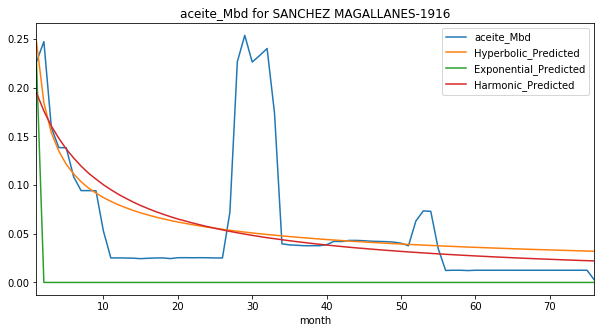

Exponential Fit Curve-fitted Variables: qi=0.06325700002682873, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12260736953884019, b=3.2933371740908614e-07, di=0.0003762860843088017
Harmonic Fit Curve-fitted Variables: qi=0.12460424610081461, di=0.0005400572983455215


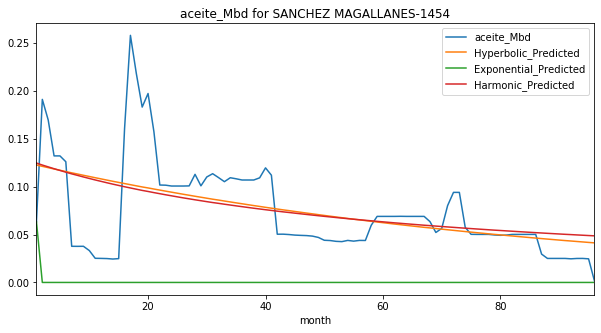

Exponential Fit Curve-fitted Variables: qi=0.013413985286074901, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.013630017234240632, b=0.7857766761745173, di=2.215575323929981e-14
Harmonic Fit Curve-fitted Variables: qi=0.013647197138581462, di=9.387985172318154e-05


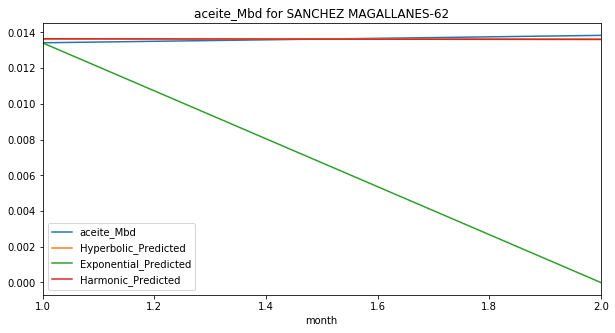

Exponential Fit Curve-fitted Variables: qi=0.006715158806024277, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.042432679567187985, b=2.8019323593746204e-05, di=1.9432581733996508e-15
Harmonic Fit Curve-fitted Variables: qi=0.04243266538611075, di=8.190167792998459e-12


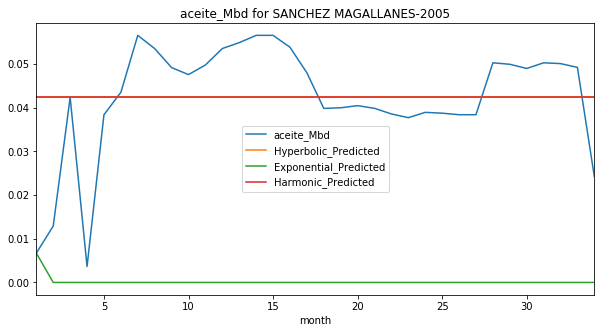

Exponential Fit Curve-fitted Variables: qi=0.02921700000620747, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13410754749365866, b=8.53510405597539e-09, di=0.0061700326175185595
Harmonic Fit Curve-fitted Variables: qi=0.12015427943191366, di=0.00967759601656575


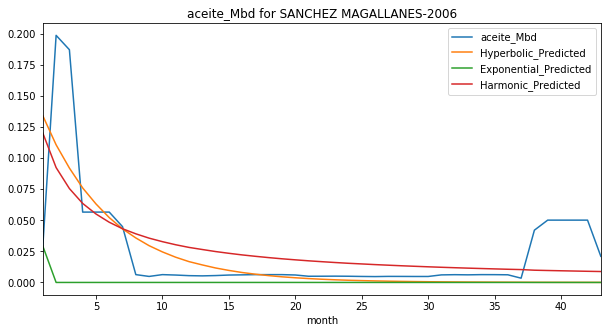

Exponential Fit Curve-fitted Variables: qi=0.01699400915636351, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07026970314992818, b=1.837125451339715, di=0.0011055773811653393
Harmonic Fit Curve-fitted Variables: qi=0.06916684260166966, di=0.0008571973477489205


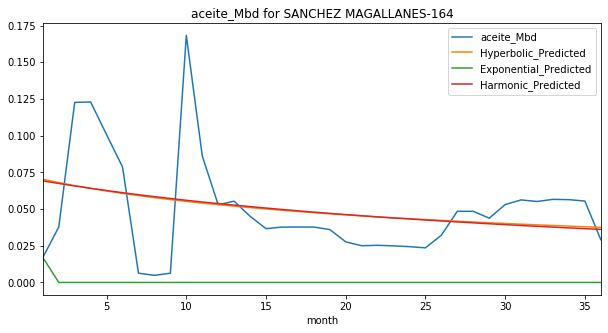

Exponential Fit Curve-fitted Variables: qi=0.04904099988932467, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04795795257385789, b=2.814212477823952e-05, di=0.0001158484015363644
Harmonic Fit Curve-fitted Variables: qi=0.04779174517800155, di=0.00012662490558752615


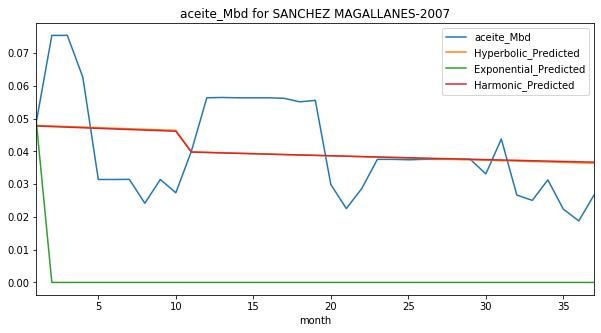

Exponential Fit Curve-fitted Variables: qi=0.04522600012024408, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12534485728012934, b=1.9983522387970034, di=1.1030959699180175e-14
Harmonic Fit Curve-fitted Variables: qi=0.1253448601839392, di=1.3308626010796619e-15


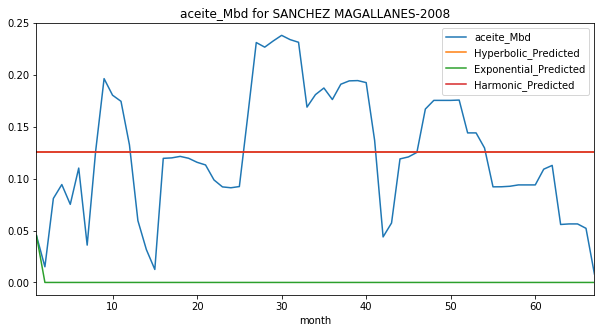

Exponential Fit Curve-fitted Variables: qi=0.01835452580075343, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03852838123333796, b=0.00019306389615492137, di=6.306357833336942e-13
Harmonic Fit Curve-fitted Variables: qi=0.03852838432244187, di=1.238006733093716e-14


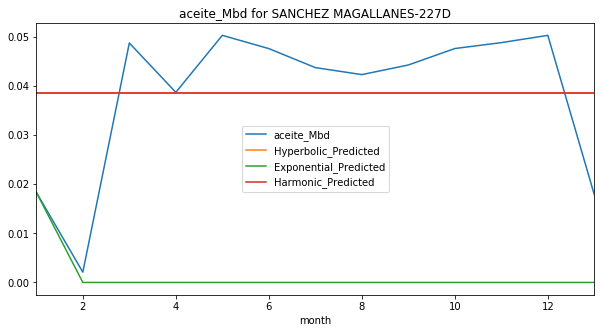

Exponential Fit Curve-fitted Variables: qi=0.006921001018569342, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.021281856735527124, b=1.566331346375022, di=5.942671476993627e-14
Harmonic Fit Curve-fitted Variables: qi=0.02128144676682556, di=1.0388150559079374e-10


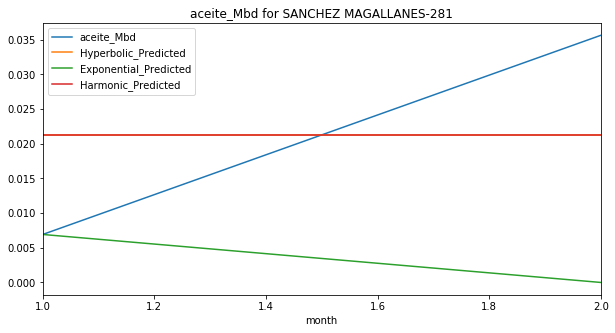

Exponential Fit Curve-fitted Variables: qi=0.023901002695453772, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09294132865854778, b=1.9749477858669792e-06, di=0.0003682596038896353
Harmonic Fit Curve-fitted Variables: qi=0.08920870260482354, di=0.00041744286225002417


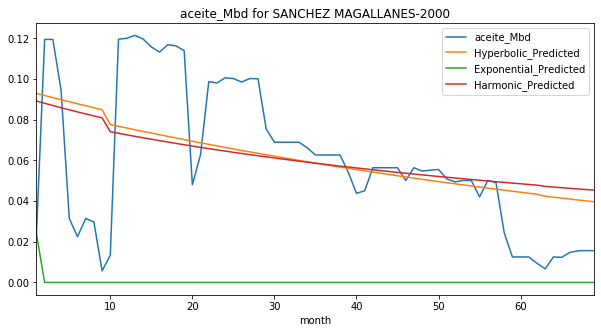

Exponential Fit Curve-fitted Variables: qi=0.13670399910718872, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15842624996249083, b=1.626131259528298e-11, di=0.0013786949345376896
Harmonic Fit Curve-fitted Variables: qi=0.15701284177757632, di=0.0021284301415910533


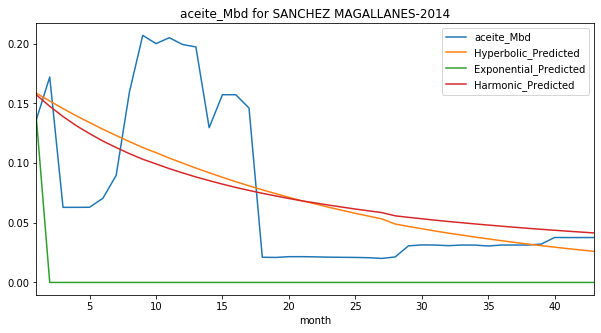

Exponential Fit Curve-fitted Variables: qi=0.014609013352612268, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03617775061171604, b=1.2144638406710904e-08, di=0.00010784017560515956
Harmonic Fit Curve-fitted Variables: qi=0.035616863524907345, di=9.937792619466153e-05


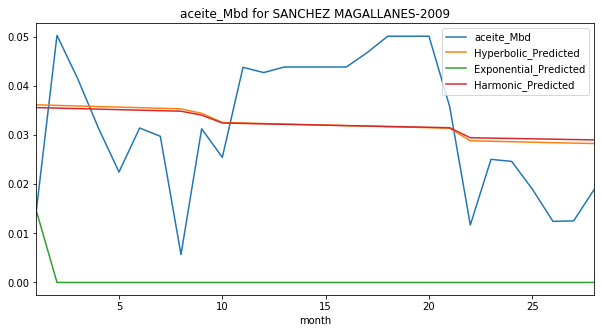

Exponential Fit Curve-fitted Variables: qi=0.019478023371917345, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04766196722187333, b=1.9999999999927147, di=1.5704613424752645e-17
Harmonic Fit Curve-fitted Variables: qi=0.04766196127972122, di=2.0165262744972313e-12


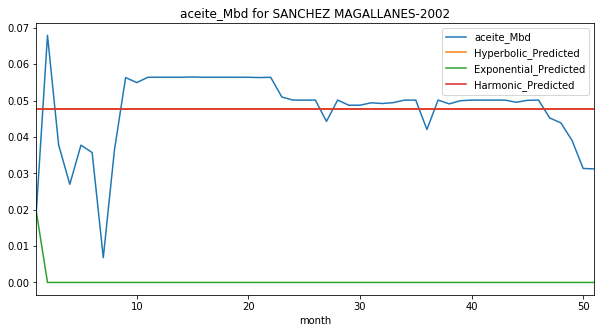

Exponential Fit Curve-fitted Variables: qi=0.019478128282320095, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05891455047832308, b=4.449314826958111e-13, di=7.1903611299905e-05
Harmonic Fit Curve-fitted Variables: qi=0.05785231410835736, di=6.203353789648707e-05


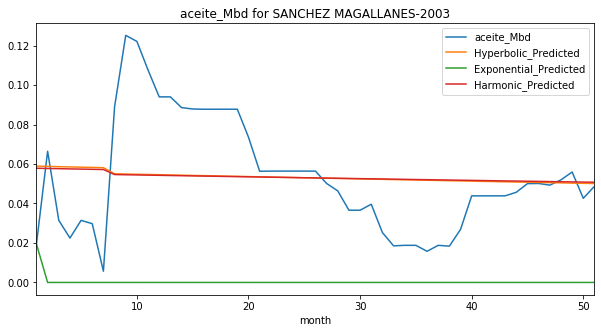

Exponential Fit Curve-fitted Variables: qi=0.17530300370402116, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.40532742269589717, b=1.2020442226631192, di=0.0033838539427740143
Harmonic Fit Curve-fitted Variables: qi=0.4009734035499082, di=0.0029738473499260364


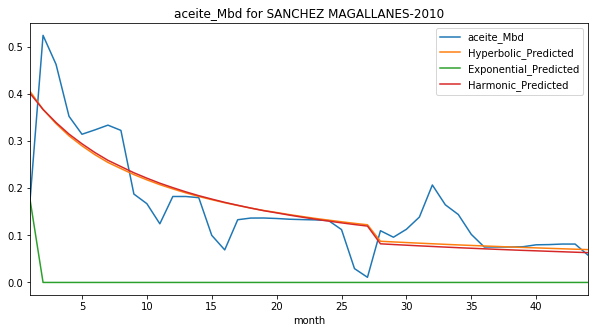

Exponential Fit Curve-fitted Variables: qi=0.004870005103105016, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.039670454362414544, b=2.641237637519322e-07, di=0.0012334648446441986
Harmonic Fit Curve-fitted Variables: qi=0.038793147258922564, di=0.0013601937850764257


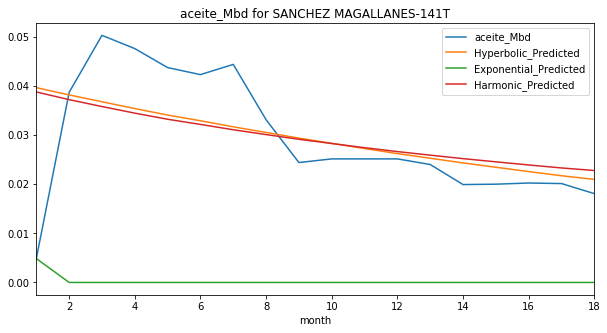

Exponential Fit Curve-fitted Variables: qi=0.37895897178275684, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.4252739260881132, b=1.9999999999999998, di=0.008700563852025065
Harmonic Fit Curve-fitted Variables: qi=0.18026024049670827, di=0.00039589446877520934


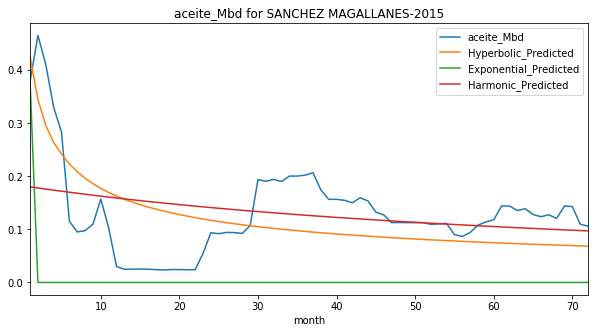

Exponential Fit Curve-fitted Variables: qi=0.10712899989497095, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11882610946304382, b=1.9999999999999998, di=0.0021284623981135033
Harmonic Fit Curve-fitted Variables: qi=0.10289471297875366, di=0.0009028759734288802


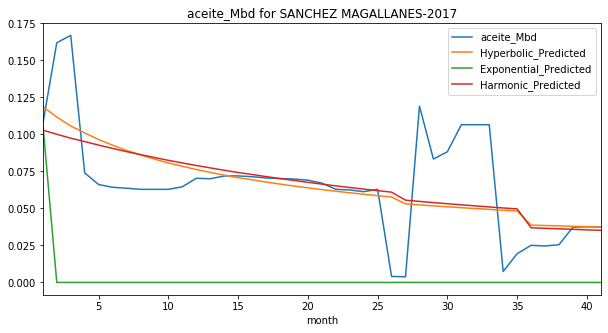

Exponential Fit Curve-fitted Variables: qi=0.062492000001881924, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12185671164470264, b=1.9999999984905104, di=0.003041031944643855
Harmonic Fit Curve-fitted Variables: qi=0.1176623033269309, di=0.0019305881233016452


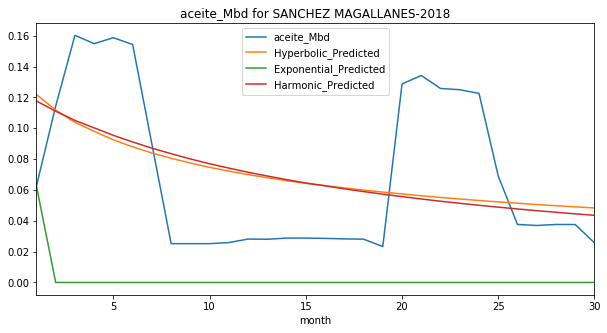

Exponential Fit Curve-fitted Variables: qi=0.014106214212784442, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.049873196540480655, b=3.505358881342178e-08, di=0.00022374118641717088
Harmonic Fit Curve-fitted Variables: qi=0.046959160007273223, di=0.000200642230180111


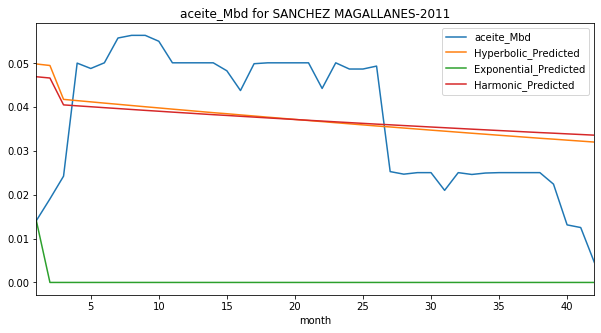

Exponential Fit Curve-fitted Variables: qi=0.043819248046875, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03832747976552944, b=2.3226173762943877e-11, di=0.0005461277586489462
Harmonic Fit Curve-fitted Variables: qi=0.03848183674165525, di=0.0006458602831971359


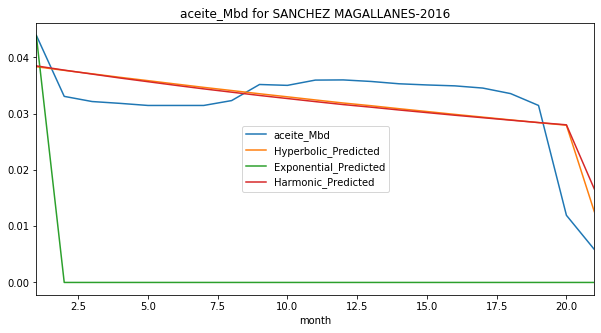

Exponential Fit Curve-fitted Variables: qi=0.1093079335697275, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08622914721427558, b=1.9999999999999998, di=7.12812749190494e-16
Harmonic Fit Curve-fitted Variables: qi=0.08622914731824037, di=7.006128965064187e-19


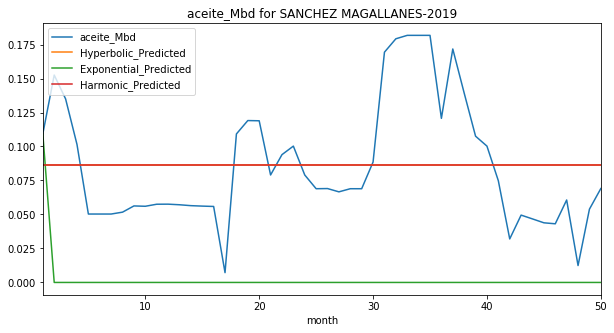

Exponential Fit Curve-fitted Variables: qi=0.015891000328493905, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.087406766704413, b=9.738536136172371e-06, di=5.310989428447066e-15
Harmonic Fit Curve-fitted Variables: qi=0.087406769088538, di=1.0760863371613641e-19


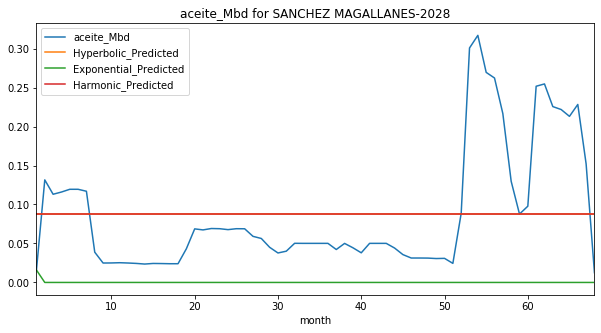

Exponential Fit Curve-fitted Variables: qi=0.25321481165625637, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1476073920672511, b=1.9999999999999998, di=2.0544610767578767e-05
Harmonic Fit Curve-fitted Variables: qi=0.1469356923428851, di=1.5223839597746512e-05


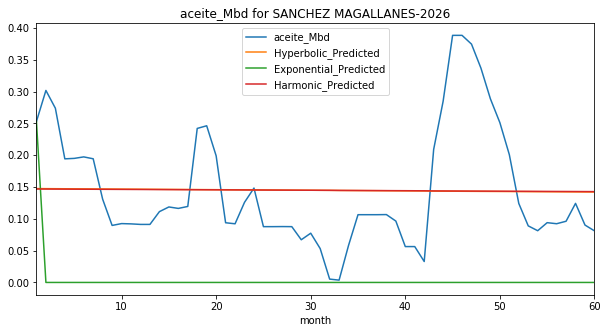

Exponential Fit Curve-fitted Variables: qi=0.06492700139253779, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10348613169366189, b=1.9999970759385295, di=7.049198075659678e-28
Harmonic Fit Curve-fitted Variables: qi=0.10348616127267272, di=4.61856781879397e-16


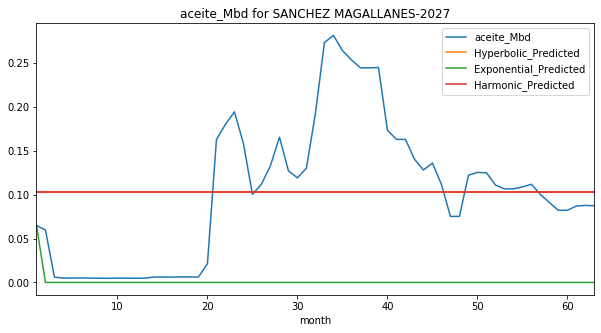

Exponential Fit Curve-fitted Variables: qi=0.16191199999532785, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.24936411257110538, b=0.855472494821952, di=0.004547019376362686
Harmonic Fit Curve-fitted Variables: qi=0.25157532379273656, di=0.005095151196864505


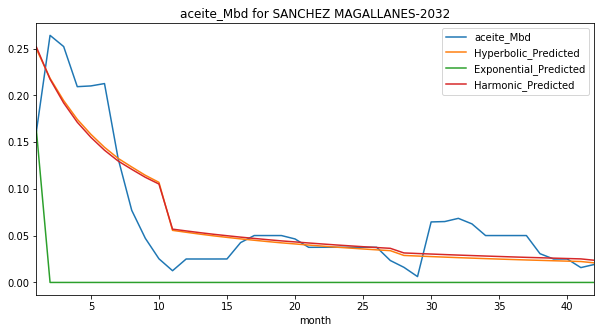

Exponential Fit Curve-fitted Variables: qi=0.02615398647174984, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019913991168897142, b=1.9999999999759976, di=3.5961246451613065e-10
Harmonic Fit Curve-fitted Variables: qi=0.019914012639193294, di=4.480792877313818e-13


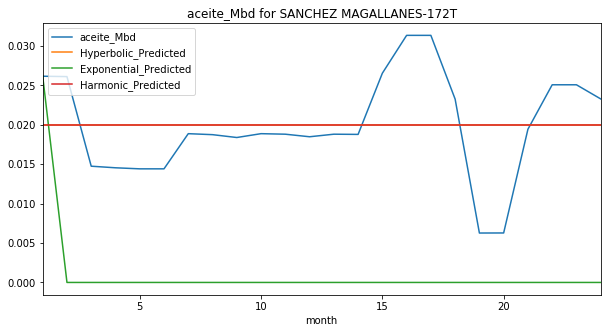

Exponential Fit Curve-fitted Variables: qi=0.062054999985899154, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07169898199737504, b=1.9999999999999498, di=2.29010861066938e-13
Harmonic Fit Curve-fitted Variables: qi=0.07169894787246618, di=8.513330024384779e-11


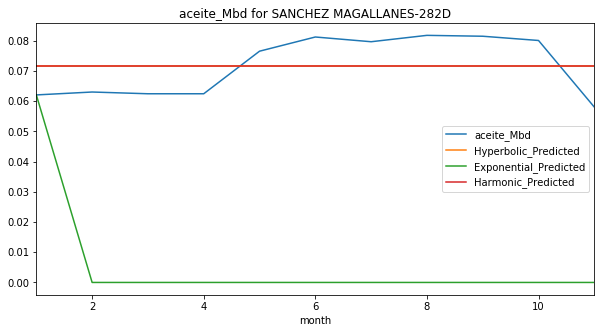

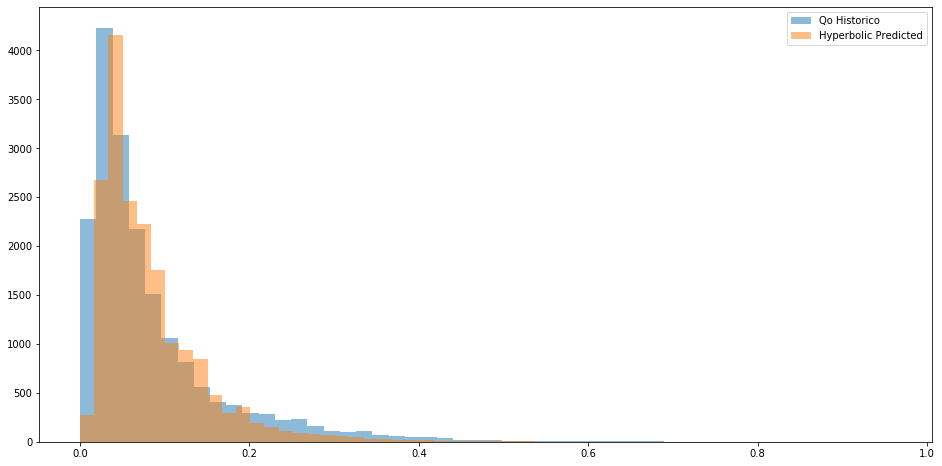

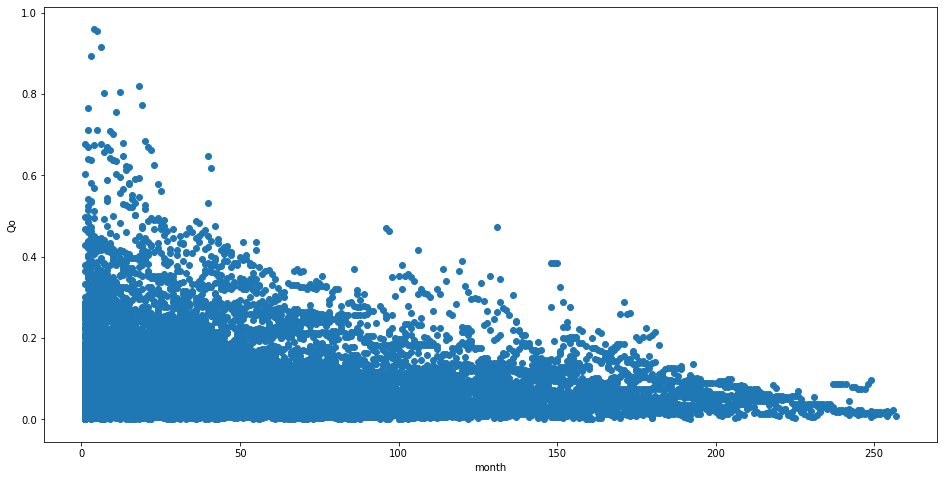

'Tiempo de procesamiento: 583.3465096 segundos'

In [7]:
productividad()

In [8]:
oil=results[['pozo','aceite_Mbd','month']]

df2=oil.groupby('month').mean().reset_index()

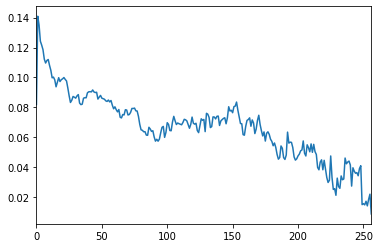

In [21]:
df2.aceite_Mbd.plot()

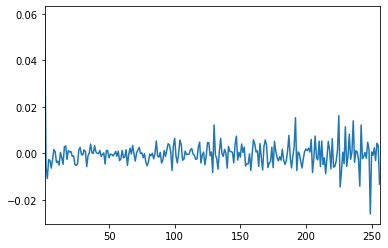

In [10]:
#create a new dataframe to model the difference
df_diff = df2.copy()

#add previous sales to the next row
df_diff['prev_Qo'] = df_diff['aceite_Mbd'].shift(1)

#drop the null values and calculate the difference
df_diff = df_diff.dropna()
df_diff['diff'] = (df_diff['aceite_Mbd'] - df_diff['prev_Qo']) 
df_diff['diff'].plot()

In [11]:
#create dataframe for transformation from time series to supervised
df_supervised = df_diff.drop(['prev_Qo'],axis=1)
#adding lags
for inc in range(1,51):
    field_name = 'lag_' + str(inc)
    df_supervised[field_name] = df_supervised['diff'].shift(inc)
#drop null values
df_supervised = df_supervised.dropna().reset_index(drop=True)

In [12]:
# Import statsmodels.formula.api
import statsmodels.formula.api as smf

# Define the regression formula
model = smf.ols(formula='diff ~ lag_1+lag_2+lag_3+lag_4+lag_5+lag_6+'
                                +'lag_7+lag_8+lag_9+lag_10+lag_11+lag_12+'
                                +'lag_13+lag_14+lag_15+lag_16+lag_17+'
                                +'lag_18+lag_19+lag_20+lag_21+lag_22+'
                                +'lag_23+lag_24+lag_25+lag_26+lag_27+'
                                +'lag_28+lag_29+lag_30+lag_31+lag_32+'
                                +'lag_33+lag_34+lag_35+lag_36+lag_37+'
                                +'lag_38+lag_39+lag_40+lag_41+lag_42+'
                                +'lag_43+lag_44+lag_45+lag_46+lag_47+'
                                +'lag_48+lag_49+lag_50',
                                data=df_supervised)
# Fit the regression
model_fit = model.fit()
# Extract the adjusted r-squared
regression_adj_rsq = model_fit.rsquared_adj
print(regression_adj_rsq)

0.24776198135994965


In [13]:
#import MinMaxScaler and create a new dataframe for LSTM model
from sklearn.preprocessing import MinMaxScaler

df_model = df_supervised.drop(['aceite_Mbd','month'],axis=1)
#split train and test set
train_set, test_set = df_model[0:-25].values, df_model[-25:].values

In [14]:
#apply Min Max Scaler
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler = scaler.fit(train_set)
# reshape training set
train_set = train_set.reshape(train_set.shape[0], train_set.shape[1])
train_set_scaled = scaler.transform(train_set)
# reshape test set
test_set = test_set.reshape(test_set.shape[0], test_set.shape[1])
test_set_scaled = scaler.transform(test_set)

In [15]:
X_train, y_train = train_set_scaled[:, 1:], train_set_scaled[:, 0:1]
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test, y_test = test_set_scaled[:, 1:], test_set_scaled[:, 0:1]
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

In [16]:
model = Sequential()
model.add(LSTM(100, batch_input_shape=(1, X_train.shape[1], X_train.shape[2]), stateful=True))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, nb_epoch=100, batch_size=1, verbose=1, shuffle=False)

Epoch 1/100
181/181 [==============================] - 1s 7ms/step - loss: 0.1070
Epoch 2/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0667
Epoch 3/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0602
Epoch 4/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0563
Epoch 5/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0530
Epoch 6/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0497
Epoch 7/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0461
Epoch 8/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0422
Epoch 9/100
181/181 [==============================] - 1s 3ms/step - loss: 0.0381
Epoch 10/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0339
Epoch 11/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0298
Epoch 12/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0262
Epoch 13/100


181/181 [==============================] - ETA: 0s - loss: 0.001 - 1s 4ms/step - loss: 0.0016
Epoch 100/100
181/181 [==============================] - 1s 4ms/step - loss: 0.0020


In [17]:
y_pred = model.predict(X_test,batch_size=1)
#for multistep prediction, you need to replace X_test values with the predictions coming from t-1

In [18]:
#reshape y_pred
y_pred = y_pred.reshape(y_pred.shape[0], 1, y_pred.shape[1])
#rebuild test set for inverse transform
pred_test_set = []
for index in range(0,len(y_pred)):
    print(np.concatenate([y_pred[index],X_test[index]],axis=1))
    pred_test_set.append(np.concatenate([y_pred[index],X_test[index]],axis=1))
#reshape pred_test_set
pred_test_set = np.array(pred_test_set)
pred_test_set = pred_test_set.reshape(pred_test_set.shape[0], pred_test_set.shape[2])
#inverse transform
pred_test_set_inverted = scaler.inverse_transform(pred_test_set)

[[-0.21794733 -0.4228782   0.68908224 -0.34825003 -0.02404854 -0.57760799
  -1.45839458  1.0761831  -0.15298126 -0.55192058 -0.7383236  -0.76711757
   0.25063239 -0.82831343 -0.14979774  0.15378574 -0.4045341  -1.0424284
  -0.46284652 -0.7152224   0.15013477 -0.78047566  0.14652    -0.5381905
  -0.46314362  0.33170402 -0.45810384 -1.00421792  0.20734798 -0.25531075
  -0.11635897 -0.20302868 -0.13983775 -0.23205418 -0.49021017 -0.83737784
  -0.59671167 -0.31961746 -0.24772804 -0.93137437  1.30218462  0.08691309
  -0.32083119 -0.81290777 -0.349914    0.55719151 -0.09270171 -0.50687209
  -0.47364807 -0.3179462  -0.63786262]]
[[ 0.60302114 -0.13861405 -0.4228782   0.68908224 -0.34825003 -0.02404854
  -0.93919147 -1.47585554  1.0761831  -0.15298126 -0.55192058 -0.7383236
  -0.76711757  0.25063239 -0.82831343 -0.14979774  0.15378574 -0.43433017
  -1.0424284  -0.46284652 -0.7152224   0.15013477 -0.78047566  0.14652
  -0.5381905  -0.46314362  0.33170402 -0.46117892 -1.00421792  0.20734798
  -0

In [19]:
#create dataframe that shows the predicted sales
result_list = []
sales_dates = list(df2[50:].month)
#display(sales_dates)
act_sales = list(df2[50:].aceite_Mbd)
#display(act_sales)
for index in range(0,len(pred_test_set_inverted)):
    result_dict = {}
    result_dict['pred_value'] = int(pred_test_set_inverted[index][0] + act_sales[index])
    result_dict['month'] = sales_dates[index+1]
    result_list.append(result_dict)
df_result = pd.DataFrame(result_list)
#for multistep prediction, replace act_sales with the predicted sales
#merge with actual sales dataframe
df_sales_pred = pd.merge(df2,df_result,on='month',how='left')

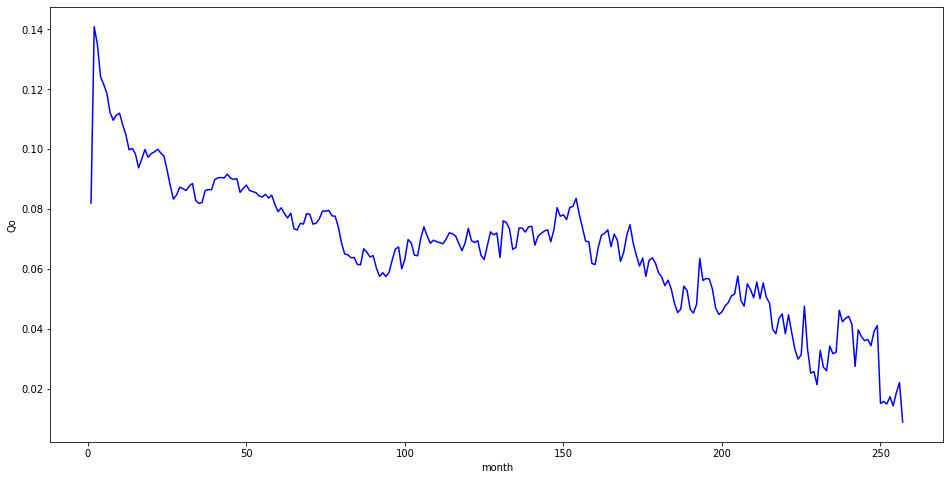

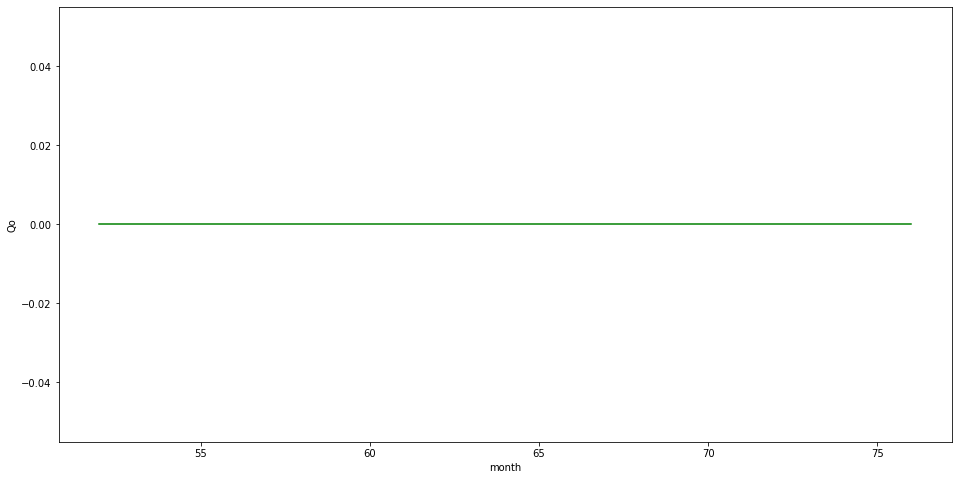

In [20]:
fig4, ax4 = plt.subplots(figsize=(16,8))
ax4.plot(df_sales_pred['month'],df_sales_pred['aceite_Mbd'],color='Blue')
ax4.set_xlabel('month')
ax4.set_ylabel('Qo')
plt.show()

fig5, ax5 = plt.subplots(figsize=(16,8))
ax5.plot(df_sales_pred['month'],df_sales_pred['pred_value'],color='Green')
ax5.set_xlabel('month')
ax5.set_ylabel('Qo')
plt.show()

Segmentar el df por dia de max produccion en adelante

# Change Point Detection

# Binary segmentation method

In [ ]:
unico=pd.unique(list(oil.pozo))
for pozo in unico:
        #Subset the dataframe by Well
        cpd_set=oil[oil.pozo==pozo]
        points=np.array(cpd_set.aceite_Mbd)

        model = "l2"  
        algo = rpt.Binseg(model=model).fit(points)
        my_bkps = algo.predict(n_bkps=1_000_000)
        # show results
        rpt.show.display(points, my_bkps, figsize=(10, 6),scalex=False)
        plt.title('Change Point Detection: Binary Segmentation Search Method')
        plt.show()

# Pelt search method

In [ ]:
unico=pd.unique(list(oil.pozo))
for pozo in unico:
        #Subset the dataframe by Well
        cpd_set=oil[oil.pozo==pozo]
        points=np.array(cpd_set.aceite_Mbd)

        model="rbf"
        algo = rpt.Pelt(model=model).fit(points)
        result = algo.predict(pen=1_000)
        rpt.display(points, result, figsize=(10, 6))
        plt.title('Change Point Detection: Pelt Search Method')
        plt.show()

# Dynamic programming search method

In [ ]:
unico=pd.unique(list(oil.pozo))
for pozo in unico:
        #Subset the dataframe by Well
        cpd_set=oil[oil.pozo==pozo]
        points=np.array(cpd_set.aceite_Mbd)

        model = "l1"  
        algo = rpt.Dynp(model=model, min_size=3, jump=5).fit(points)
        my_bkps = algo.predict(n_bkps=10)
        rpt.show.display(points, my_bkps, figsize=(10, 6))
        plt.title('Change Point Detection: Dynamic Programming Search Method')
        plt.show()

# Window-based search method

In [ ]:
unico=pd.unique(list(oil.pozo))
for pozo in unico:
        #Subset the dataframe by Well
        cpd_set=oil[oil.pozo==pozo]
        points=np.array(cpd_set.aceite_Mbd)
        
        model = "l2"  
        algo = rpt.Window(width=40, model=model).fit(points)
        my_bkps = algo.predict(n_bkps=1_000)
        rpt.show.display(points, my_bkps, figsize=(10, 6))
        plt.title('Change Point Detection: Window-Based Search Method')
        plt.show()

In [ ]:
from scipy import stats

outliers=[]
def detect_outlier(data_1):
    global z_score
    global outliers
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    
    
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y)
    return z_score

In [ ]:
score=[]
def outlier_filter(data):
    global score
    global outliers
    threshold=3
    mean_1 = np.mean(data)
    std_1 =np.std(data)
    
    
    for y in data:
        z = (y - mean_1)/std_1 
        score.append(z)
    return score

In [ ]:
df=campo
outliers=outlier_filter(df.aceite_Mbd)


In [ ]:
display(score)